In [102]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import textwrap
from scipy import stats
from scipy.stats.mstats import winsorize
from pandas import Grouper
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Perceptron
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer



from sklearn.ensemble import IsolationForest
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from tensorflow.keras import models, layers, callbacks
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, confusion_matrix,
    roc_curve, precision_recall_curve, classification_report,average_precision_score, auc
)
from tensorflow.keras import layers, models, optimizers


In [23]:
DATA_PATH = "data_set.csv"

df = pd.read_csv(DATA_PATH)

print("Dimensiones del dataset (filas, columnas):", df.shape)
display(df.head())

print("\nInformación de tipos de datos:")
display(df.info())

print("\nResumen numérico:")
display(df.describe())

Dimensiones del dataset (filas, columnas): (636166, 6)


,ID,rule_name,FECHA_CREACION,HORA_CREACION,TIPO,token_rut
0,APP-26-967322,-,13-07-2025,11:34:29,AUTOMATICA,9D04B9
1,APP-36-15112,-,13-07-2025,11:33:34,AUTOMATICA,C5D5A6
2,9344792825,ALERT GOOGLE,13-07-2025,11:32:00,AUTOMATICA,EF6D5D
3,9344794391,ALERT GOOGLE,13-07-2025,11:32:00,AUTOMATICA,EF6D5D
4,9344786173,CC ALERTA BILLETERA DATE TOKEN,13-07-2025,11:32:00,AUTOMATICA,6B34D3



Información de tipos de datos:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 636166 entries, 0 to 636165
Data columns (total 6 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   ID              636166 non-null  object
 1   rule_name       636166 non-null  object
 2   FECHA_CREACION  636166 non-null  object
 3   HORA_CREACION   636166 non-null  object
 4   TIPO            636166 non-null  object
 5   token_rut       636166 non-null  object
dtypes: object(6)
memory usage: 29.1+ MB


None


Resumen numérico:


,ID,rule_name,FECHA_CREACION,HORA_CREACION,TIPO,token_rut
count,636166,636166,636166,636166,636166,636166
unique,635914,51,303,58515,2,369124
top,BTO-1-18435,-,06-10-2025,16:28:00,AUTOMATICA,D712F4
freq,10,390764,13602,1238,582054,595


In [24]:
# Limpieza de textos en columnas clave
cols_texto = ['rule_name', 'ID', 'token_rut', 'TIPO']
for c in cols_texto:
    if c in df.columns:
        df[c] = df[c].astype(str).str.strip().str.upper()
    else:
        print(f"[ADVERTENCIA] La columna '{c}' no se encuentra en el dataset.")

# Normalización de nombres de reglas (RULE_NORM)
map_rulename = {
    'OS_WPP_WEB RECAUDA.3ROS HITES': 'OS_WPP_WEB_RECAUDA.3ROS_HITES',
    'OS_WEBPAY_WEB LIDER.CL':        'OS_WEBPAY_WEB_LIDER.CL',
    'OS_WEBPAY HITES':               'OS_WEBPAY_HITES',
    'OS_WEBPAY WEB PAGADOOR':        'OS_WEBPAY_WEB_PAGADOOR',
    'OS_WEBPAY PRONTO PAGA':         'OS_WEBPAY_PRONTO_PAGA',
    'ALERT GOOGLE':                  'ALERT_GOOGLE',
    'ALERTA BILLETERA BE PAY':       'ALERTA_BILLETERA_BE_PAY',
    'CC S.ALERTA BILLETERA DATE TOKEN': 'CC_S.ALERTA_BILLETERA_DATE_TOKEN',
    'CC BLOQ TARJETA FUERZA BRUTA':  'CC_BLOQ_TARJETA_FUERZA_BRUTA',
    'OS_WEBPAY_WEB LIDER ONE CLICK': 'OS_WEBPAY_WEB_LIDER_ONE_CLICK',
    'OS_WEBPAY LIDER ONE CLICK':     'OS_WEBPAY_WEB_LIDER_ONE_CLICK',
    'CC CCIO PRUEBA BANDA':          'CC_CCIO_PRUEBA_BANDA',
    'CC ECOMMERCE SCORE ALTO':       'CC_ECOMMERCE_SCORE_ALTO',
    'CC FACEBOOK 2.0':               'CC_FACEBOOK_2.0',
    'CC LC ALERT POR MONTO':         'CC_LC_ALERT_POR_MONTO',
    'CC VALIDA PRIM. TRX MP WALLET': 'CC_VALIDA_PRIM._TRX_MP_WALLET',
    'CC SUPLANTACION 3DS':           'CC_SUPLANTACION_3DS',
    'CC TX CONSECUTIVA ECOMMERCE':   'CC_TX_CONSECUTIVA_ECOMMERCE',
    'CC TX PARALELAS NAC INT':       'CC_TX_PARALELAS_NAC_INT',
    'OS WEB MONEYGRAM PAYMENT':      'OS_WEB_MONEYGRAM_PAYMENT',
    'OS WEB PK COMERCIOS EN LINEA':  'OS_WEB_PK_COMERCIOS_EN_LINEA',
    'OS WEBPAY AFEX':                'OS_WEBPAY_AFEX',
    'CC PILOTO SCORE VAAI':          'CC_PILOTO_SCORE_VAAI',
    'OS WEBPAY ALPS Y NUVEI':        'OS_WEBPAY_ALPS_Y_NUVEI'
}

df['RULE_NORM'] = df['rule_name'].map(map_rulename).fillna(df['rule_name'])
df['RULE_NORM'] = (df['RULE_NORM']
                   .str.replace(" ", "_", regex=False)
                   .str.replace("__+", "_", regex=True))

# Construcción de variable ALERTA
id_str = df['ID'].astype(str).str.strip()
mask_num = id_str.str.fullmatch(r"\d+")
prefijo_id = id_str.str.extract(r"^([^-\s]+-[^-]+)", expand=False)

df['ALERTA'] = np.where(mask_num, df['RULE_NORM'], prefijo_id.fillna(df['RULE_NORM']))
df['ALERTA'] = (df['ALERTA']
                .str.replace(" ", "_", regex=False)
                .str.replace("__+", "_", regex=True))

# Identificador numérico de cliente
df['CLIENTE_ID'] = df['token_rut'].astype('category').cat.codes.astype('int64')

# Construcción de fecha-hora de la alerta
df['FECHA_ALERTA'] = pd.to_datetime(
    df['FECHA_CREACION'].astype(str) + " " + df['HORA_CREACION'].astype(str),
    format="%d-%m-%Y %H:%M:%S",
    errors='coerce'
)

#  Codificación numérica de tipo de alerta
df['TIPO_N'] = df['TIPO'].map({'MANUAL': 1, 'AUTOMATICA': 2}).astype('int64')

# Convertir FECHA_ALERTA a solo fecha (sin hora)
df['FECHA_ALERTA'] = pd.to_datetime(df['FECHA_ALERTA']).dt.date

# Volver a datetime pero solo con fecha (00:00:00 internamente)
df['FECHA_ALERTA'] = pd.to_datetime(df['FECHA_ALERTA'])


print("Dataset normalizado : \n")
print("\n")
display(df.head())

print("\nValores nulos por columna:")
display(df.isna().sum())

Dataset normalizado : 





,ID,rule_name,FECHA_CREACION,HORA_CREACION,TIPO,token_rut,RULE_NORM,ALERTA,CLIENTE_ID,FECHA_ALERTA,TIPO_N
0,APP-26-967322,-,13-07-2025,11:34:29,AUTOMATICA,9D04B9,-,APP-26,226330,2025-07-13,2
1,APP-36-15112,-,13-07-2025,11:33:34,AUTOMATICA,C5D5A6,-,APP-36,285238,2025-07-13,2
2,9344792825,ALERT GOOGLE,13-07-2025,11:32:00,AUTOMATICA,EF6D5D,ALERT_GOOGLE,ALERT_GOOGLE,345244,2025-07-13,2
3,9344794391,ALERT GOOGLE,13-07-2025,11:32:00,AUTOMATICA,EF6D5D,ALERT_GOOGLE,ALERT_GOOGLE,345244,2025-07-13,2
4,9344786173,CC ALERTA BILLETERA DATE TOKEN,13-07-2025,11:32:00,AUTOMATICA,6B34D3,CC_ALERTA_BILLETERA_DATE_TOKEN,CC_ALERTA_BILLETERA_DATE_TOKEN,154086,2025-07-13,2



Valores nulos por columna:


ID                0
rule_name         0
FECHA_CREACION    0
HORA_CREACION     0
TIPO              0
token_rut         0
RULE_NORM         0
ALERTA            0
CLIENTE_ID        0
FECHA_ALERTA      0
TIPO_N            0
dtype: int64

In [25]:
df = df[['ALERTA', 'CLIENTE_ID', 'FECHA_ALERTA']].copy()
df['ALERTA'] = df['ALERTA'].astype(str).str.strip().str.upper()
df['CLIENTE_ID'] = df['CLIENTE_ID'].astype(str).str.strip().str.upper()
df['FECHA_ALERTA'] = pd.to_datetime(df['FECHA_ALERTA'], format="%d-%m-%Y", errors='coerce')

df_diario = (
    df.groupby(['FECHA_ALERTA','ALERTA'])
      .agg(
          cant_diaria=('ALERTA','count'),
          rut_unicos_diarios=('CLIENTE_ID','nunique')
      )
      .reset_index()
)

df_diario['anio']   = df_diario['FECHA_ALERTA'].dt.year
df_diario['mes']    = df_diario['FECHA_ALERTA'].dt.month
df_diario['semana'] = df_diario['FECHA_ALERTA'].dt.isocalendar().week
df_diario['dia_mes'] = df_diario['FECHA_ALERTA'].dt.day


In [26]:
# Cantidad semanal por ALERTA
df_diario['cant_semana'] = df_diario.groupby(
    ['ALERTA','anio','semana']
)['cant_diaria'].transform('sum')

# Cantidad mensual por ALERTA
df_diario['cant_mes'] = df_diario.groupby(
    ['ALERTA','anio','mes']
)['cant_diaria'].transform('sum')

# RUTs únicos por semana (suma de los diarios)
df_diario['rut_semana'] = df_diario.groupby(
    ['ALERTA','anio','semana']
)['rut_unicos_diarios'].transform('sum')

# RUTs únicos por mes (suma de los diarios)
df_diario['rut_mes'] = df_diario.groupby(
    ['ALERTA','anio','mes']
)['rut_unicos_diarios'].transform('sum')

df_diario.head()


,FECHA_ALERTA,ALERTA,cant_diaria,rut_unicos_diarios,anio,mes,semana,dia_mes,cant_semana,cant_mes,rut_semana,rut_mes
0,2025-01-01,ALERTA_BILLETERA_BE_PAY,2,1,2025,1,1,1,4,17,3,12
1,2025-01-01,ALERT_GOOGLE,248,110,2025,1,1,1,1064,6745,491,3035
2,2025-01-01,APP-13,15,14,2025,1,1,1,140,1118,129,1030
3,2025-01-01,APP-16,10,7,2025,1,1,1,52,266,28,157
4,2025-01-01,APP-18,21,21,2025,1,1,1,262,1639,257,1610


In [27]:
# Semana del mes (1 = primera semana del mes, 2 = segunda, etc.)
df_diario['semana_mes'] = ((df_diario['dia_mes'] - 1) // 7) + 1

# Flag de "inicio de mes" por si lo quieres usar después
df_diario['es_inicio_mes'] = (df_diario['dia_mes'] <= 7).astype(int)

df_diario[['FECHA_ALERTA','ALERTA','dia_mes','semana','semana_mes','es_inicio_mes']].head()


,FECHA_ALERTA,ALERTA,dia_mes,semana,semana_mes,es_inicio_mes
0,2025-01-01,ALERTA_BILLETERA_BE_PAY,1,1,1,1
1,2025-01-01,ALERT_GOOGLE,1,1,1,1
2,2025-01-01,APP-13,1,1,1,1
3,2025-01-01,APP-16,1,1,1,1
4,2025-01-01,APP-18,1,1,1,1


In [28]:
# Tabla única por ALERTA, año y semana
df_sem = df_diario[['ALERTA','anio','semana','cant_semana']].drop_duplicates()

# Ordenamos por ALERTA y semana
df_sem = df_sem.sort_values(by=['ALERTA','anio','semana'])

# Semana anterior: cantidad total de alertas de la semana previa de esa ALERTA
df_sem['cant_semana_prev'] = df_sem.groupby('ALERTA')['cant_semana'].shift(1)

# % cambio semana a semana
df_sem['pct_cambio_semana'] = (
    (df_sem['cant_semana'] - df_sem['cant_semana_prev']) /
    df_sem['cant_semana_prev']
)

df_sem['pct_cambio_semana'] = df_sem['pct_cambio_semana'].replace([np.inf, -np.inf], np.nan).fillna(0)

# Volvemos a unir al nivel diario
df_diario = df_diario.merge(
    df_sem[['ALERTA','anio','semana','cant_semana_prev','pct_cambio_semana']],
    on=['ALERTA','anio','semana'],
    how='left'
)

df_diario[['FECHA_ALERTA','ALERTA','cant_semana','cant_semana_prev','pct_cambio_semana']].head()


,FECHA_ALERTA,ALERTA,cant_semana,cant_semana_prev,pct_cambio_semana
0,2025-01-01,ALERTA_BILLETERA_BE_PAY,4,NaN,0.0
1,2025-01-01,ALERT_GOOGLE,1064,NaN,0.0
2,2025-01-01,APP-13,140,NaN,0.0
3,2025-01-01,APP-16,52,NaN,0.0
4,2025-01-01,APP-18,262,NaN,0.0


In [29]:
# Tabla única por ALERTA, año y mes
df_mes = df_diario[['ALERTA','anio','mes','cant_mes']].drop_duplicates()

df_mes = df_mes.sort_values(by=['ALERTA','anio','mes'])

df_mes['cant_mes_prev'] = df_mes.groupby('ALERTA')['cant_mes'].shift(1)

df_mes['pct_cambio_mes'] = (
    (df_mes['cant_mes'] - df_mes['cant_mes_prev']) /
    df_mes['cant_mes_prev']
)

df_mes['pct_cambio_mes'] = df_mes['pct_cambio_mes'].replace([np.inf, -np.inf], np.nan).fillna(0)

df_diario = df_diario.merge(
    df_mes[['ALERTA','anio','mes','cant_mes_prev','pct_cambio_mes']],
    on=['ALERTA','anio','mes'],
    how='left'
)

df_diario[['FECHA_ALERTA','ALERTA','cant_mes','cant_mes_prev','pct_cambio_mes']].head()


,FECHA_ALERTA,ALERTA,cant_mes,cant_mes_prev,pct_cambio_mes
0,2025-01-01,ALERTA_BILLETERA_BE_PAY,17,NaN,0.0
1,2025-01-01,ALERT_GOOGLE,6745,NaN,0.0
2,2025-01-01,APP-13,1118,NaN,0.0
3,2025-01-01,APP-16,266,NaN,0.0
4,2025-01-01,APP-18,1639,NaN,0.0


In [30]:
df_diario = df_diario.sort_values(by=['ALERTA','anio','mes','FECHA_ALERTA'])

df_diario['cant_mes_acum'] = df_diario.groupby(
    ['ALERTA','anio','mes']
)['cant_diaria'].cumsum()

df_diario[['FECHA_ALERTA','ALERTA','cant_diaria','cant_mes_acum','cant_mes']].head()


,FECHA_ALERTA,ALERTA,cant_diaria,cant_mes_acum,cant_mes
0,2025-01-01,ALERTA_BILLETERA_BE_PAY,2,2,17
107,2025-01-04,ALERTA_BILLETERA_BE_PAY,1,3,17
146,2025-01-05,ALERTA_BILLETERA_BE_PAY,1,4,17
182,2025-01-06,ALERTA_BILLETERA_BE_PAY,4,8,17
223,2025-01-07,ALERTA_BILLETERA_BE_PAY,2,10,17


In [31]:
df_diario.head(20)


,FECHA_ALERTA,ALERTA,cant_diaria,rut_unicos_diarios,anio,mes,semana,dia_mes,cant_semana,cant_mes,rut_semana,rut_mes,semana_mes,es_inicio_mes,cant_semana_prev,pct_cambio_semana,cant_mes_prev,pct_cambio_mes,cant_mes_acum
0,2025-01-01,ALERTA_BILLETERA_BE_PAY,2,1,2025,1,1,1,4,17,3,12,1,1,NaN,0.000000,NaN,0.000000,2
107,2025-01-04,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,1,4,4,17,3,12,1,1,NaN,0.000000,NaN,0.000000,3
146,2025-01-05,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,1,5,4,17,3,12,1,1,NaN,0.000000,NaN,0.000000,4
182,2025-01-06,ALERTA_BILLETERA_BE_PAY,4,3,2025,1,2,6,6,17,4,12,1,1,4.0,0.500000,NaN,0.000000,8
223,2025-01-07,ALERTA_BILLETERA_BE_PAY,2,1,2025,1,2,7,6,17,4,12,1,1,4.0,0.500000,NaN,0.000000,10
452,2025-01-13,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,3,13,5,17,3,12,2,0,6.0,-0.166667,NaN,0.000000,11
488,2025-01-14,ALERTA_BILLETERA_BE_PAY,2,1,2025,1,3,14,5,17,3,12,2,0,6.0,-0.166667,NaN,0.000000,13
602,2025-01-17,ALERTA_BILLETERA_BE_PAY,2,1,2025,1,3,17,5,17,3,12,3,0,6.0,-0.166667,NaN,0.000000,15
902,2025-01-25,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,4,25,1,17,1,12,4,0,5.0,-0.800000,NaN,0.000000,16
1058,2025-01-29,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,5,29,1,17,1,12,5,0,1.0,0.000000,NaN,0.000000,17


In [32]:
df_final = df_diario[df_diario['FECHA_ALERTA'] >= "2025-06-01"].copy()


In [33]:
df_final = df_final.sort_values(by=['ALERTA','FECHA_ALERTA'])
df_final.head(20)

,FECHA_ALERTA,ALERTA,cant_diaria,rut_unicos_diarios,anio,mes,semana,dia_mes,cant_semana,cant_mes,rut_semana,rut_mes,semana_mes,es_inicio_mes,cant_semana_prev,pct_cambio_semana,cant_mes_prev,pct_cambio_mes,cant_mes_acum
5972,2025-06-03,ALERTA_BILLETERA_BE_PAY,2,1,2025,6,23,3,4,7,2,5,1,1,3.0,0.333333,13.0,-0.461538,2
6167,2025-06-08,ALERTA_BILLETERA_BE_PAY,2,1,2025,6,23,8,4,7,2,5,2,0,3.0,0.333333,13.0,-0.461538,4
6387,2025-06-14,ALERTA_BILLETERA_BE_PAY,1,1,2025,6,24,14,1,7,1,5,2,0,4.0,-0.750000,13.0,-0.461538,5
6460,2025-06-16,ALERTA_BILLETERA_BE_PAY,1,1,2025,6,25,16,1,7,1,5,3,0,1.0,0.000000,13.0,-0.461538,6
6968,2025-06-28,ALERTA_BILLETERA_BE_PAY,1,1,2025,6,26,28,1,7,1,5,4,0,1.0,0.000000,13.0,-0.461538,7
7116,2025-07-01,ALERTA_BILLETERA_BE_PAY,6,4,2025,7,27,1,8,16,6,10,1,1,1.0,7.000000,7.0,1.285714,6
7173,2025-07-02,ALERTA_BILLETERA_BE_PAY,1,1,2025,7,27,2,8,16,6,10,1,1,1.0,7.000000,7.0,1.285714,7
7227,2025-07-03,ALERTA_BILLETERA_BE_PAY,1,1,2025,7,27,3,8,16,6,10,1,1,1.0,7.000000,7.0,1.285714,8
8379,2025-07-24,ALERTA_BILLETERA_BE_PAY,1,1,2025,7,30,24,6,16,3,10,4,0,8.0,-0.250000,7.0,1.285714,9
8492,2025-07-26,ALERTA_BILLETERA_BE_PAY,5,2,2025,7,30,26,6,16,3,10,4,0,8.0,-0.250000,7.0,1.285714,14


In [34]:
df_diario['mediana_dia'] = df_diario.groupby('ALERTA')['cant_diaria'].transform('median')
df_diario['mediana_dia'] = df_diario['mediana_dia'].replace(0, 1)
df_diario['score_volumen_dia'] = df_diario['cant_diaria'] / df_diario['mediana_dia']

df_diario['ratio_alertas_cliente'] = df_diario['cant_diaria'] / df_diario['rut_unicos_diarios'].replace(0, 1)
df_diario['mediana_ratio'] = df_diario.groupby('ALERTA')['ratio_alertas_cliente'].transform('median')
df_diario['mediana_ratio'] = df_diario['mediana_ratio'].replace(0, 1)
df_diario['score_clientes'] = df_diario['ratio_alertas_cliente'] / df_diario['mediana_ratio']

df_diario['pct_mes'] = df_diario['dia_mes'] / 30
df_diario['mediana_mensual'] = df_diario.groupby('ALERTA')['cant_mes'].transform('median')
df_diario['mediana_mensual'] = df_diario['mediana_mensual'].replace(0, 1)
df_diario['esperado_mes'] = (df_diario['mediana_mensual'] * df_diario['pct_mes']).replace(0, 1)
df_diario['score_mes'] = df_diario['cant_mes'] / df_diario['esperado_mes']

df_diario['score_total'] = (
    0.4 * df_diario['score_volumen_dia'] +
    0.4 * df_diario['score_clientes'] +
    0.2 * df_diario['score_mes']
)

def categoria(x):
    if x < 1.5:
        return 'NORMAL'
    elif x < 3:
        return 'MEDIA'
    else:
        return 'CRITICA'

df_diario['categoria'] = df_diario['score_total'].apply(categoria)

df_diario.head(20)


,FECHA_ALERTA,ALERTA,cant_diaria,rut_unicos_diarios,anio,mes,semana,dia_mes,cant_semana,cant_mes,...,score_volumen_dia,ratio_alertas_cliente,mediana_ratio,score_clientes,pct_mes,mediana_mensual,esperado_mes,score_mes,score_total,categoria
0,2025-01-01,ALERTA_BILLETERA_BE_PAY,2,1,2025,1,1,1,4,17,...,2.0,2.000000,1.0,2.000000,0.033333,13.0,0.433333,39.230769,9.446154,CRITICA
107,2025-01-04,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,1,4,4,17,...,1.0,1.000000,1.0,1.000000,0.133333,13.0,1.733333,9.807692,2.761538,MEDIA
146,2025-01-05,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,1,5,4,17,...,1.0,1.000000,1.0,1.000000,0.166667,13.0,2.166667,7.846154,2.369231,MEDIA
182,2025-01-06,ALERTA_BILLETERA_BE_PAY,4,3,2025,1,2,6,6,17,...,4.0,1.333333,1.0,1.333333,0.200000,13.0,2.600000,6.538462,3.441026,CRITICA
223,2025-01-07,ALERTA_BILLETERA_BE_PAY,2,1,2025,1,2,7,6,17,...,2.0,2.000000,1.0,2.000000,0.233333,13.0,3.033333,5.604396,2.720879,MEDIA
452,2025-01-13,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,3,13,5,17,...,1.0,1.000000,1.0,1.000000,0.433333,13.0,5.633333,3.017751,1.403550,NORMAL
488,2025-01-14,ALERTA_BILLETERA_BE_PAY,2,1,2025,1,3,14,5,17,...,2.0,2.000000,1.0,2.000000,0.466667,13.0,6.066667,2.802198,2.160440,MEDIA
602,2025-01-17,ALERTA_BILLETERA_BE_PAY,2,1,2025,1,3,17,5,17,...,2.0,2.000000,1.0,2.000000,0.566667,13.0,7.366667,2.307692,2.061538,MEDIA
902,2025-01-25,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,4,25,1,17,...,1.0,1.000000,1.0,1.000000,0.833333,13.0,10.833333,1.569231,1.113846,NORMAL
1058,2025-01-29,ALERTA_BILLETERA_BE_PAY,1,1,2025,1,5,29,1,17,...,1.0,1.000000,1.0,1.000000,0.966667,13.0,12.566667,1.352785,1.070557,NORMAL


In [35]:
df_final = df_diario[df_diario['FECHA_ALERTA'] >= "2025-06-01"].copy()

In [36]:
df_final = df_final.sort_values(by=['ALERTA','FECHA_ALERTA'])
df_final.head(20)

,FECHA_ALERTA,ALERTA,cant_diaria,rut_unicos_diarios,anio,mes,semana,dia_mes,cant_semana,cant_mes,...,score_volumen_dia,ratio_alertas_cliente,mediana_ratio,score_clientes,pct_mes,mediana_mensual,esperado_mes,score_mes,score_total,categoria
5972,2025-06-03,ALERTA_BILLETERA_BE_PAY,2,1,2025,6,23,3,4,7,...,2.0,2.0,1.0,2.0,0.100000,13.0,1.300000,5.384615,2.676923,MEDIA
6167,2025-06-08,ALERTA_BILLETERA_BE_PAY,2,1,2025,6,23,8,4,7,...,2.0,2.0,1.0,2.0,0.266667,13.0,3.466667,2.019231,2.003846,MEDIA
6387,2025-06-14,ALERTA_BILLETERA_BE_PAY,1,1,2025,6,24,14,1,7,...,1.0,1.0,1.0,1.0,0.466667,13.0,6.066667,1.153846,1.030769,NORMAL
6460,2025-06-16,ALERTA_BILLETERA_BE_PAY,1,1,2025,6,25,16,1,7,...,1.0,1.0,1.0,1.0,0.533333,13.0,6.933333,1.009615,1.001923,NORMAL
6968,2025-06-28,ALERTA_BILLETERA_BE_PAY,1,1,2025,6,26,28,1,7,...,1.0,1.0,1.0,1.0,0.933333,13.0,12.133333,0.576923,0.915385,NORMAL
7116,2025-07-01,ALERTA_BILLETERA_BE_PAY,6,4,2025,7,27,1,8,16,...,6.0,1.5,1.0,1.5,0.033333,13.0,0.433333,36.923077,10.384615,CRITICA
7173,2025-07-02,ALERTA_BILLETERA_BE_PAY,1,1,2025,7,27,2,8,16,...,1.0,1.0,1.0,1.0,0.066667,13.0,0.866667,18.461538,4.492308,CRITICA
7227,2025-07-03,ALERTA_BILLETERA_BE_PAY,1,1,2025,7,27,3,8,16,...,1.0,1.0,1.0,1.0,0.100000,13.0,1.300000,12.307692,3.261538,CRITICA
8379,2025-07-24,ALERTA_BILLETERA_BE_PAY,1,1,2025,7,30,24,6,16,...,1.0,1.0,1.0,1.0,0.800000,13.0,10.400000,1.538462,1.107692,NORMAL
8492,2025-07-26,ALERTA_BILLETERA_BE_PAY,5,2,2025,7,30,26,6,16,...,5.0,2.5,1.0,2.5,0.866667,13.0,11.266667,1.420118,3.284024,CRITICA


In [40]:
def panel_alerta(df, alerta):
    df_a = df[df["ALERTA"] == alerta].copy()
    if df_a.empty:
        print(f"No hay datos para la alerta {alerta}")
        return

    fig, axes = plt.subplots(2, 2, figsize=(16,12))
    fig.suptitle(f"Análisis Completo para ALERTA: {alerta}", fontsize=16)

    # ===============================
    # 1) Campana de Gauss (KDE)
    # ===============================
    sns.kdeplot(df_a["score_total"], fill=True, ax=axes[0,0], color="blue")
    axes[0,0].set_title("Distribución KDE (Campana de Gauss)")
    axes[0,0].set_xlabel("score_total")

    # ===============================
    # 2) Histograma
    # ===============================
    sns.histplot(df_a["score_total"], bins=10, kde=False, ax=axes[0,1], color="green")
    axes[0,1].set_title("Histograma del Score Total")
    axes[0,1].set_xlabel("score_total")

    # ===============================
    # 3) Boxplot
    # ===============================
    sns.boxplot(x=df_a["score_total"], ax=axes[1,0])
    axes[1,0].set_title("Boxplot del Score Total")

    # ===============================
    # 4) Heatmap de correlaciones
    # ===============================
    corr = df_a[["cant_diaria","rut_unicos_diarios","cant_semana","cant_mes",
                 "score_volumen_dia","score_clientes","score_mes","score_total"]].corr()

    sns.heatmap(corr, annot=True, cmap="coolwarm", ax=axes[1,1])
    axes[1,1].set_title("Heatmap de Correlaciones")

    plt.tight_layout()
    plt.show()

    # ===============================
    # 5) Scatterplot + Regresión Lineal
    # ===============================
    plt.figure(figsize=(10,6))

    X = df_a[["cant_mes_acum"]]
    y = df_a["score_total"]

    modelo = LinearRegression()
    modelo.fit(X, y)

    x_line = np.linspace(X.min(), X.max(), 200)
    x_line_df = pd.DataFrame(x_line, columns=["cant_mes_acum"])
    y_line = modelo.predict(x_line_df)

    sns.scatterplot(data=df_a, x="cant_mes_acum", y="score_total", s=60)
    plt.plot(x_line, y_line, color="red", linewidth=2,
             label=f"Regresión (pendiente={modelo.coef_[0]:.4f})")

    plt.title(f"Scatterplot + Regresión Lineal: {alerta}")
    plt.xlabel("cant_mes_acum")
    plt.ylabel("score_total")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()


ALERTA: ALERTA_BILLETERA_BE_PAY



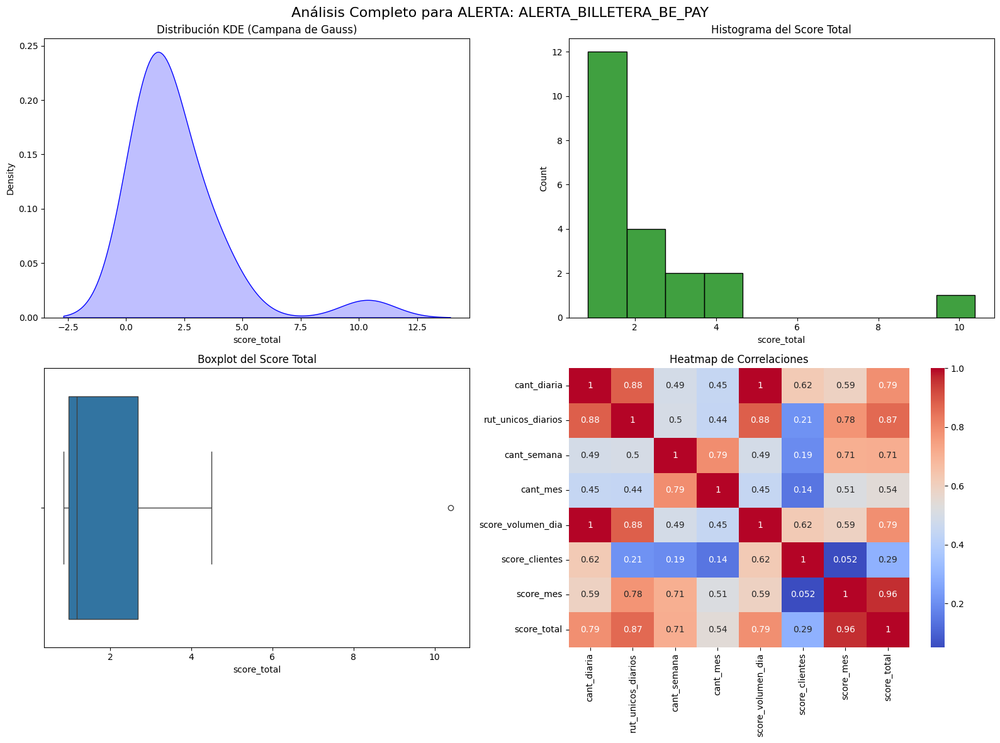

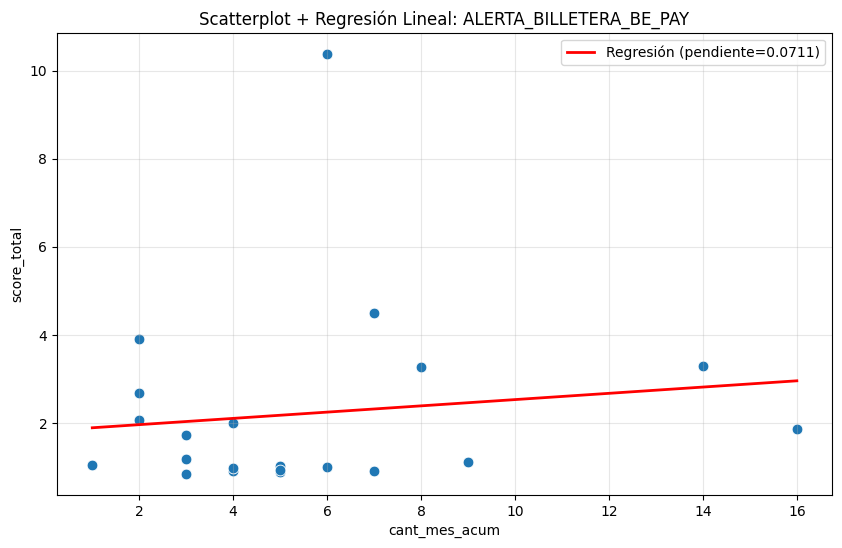


ALERTA: ALERT_GOOGLE



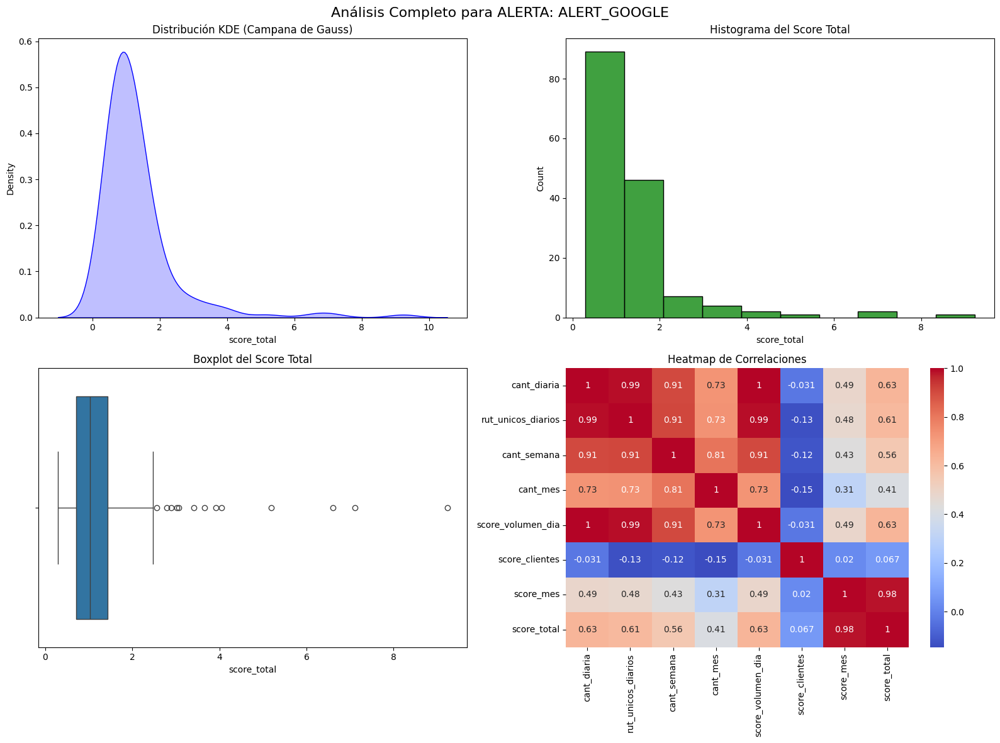

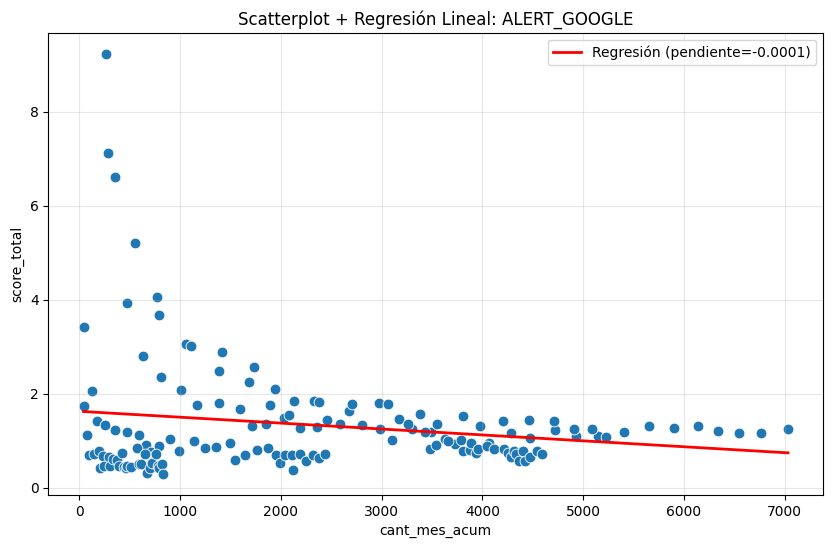


ALERTA: APP-13



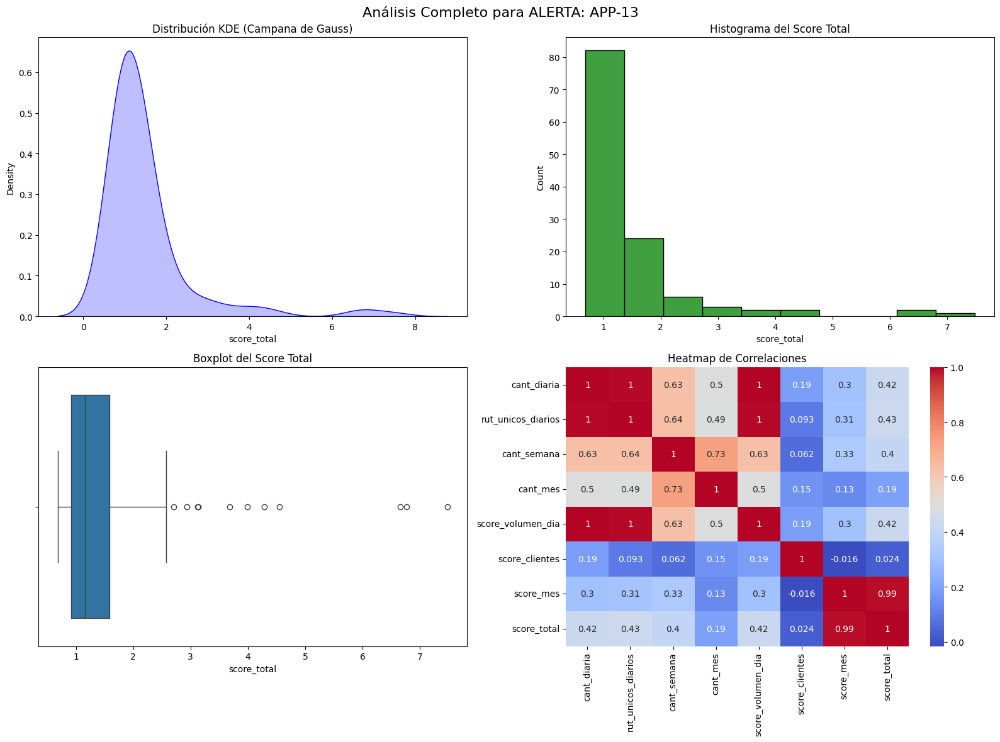

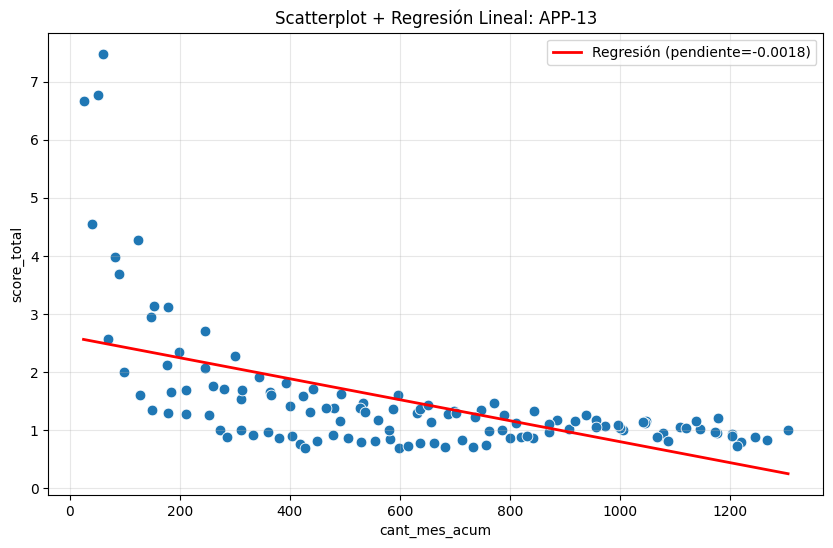


ALERTA: APP-16



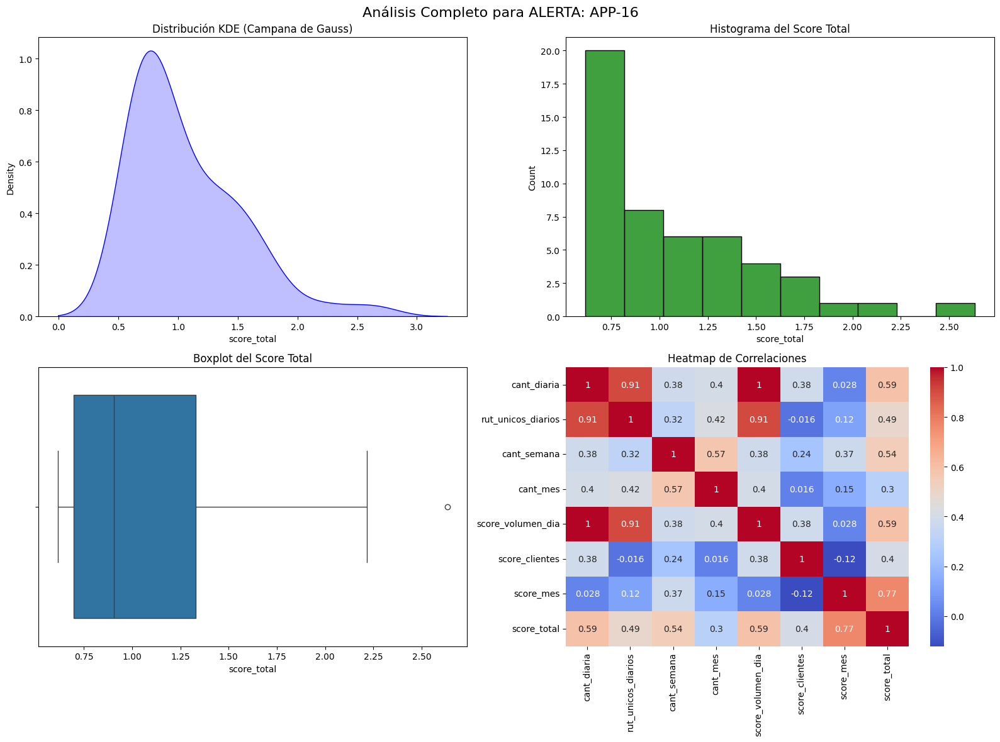

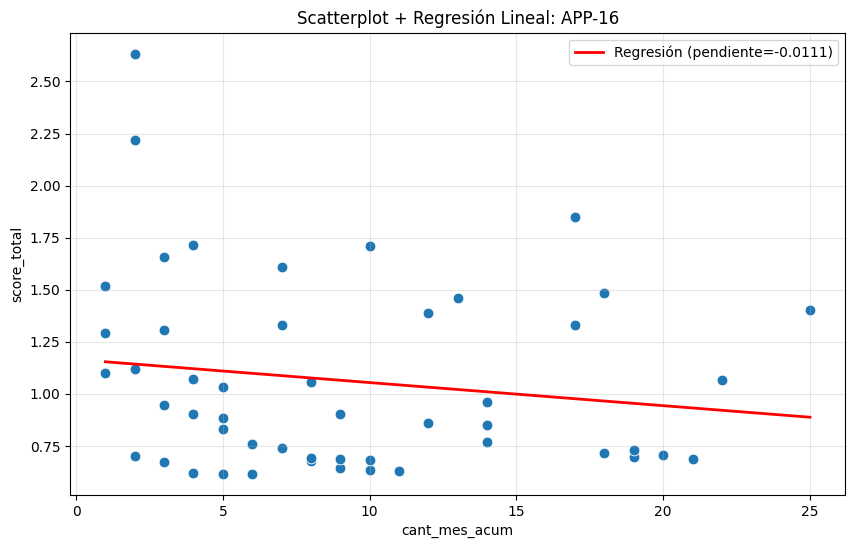


ALERTA: APP-17



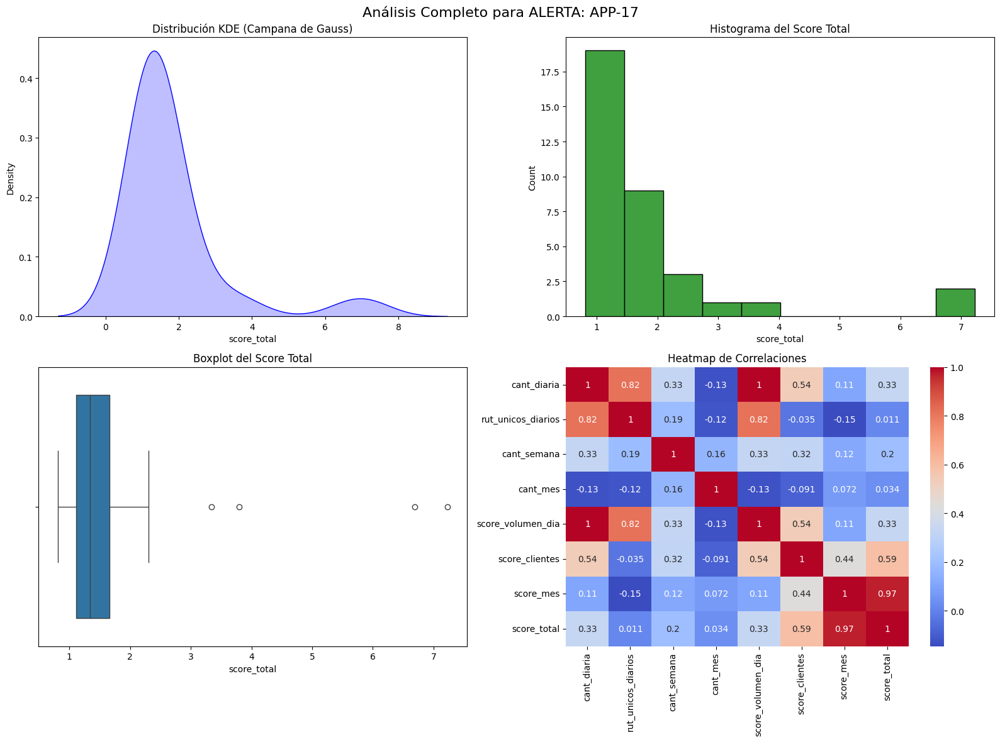

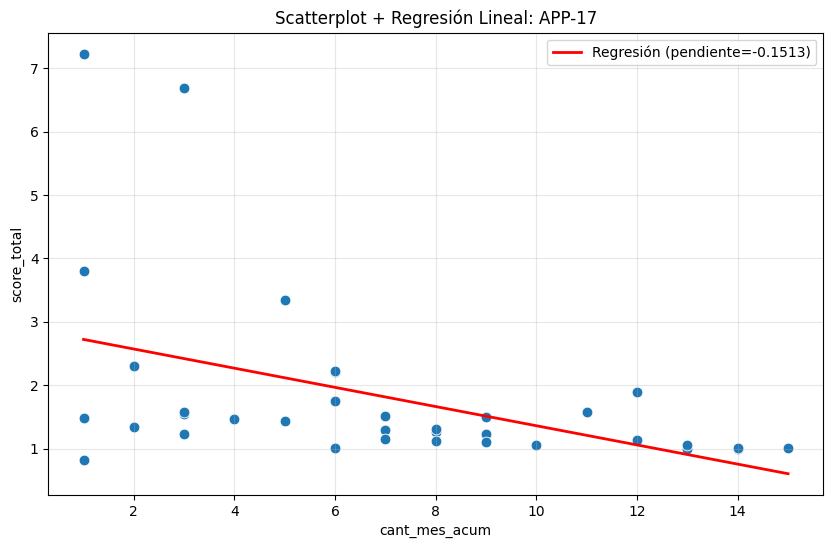


ALERTA: APP-18



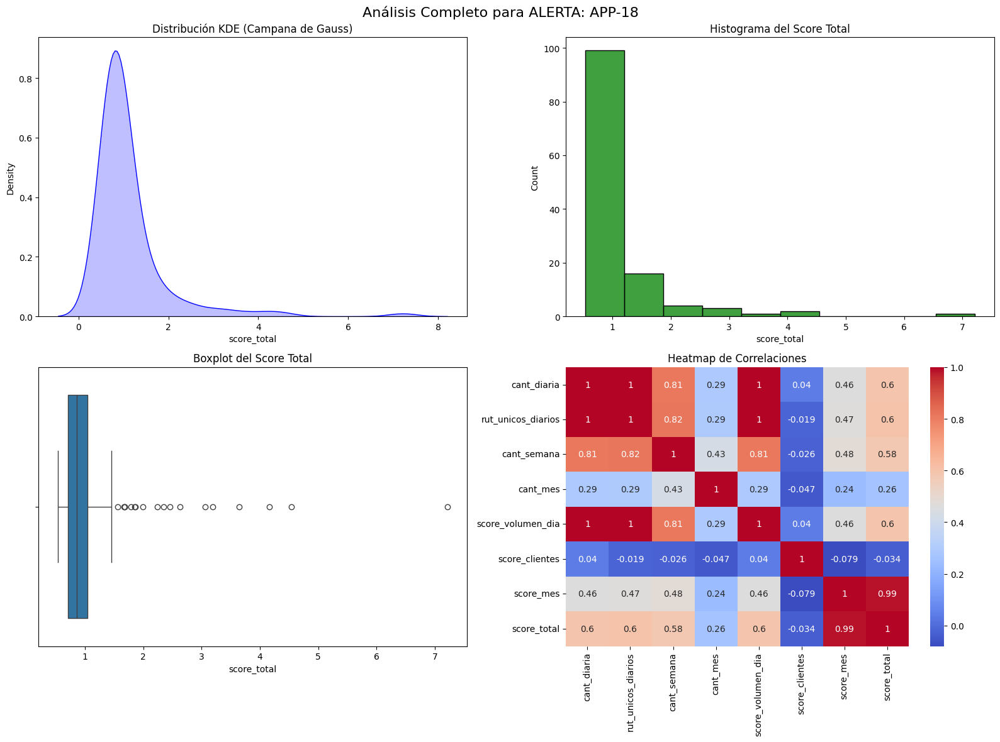

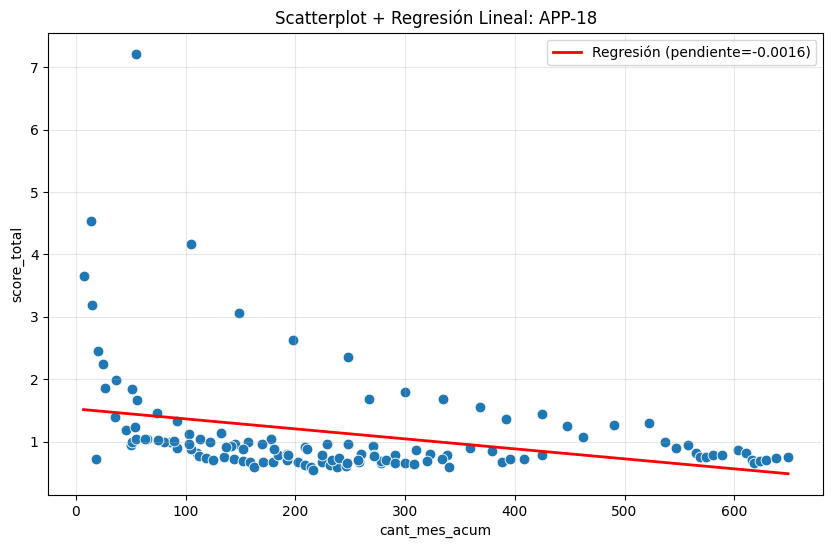


ALERTA: APP-24



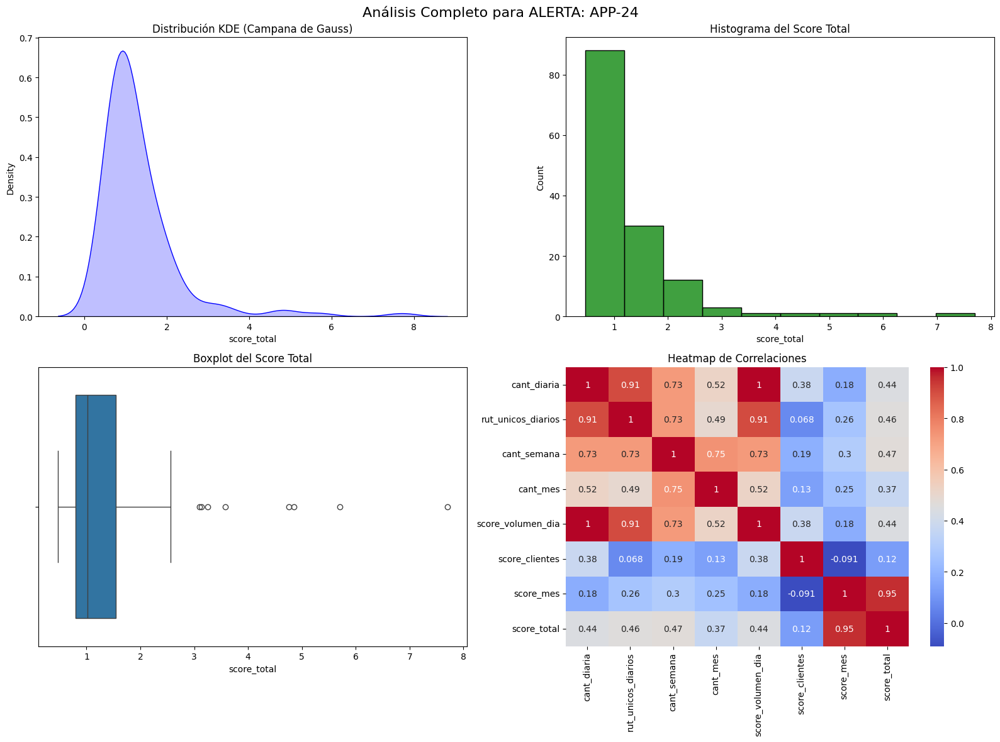

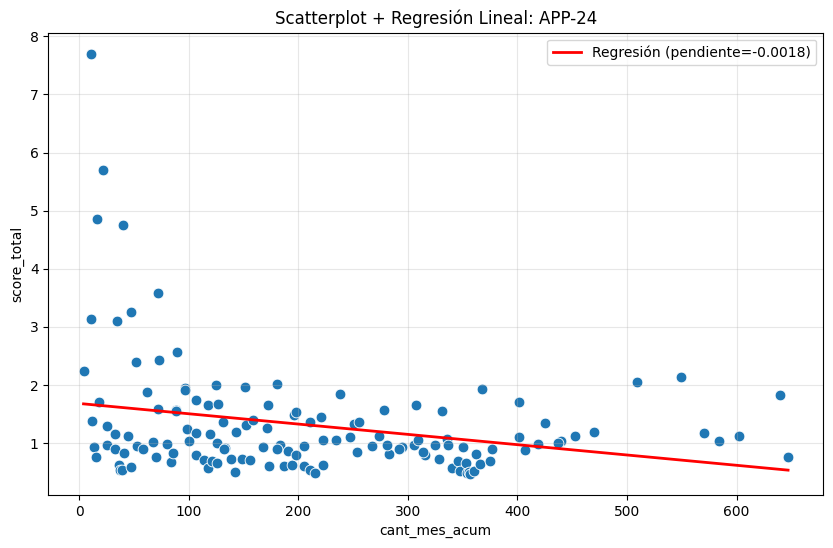


ALERTA: APP-25



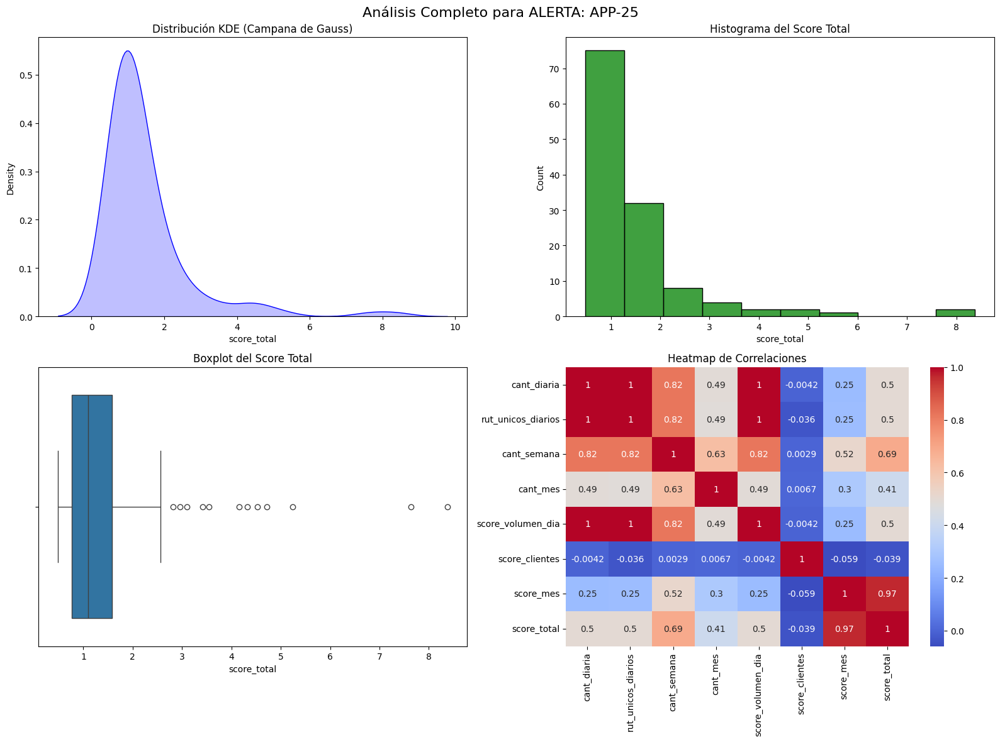

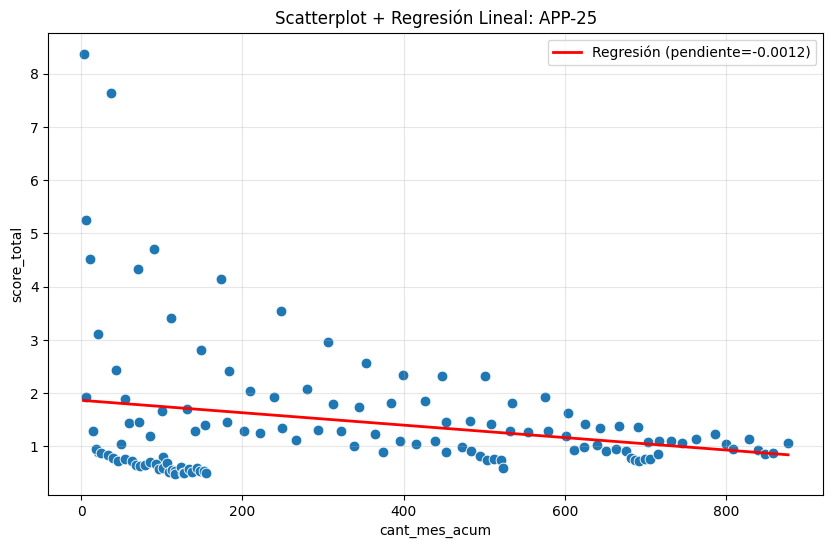


ALERTA: APP-26



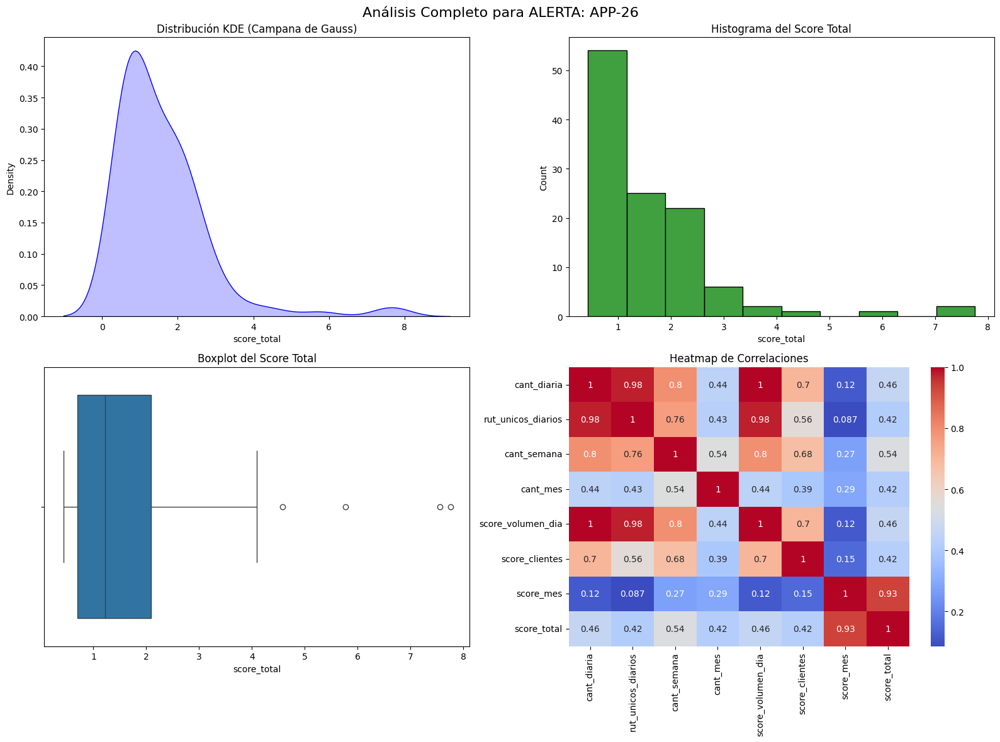

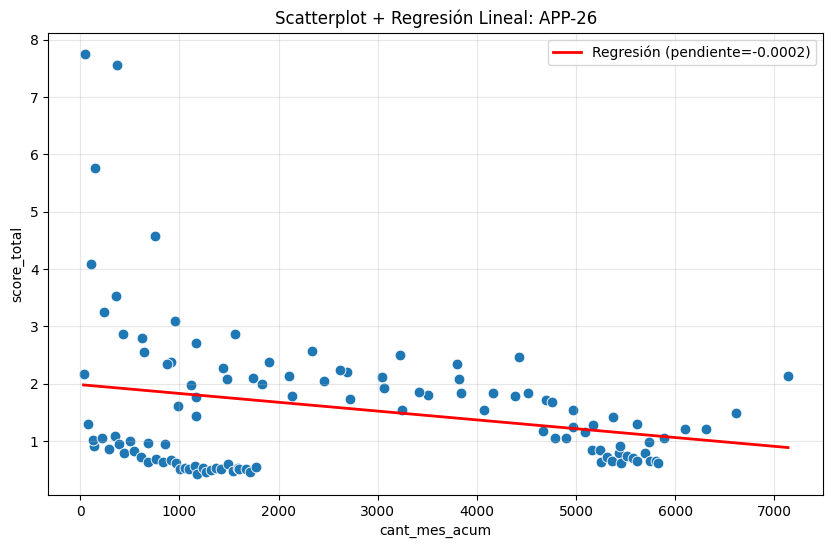


ALERTA: APP-27



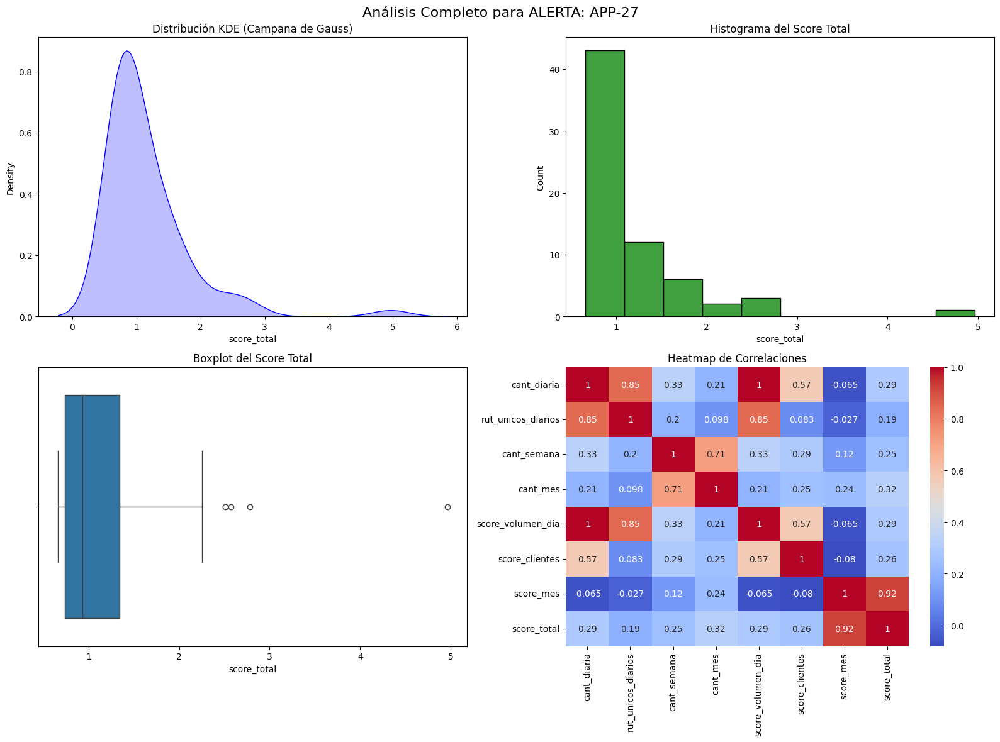

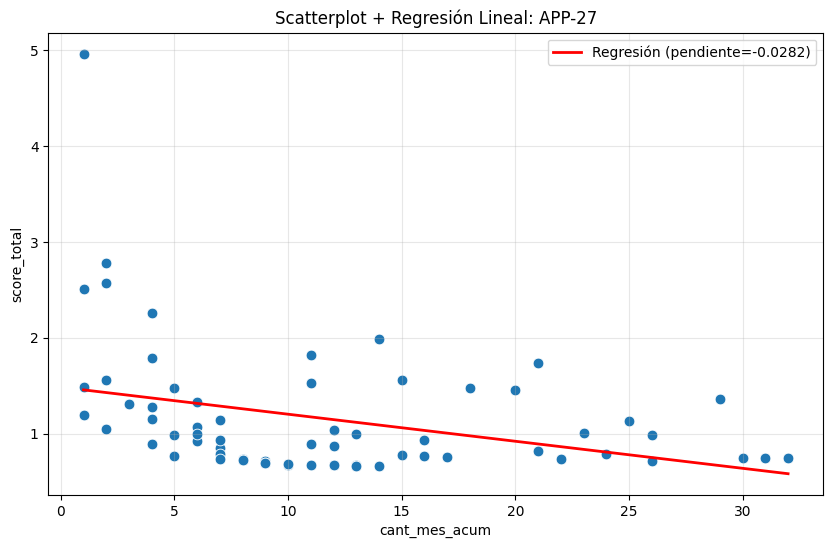


ALERTA: APP-3



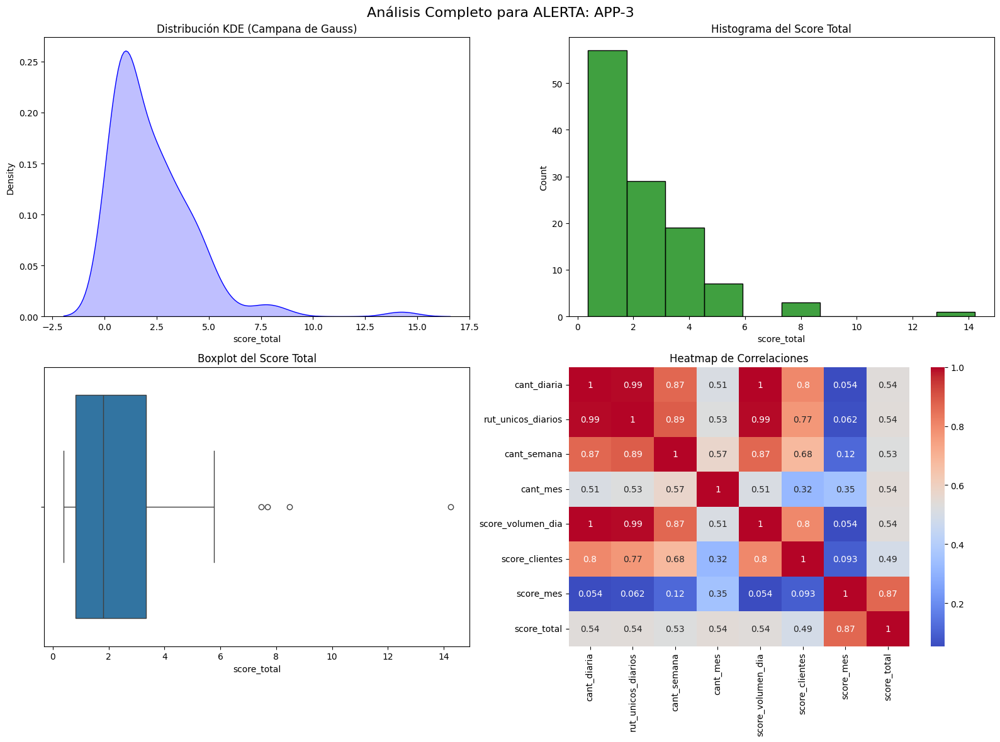

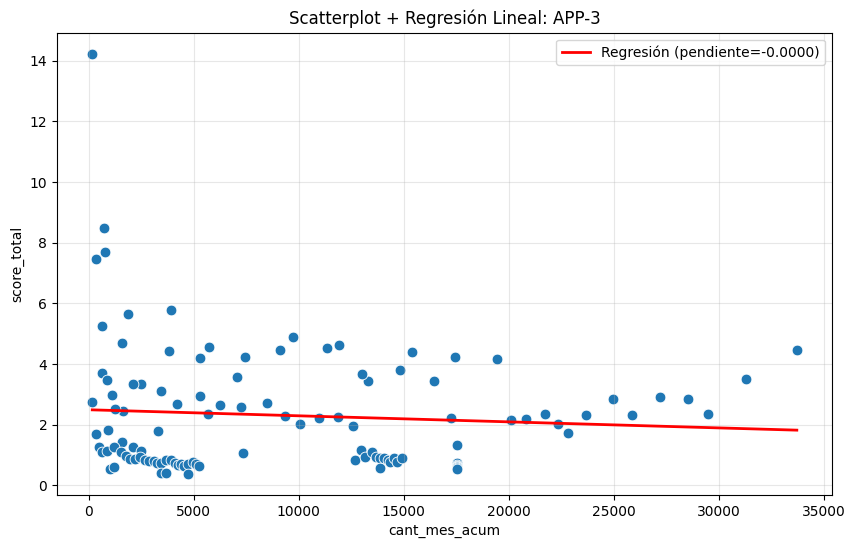


ALERTA: APP-31



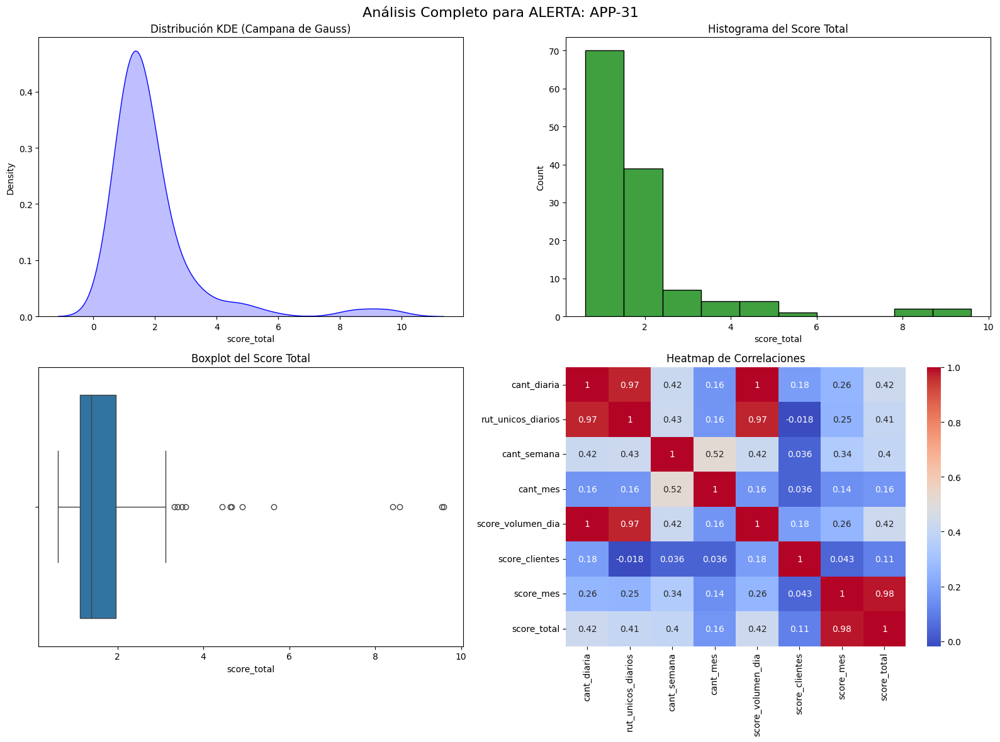

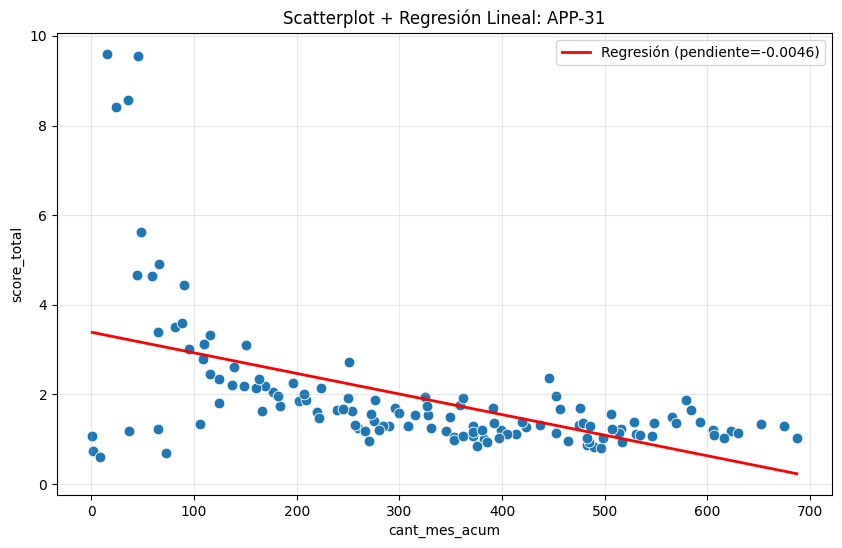


ALERTA: APP-32



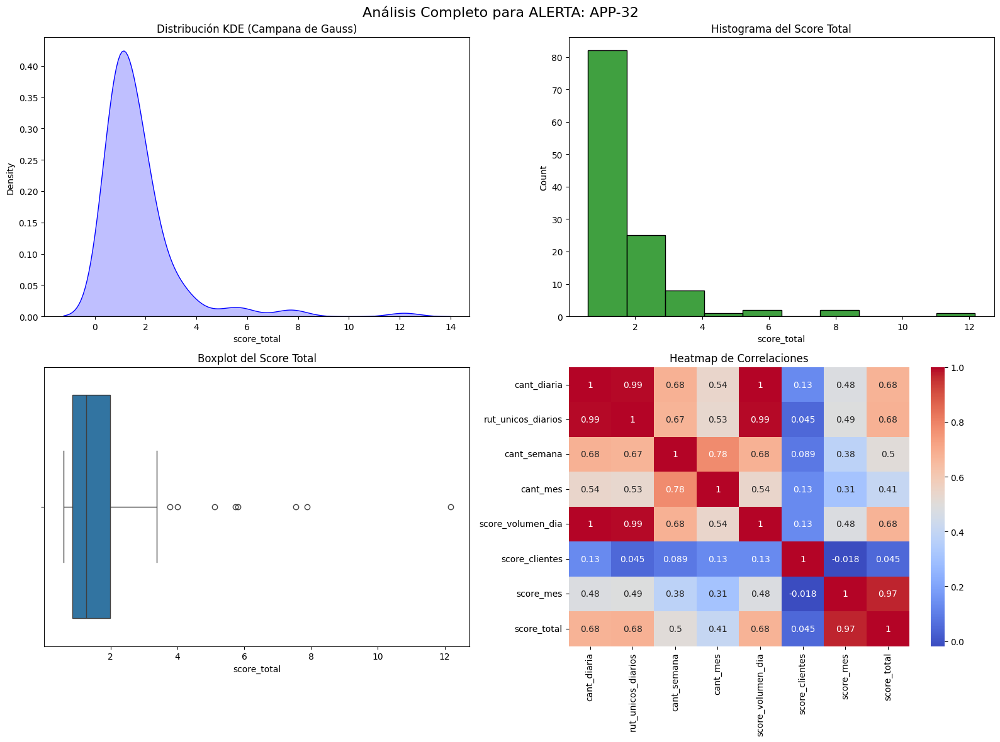

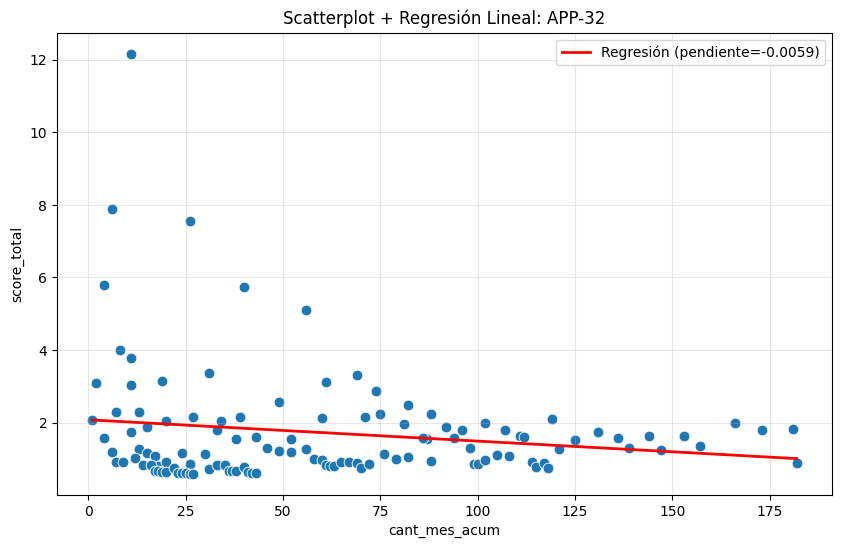


ALERTA: APP-33



C:\Users\gonza\AppData\Local\Temp\ipykernel_15092\4156901888.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_a["score_total"], fill=True, ax=axes[0,0], color="blue")
C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


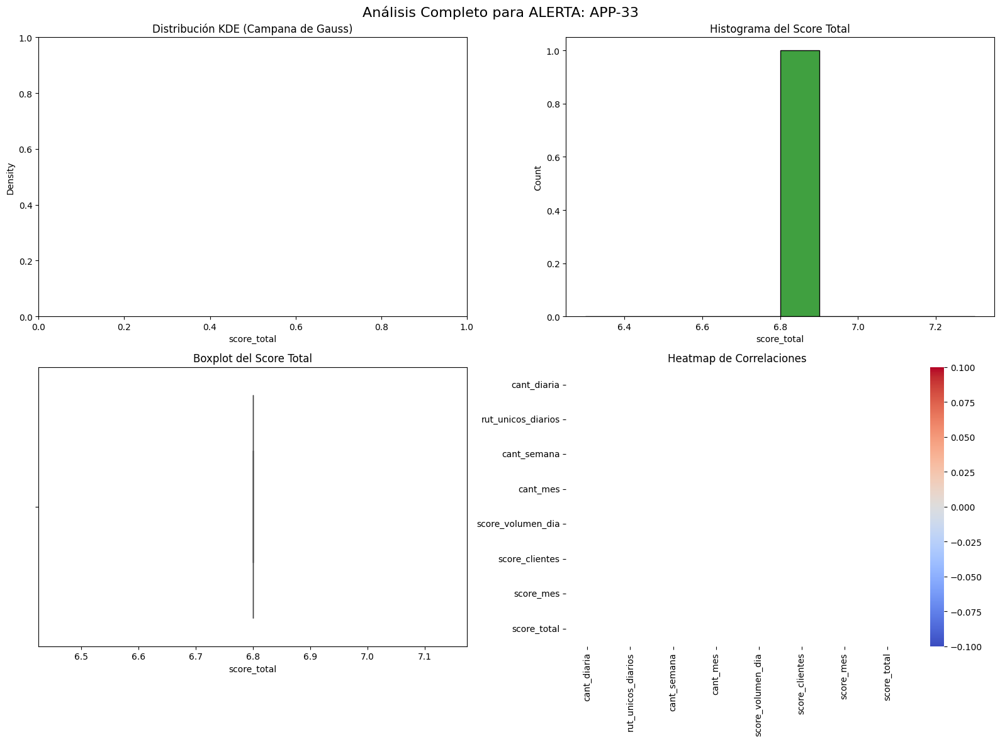

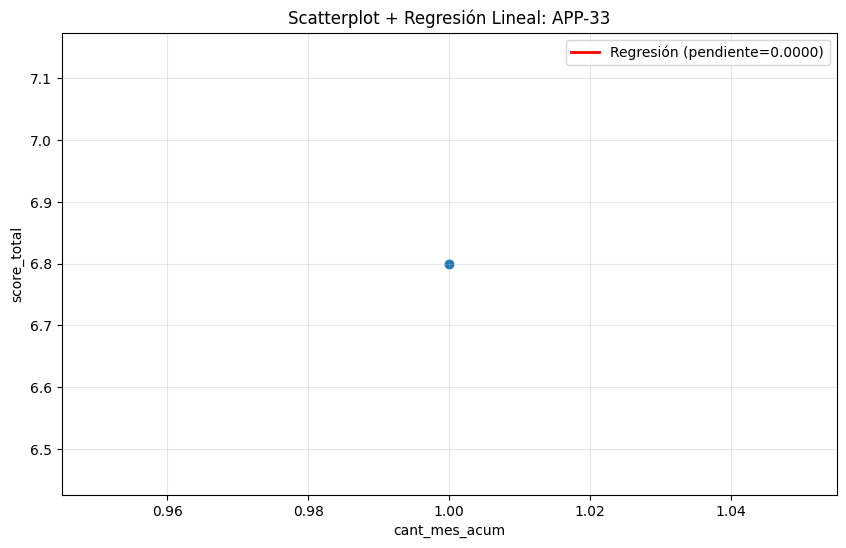


ALERTA: APP-36



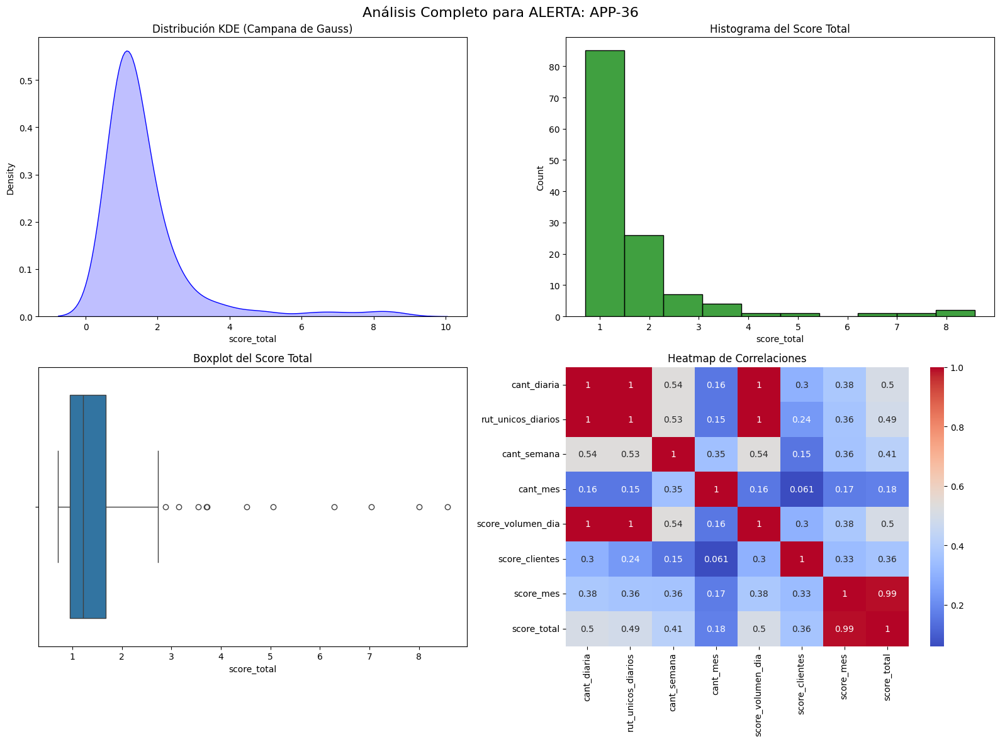

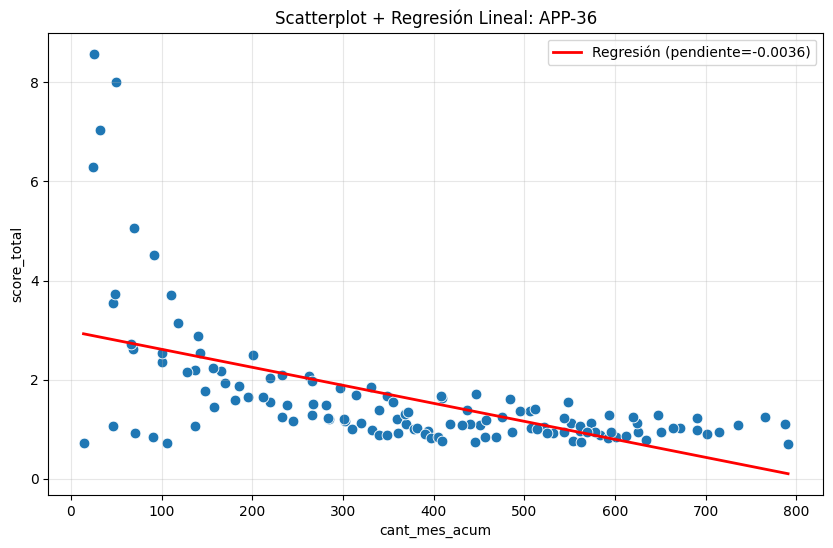


ALERTA: APP-37



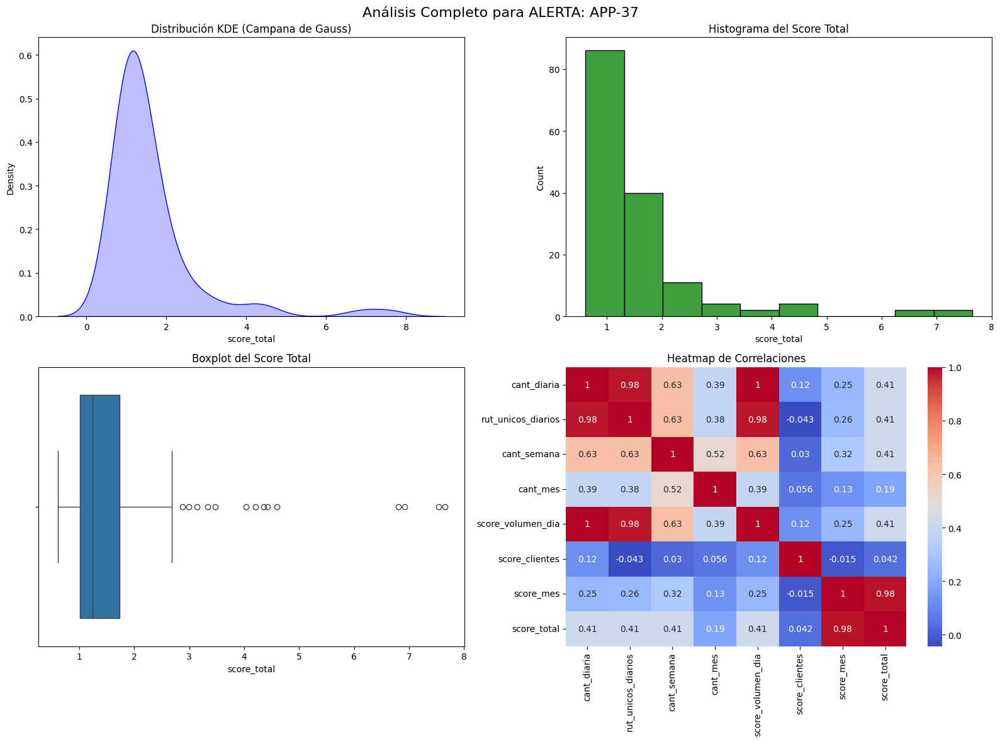

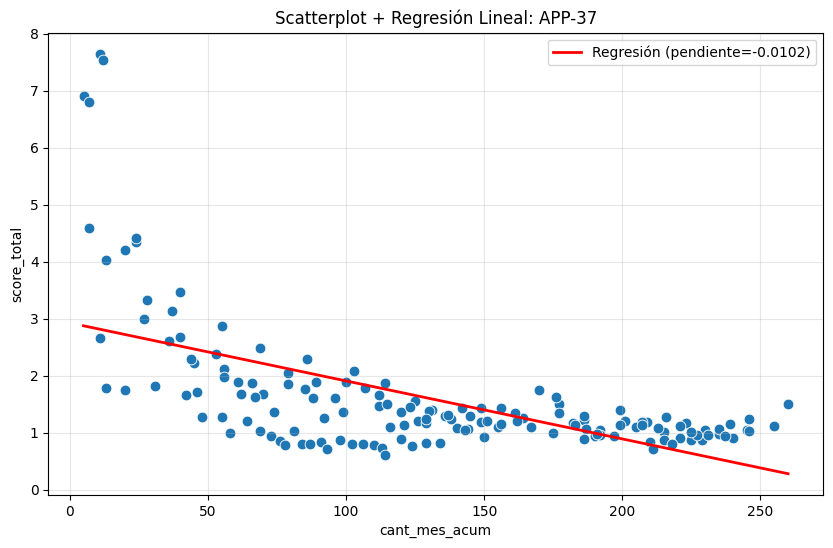


ALERTA: APP-39



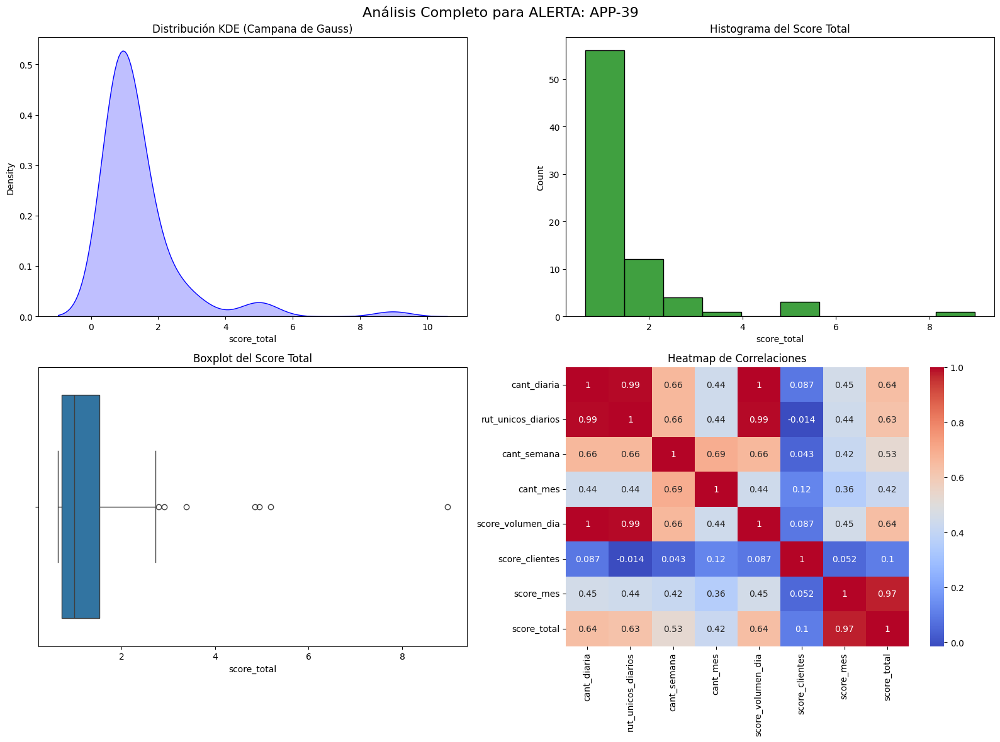

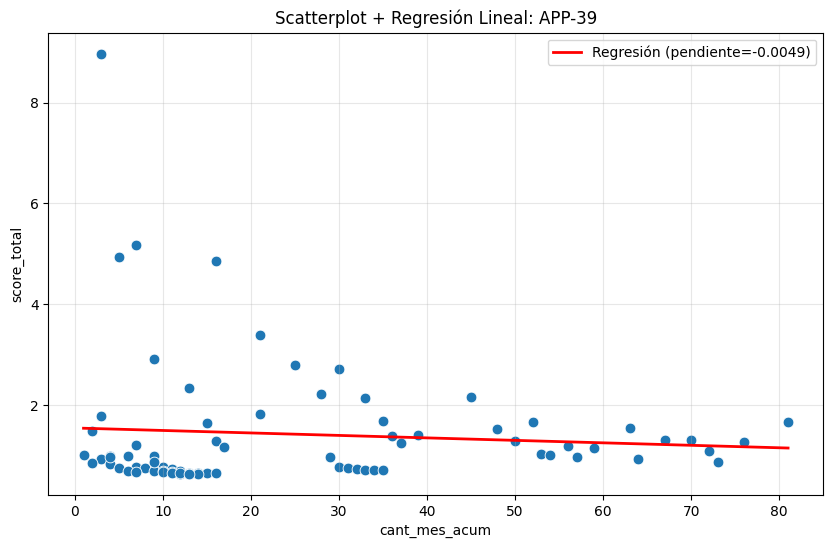


ALERTA: APP-40



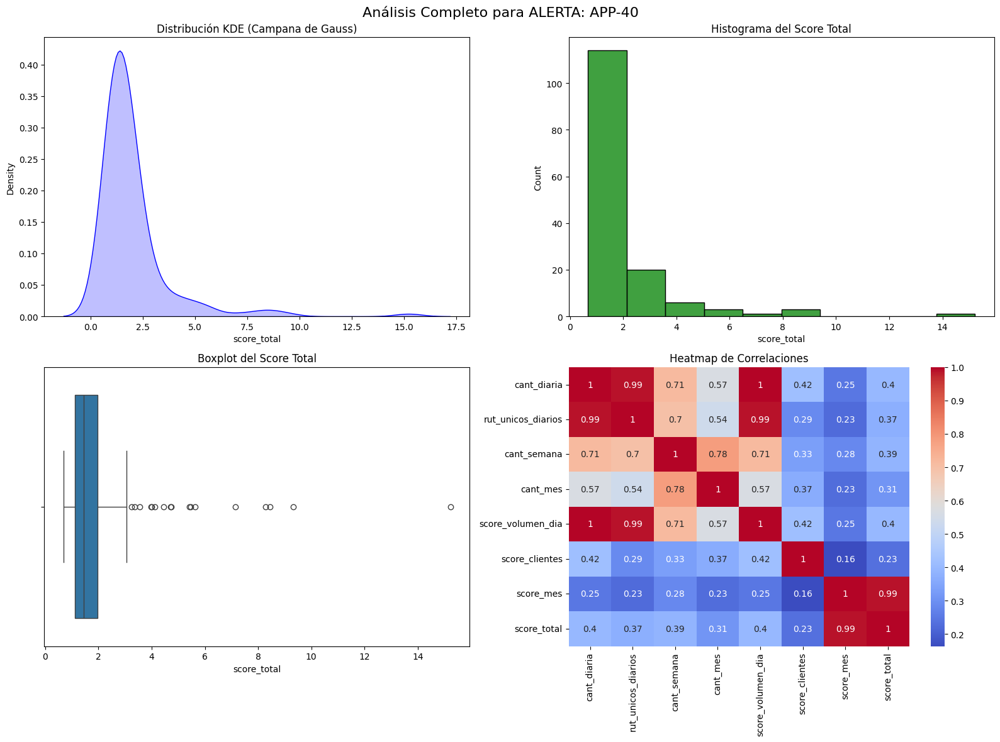

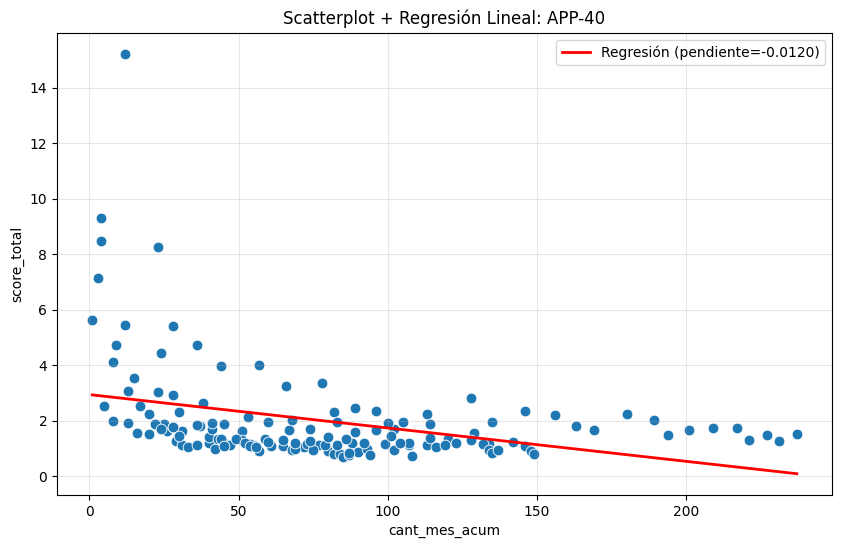


ALERTA: APP-41



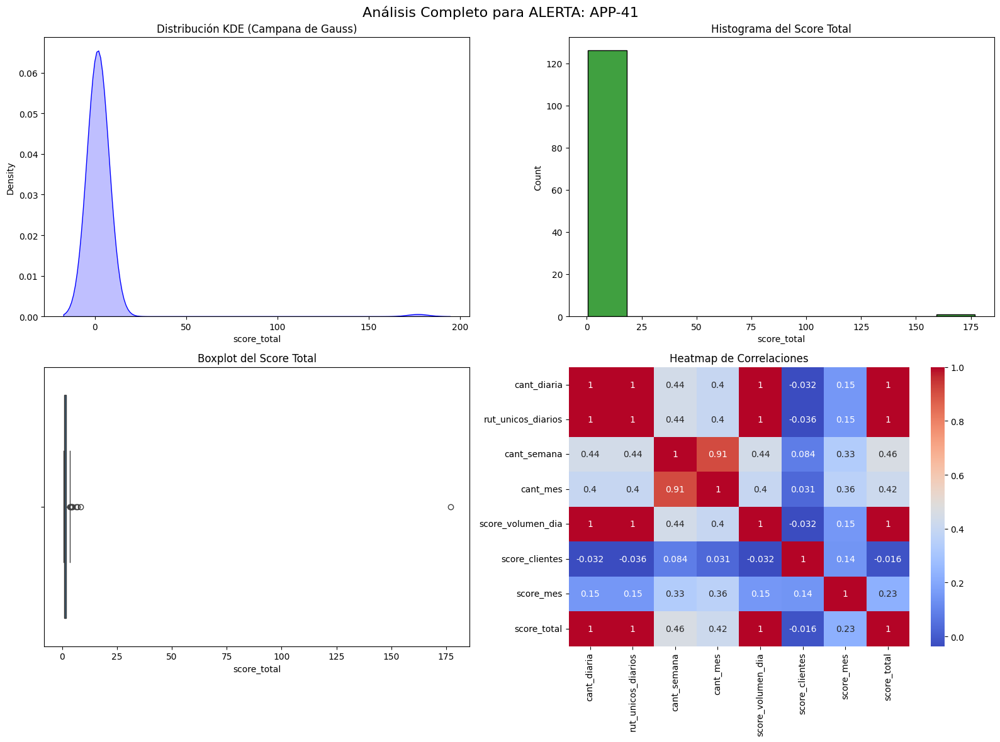

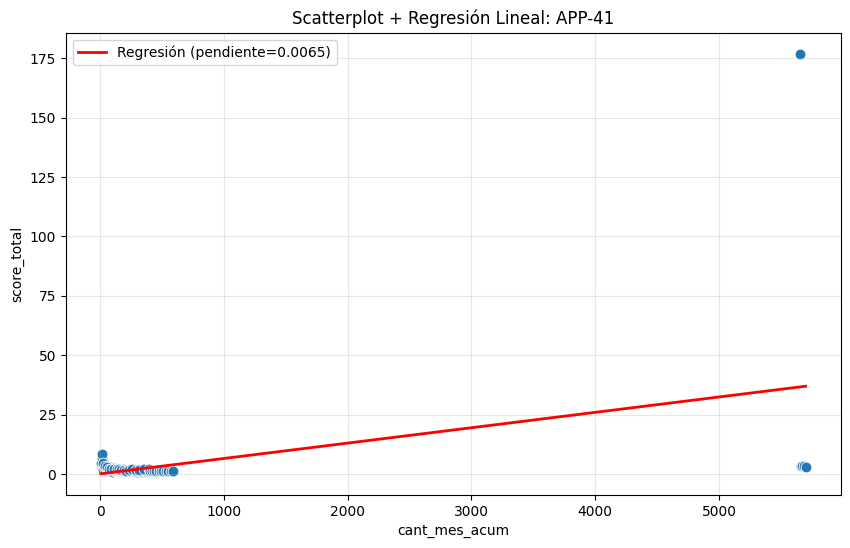


ALERTA: APP-42



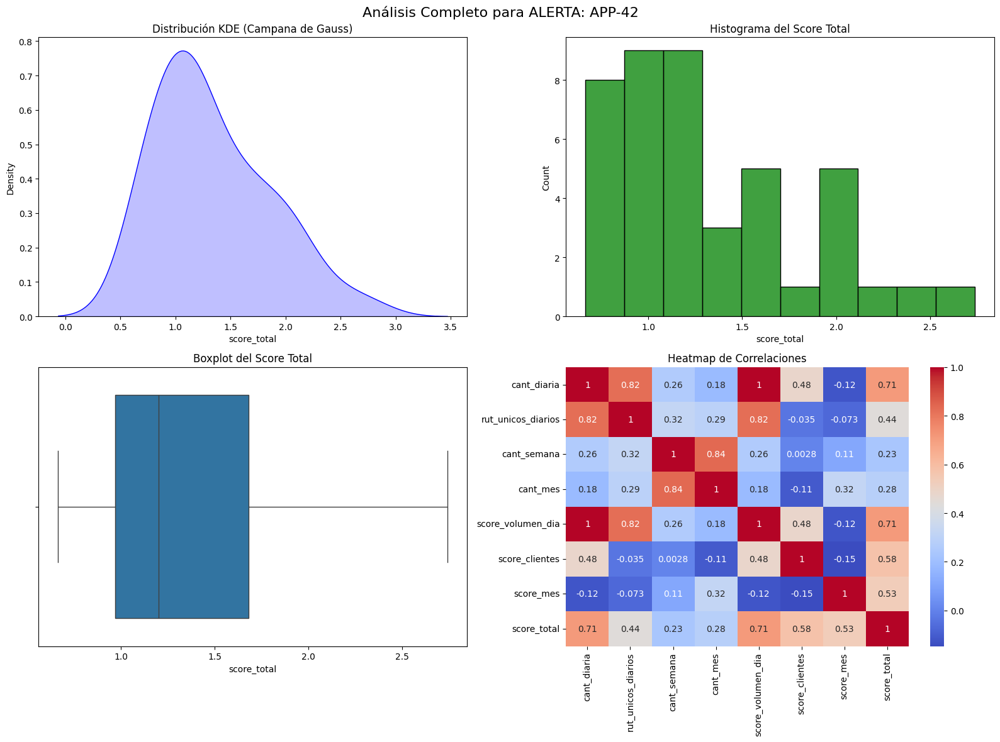

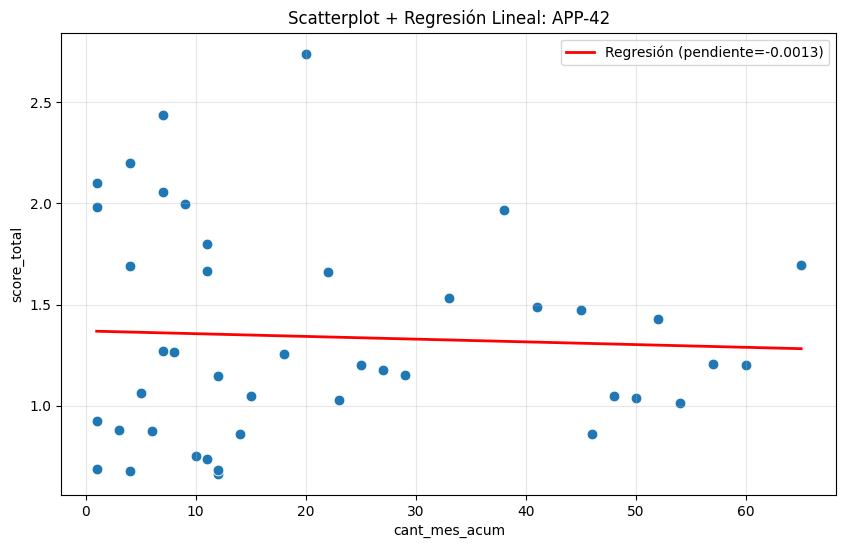


ALERTA: APP-43



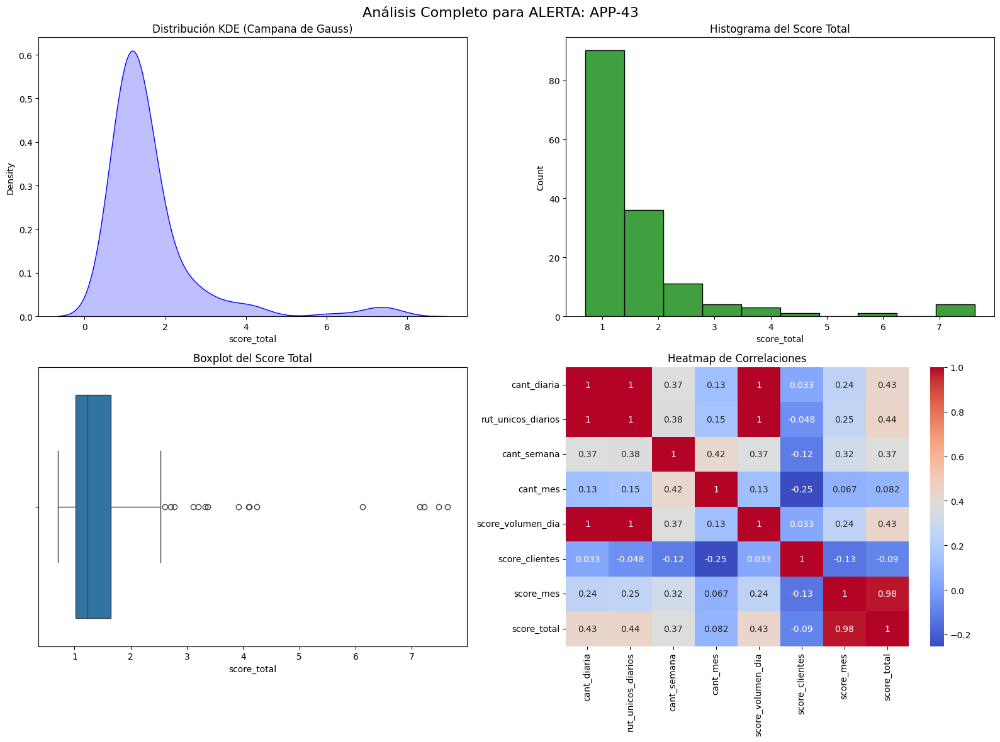

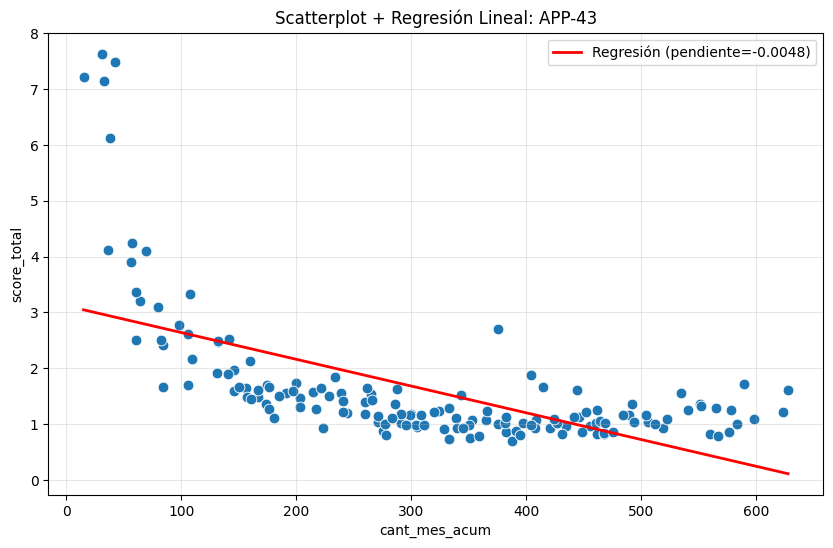


ALERTA: APP-44



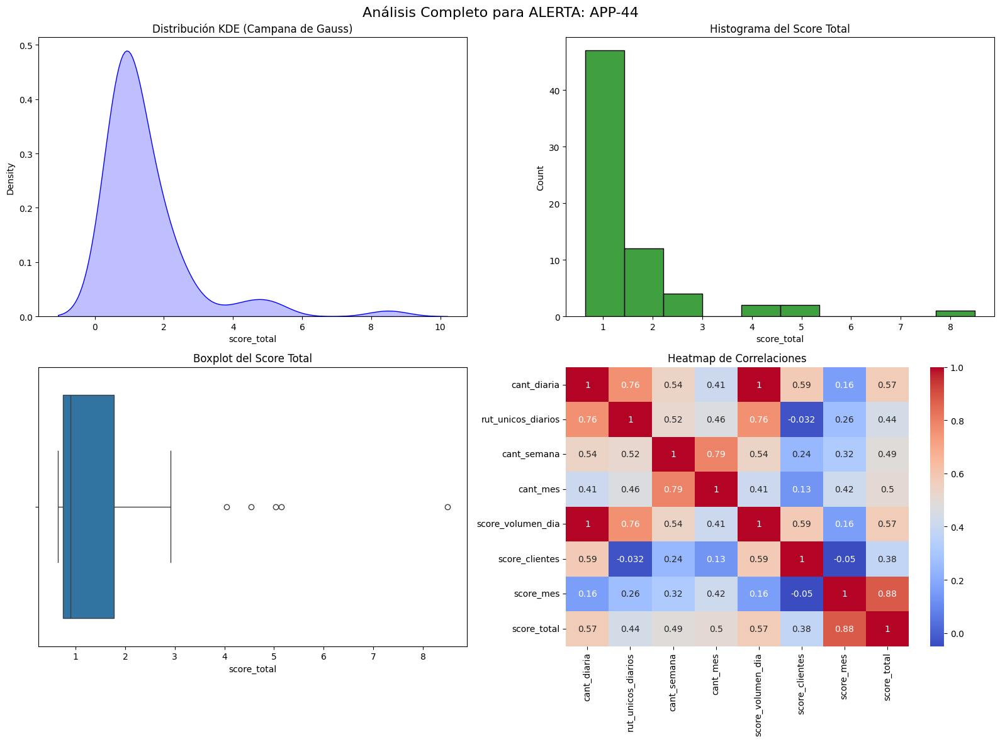

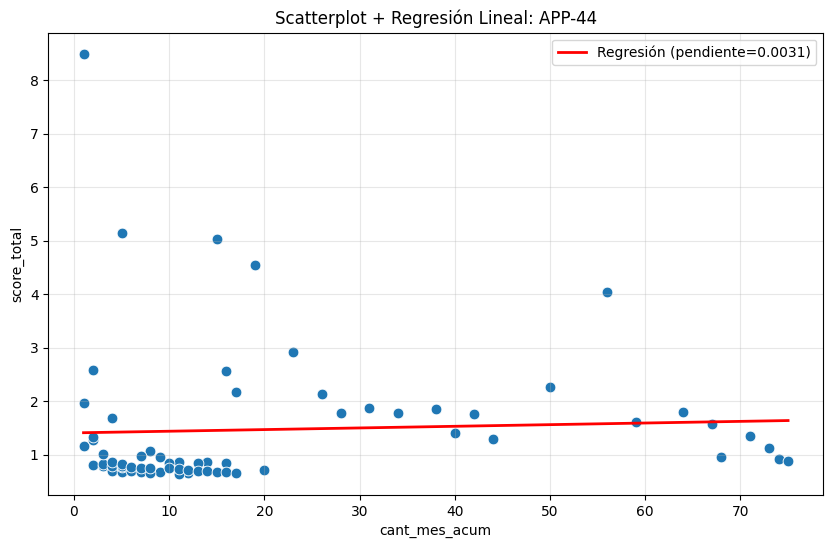


ALERTA: APP-46



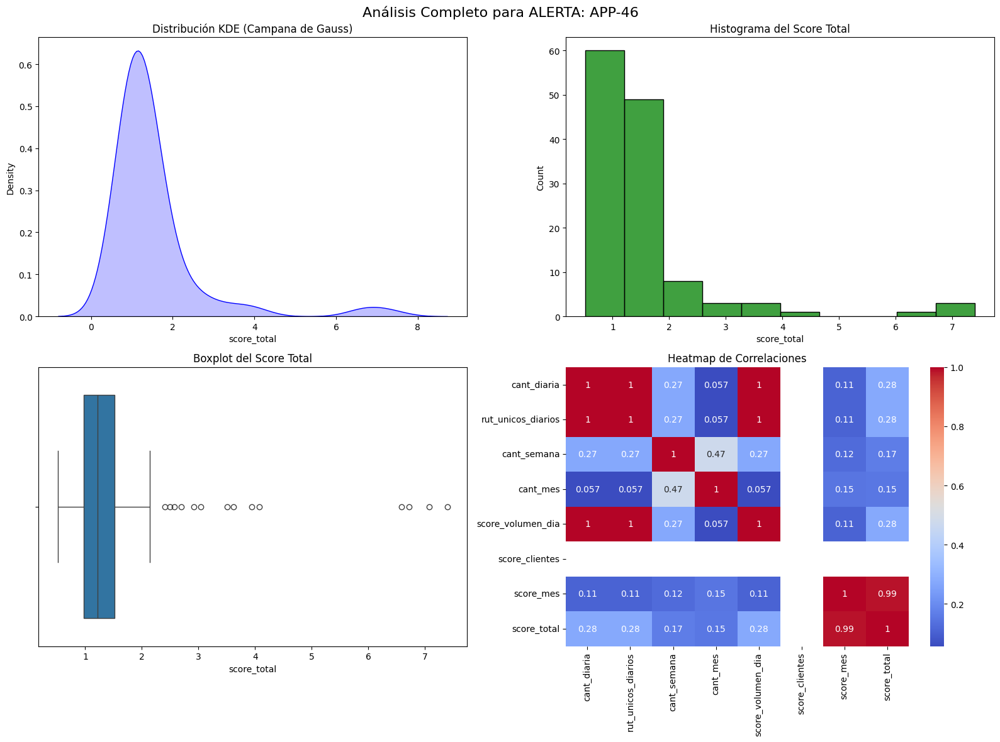

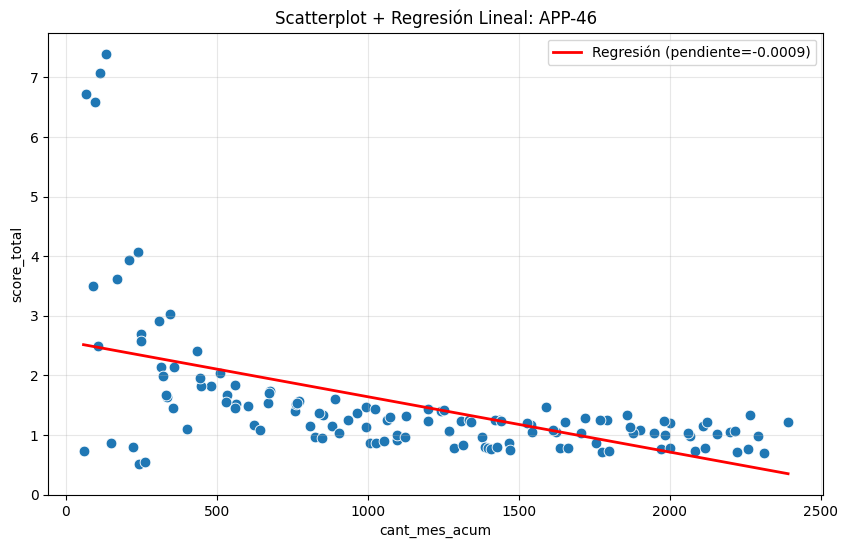


ALERTA: APP-47



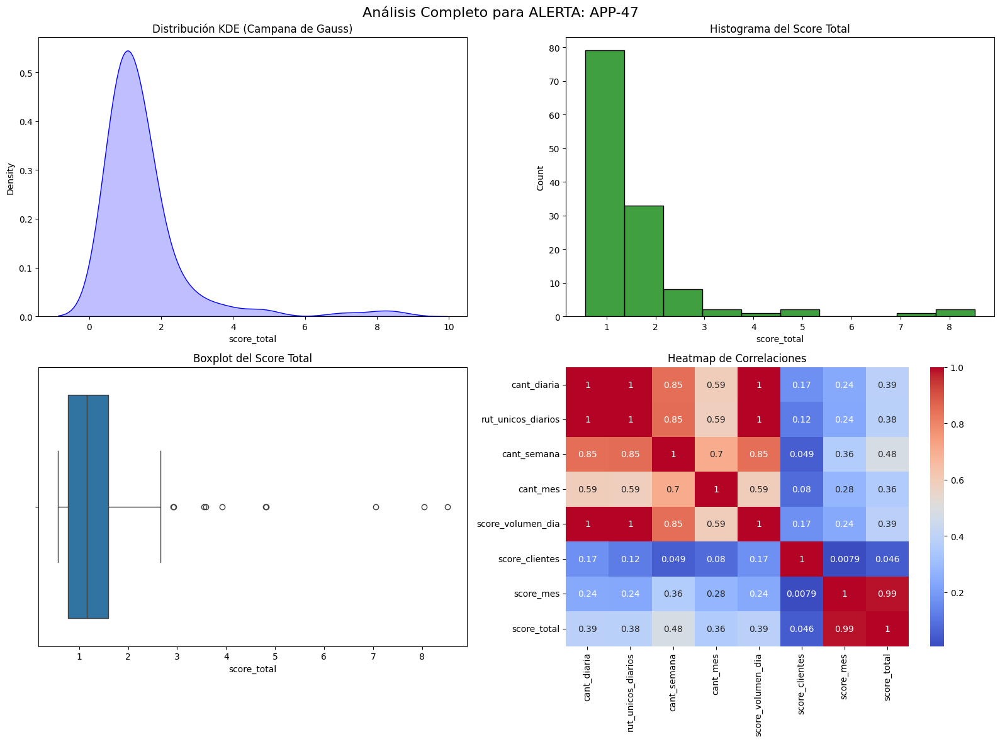

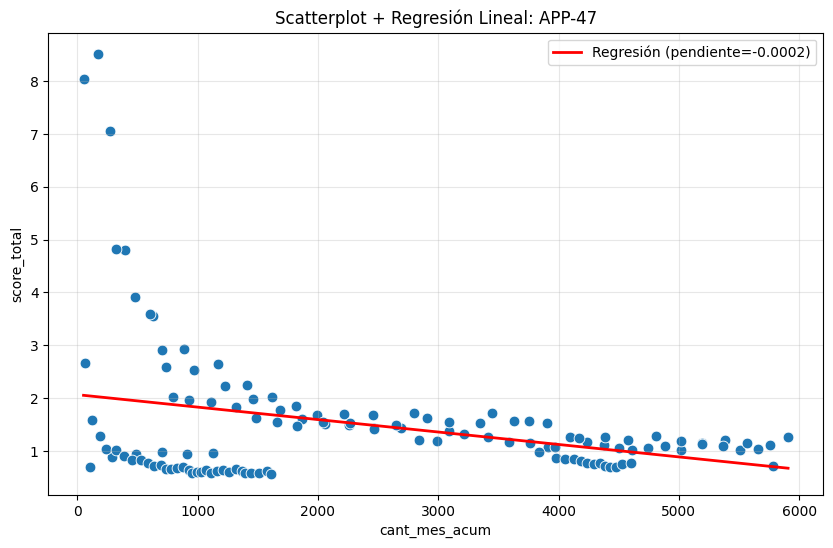


ALERTA: APP-48



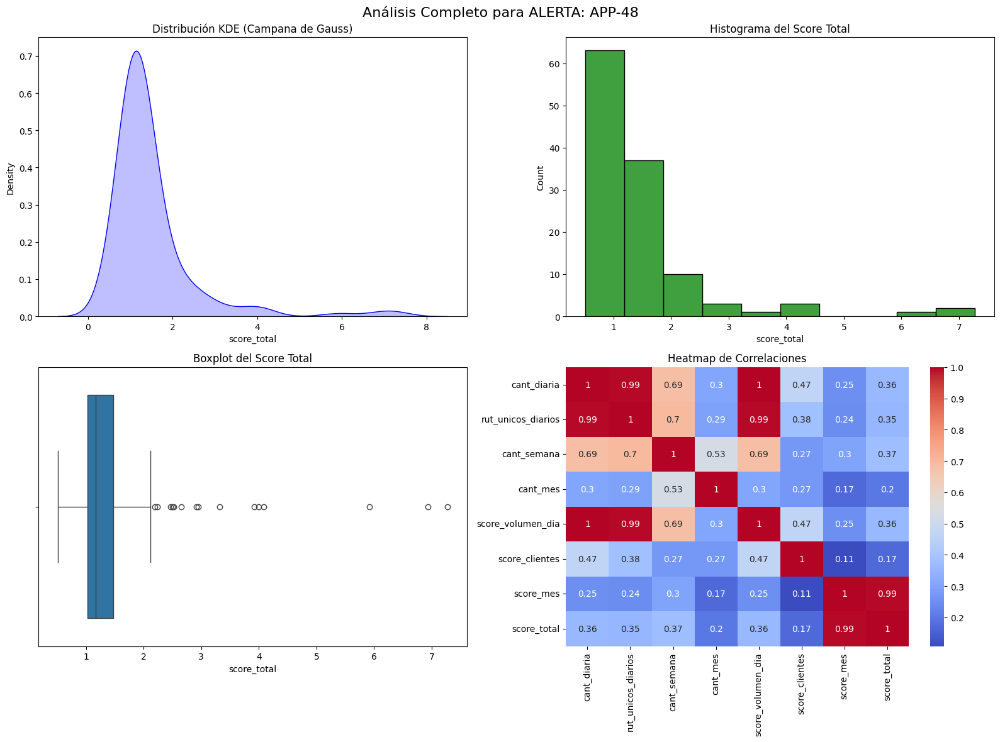

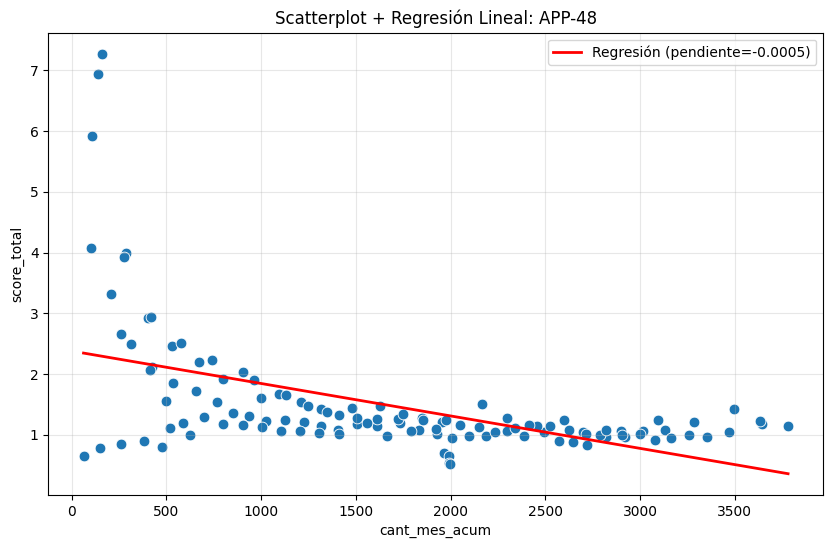


ALERTA: APP-51



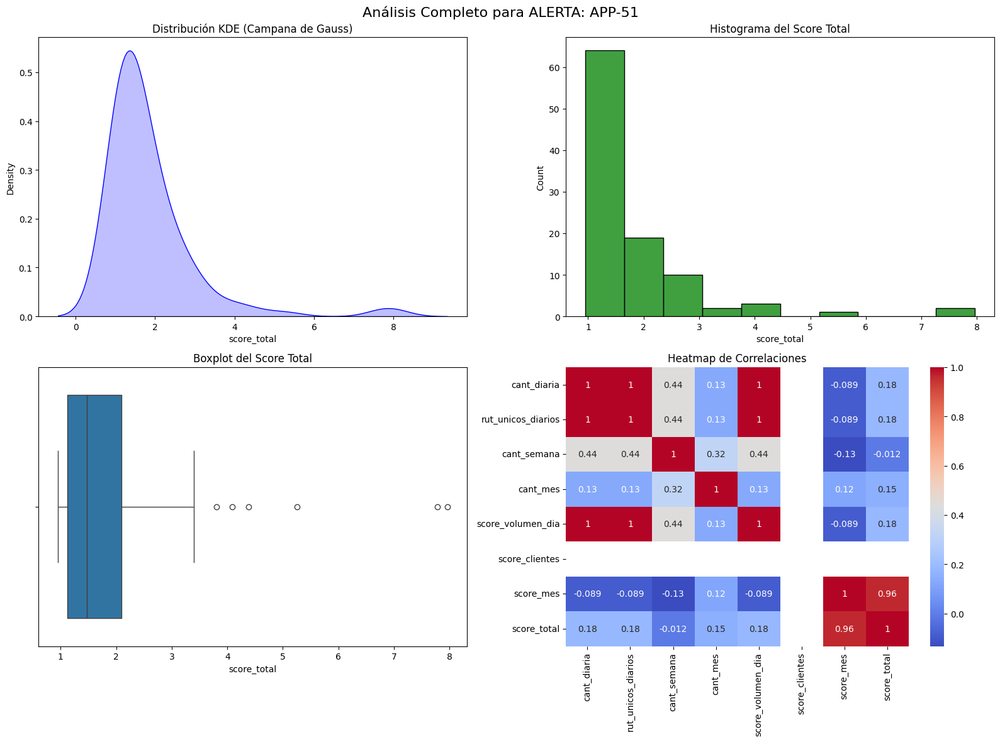

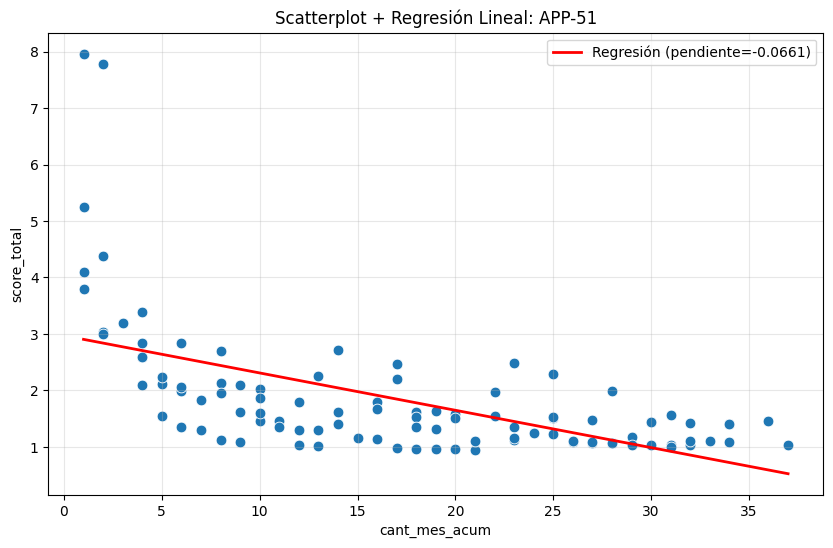


ALERTA: APP-54



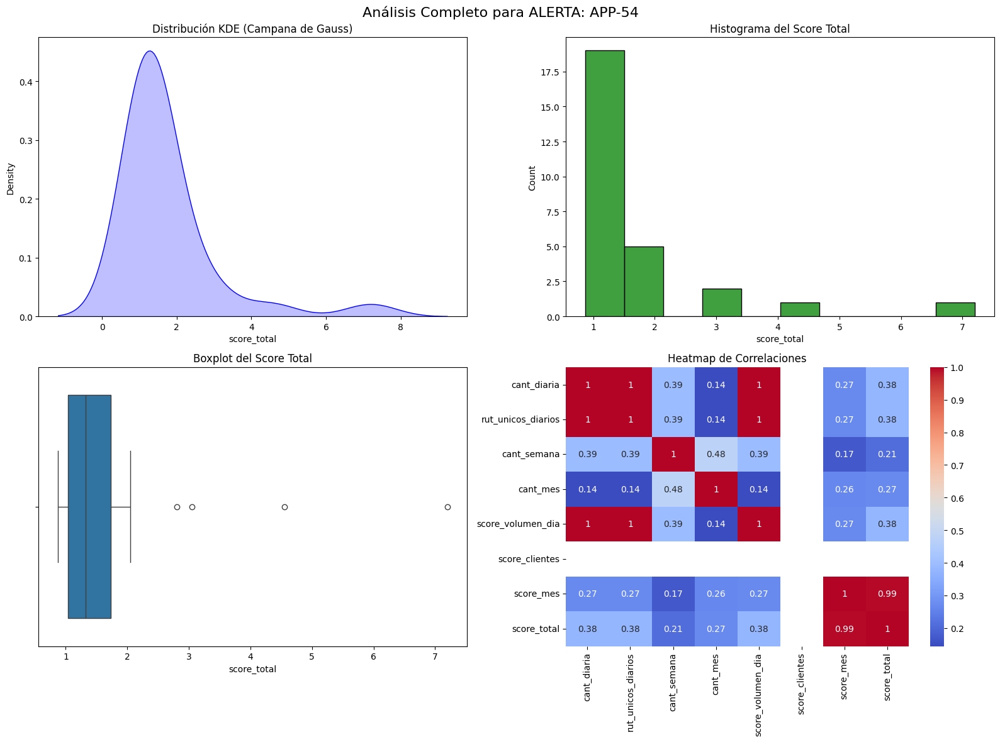

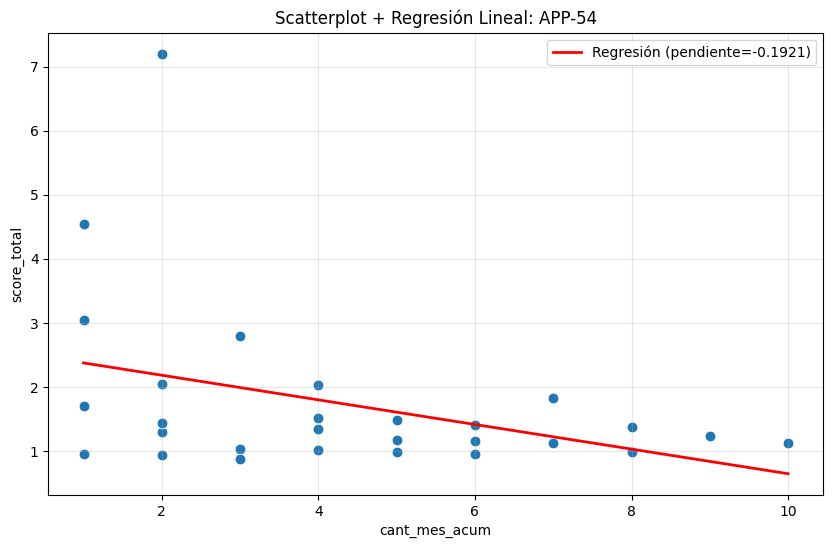


ALERTA: APP-55



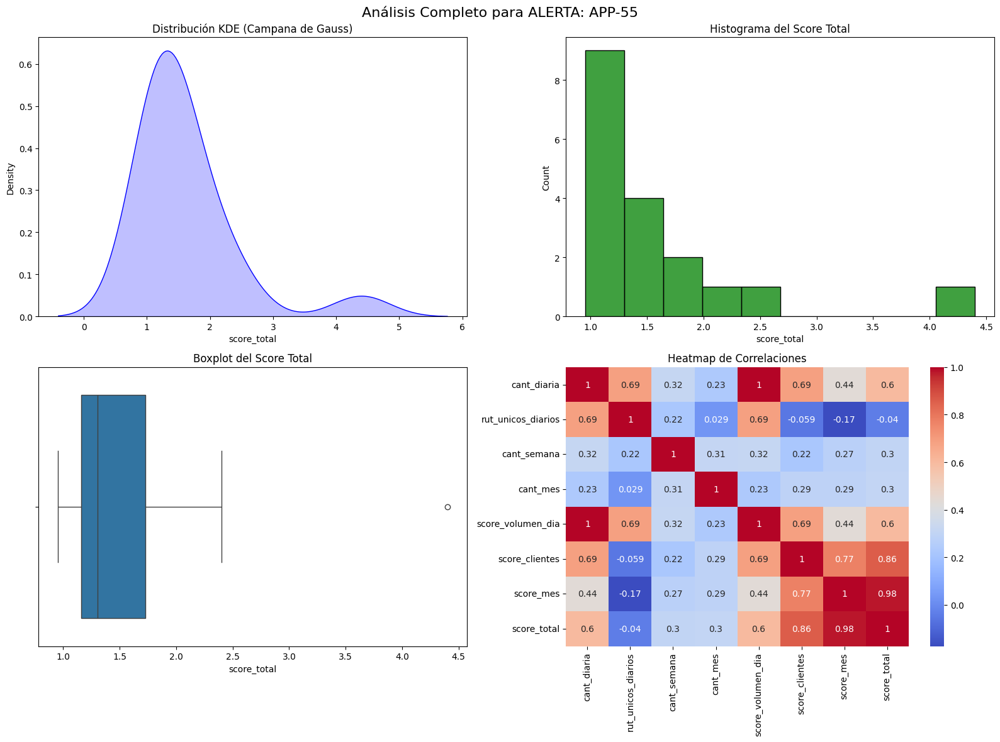

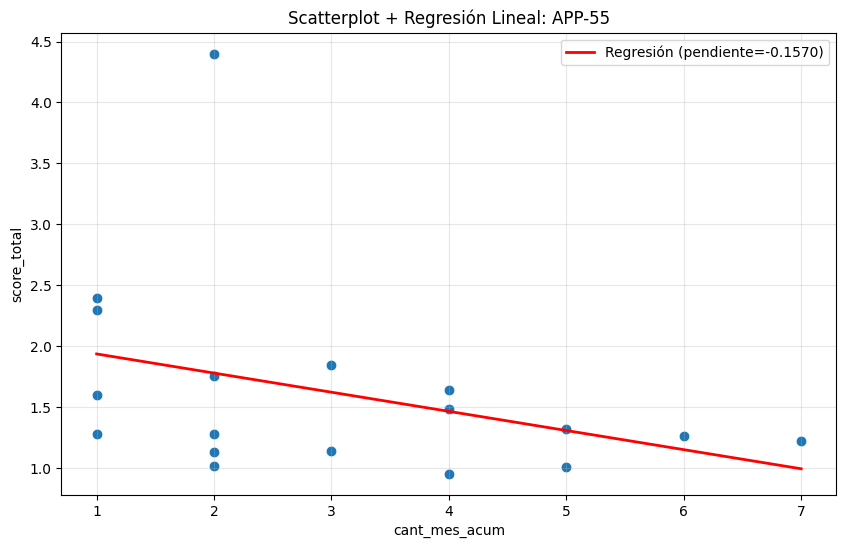


ALERTA: APP-8



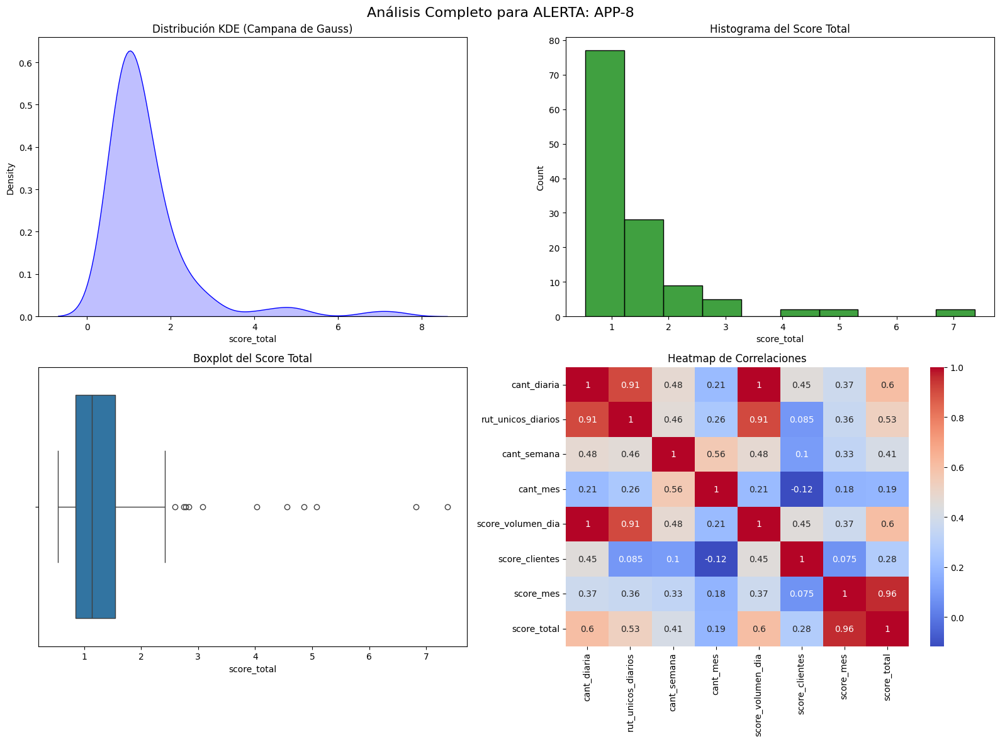

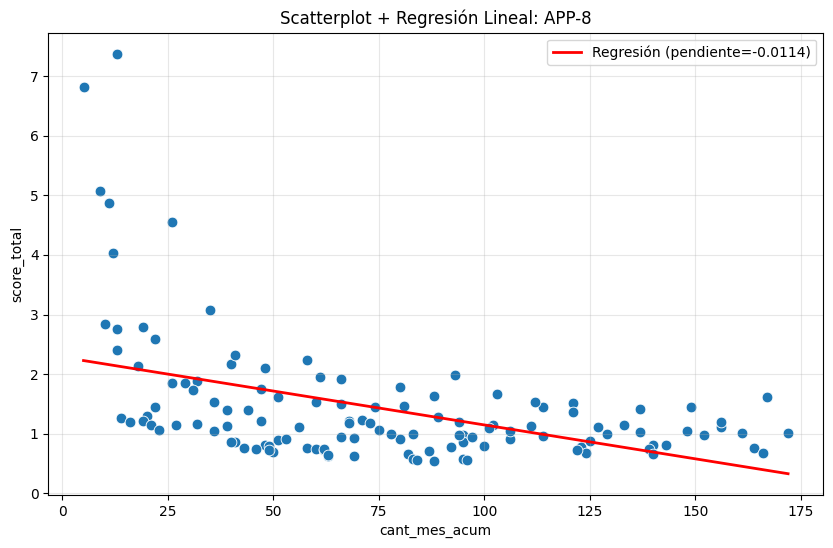


ALERTA: BTO-07



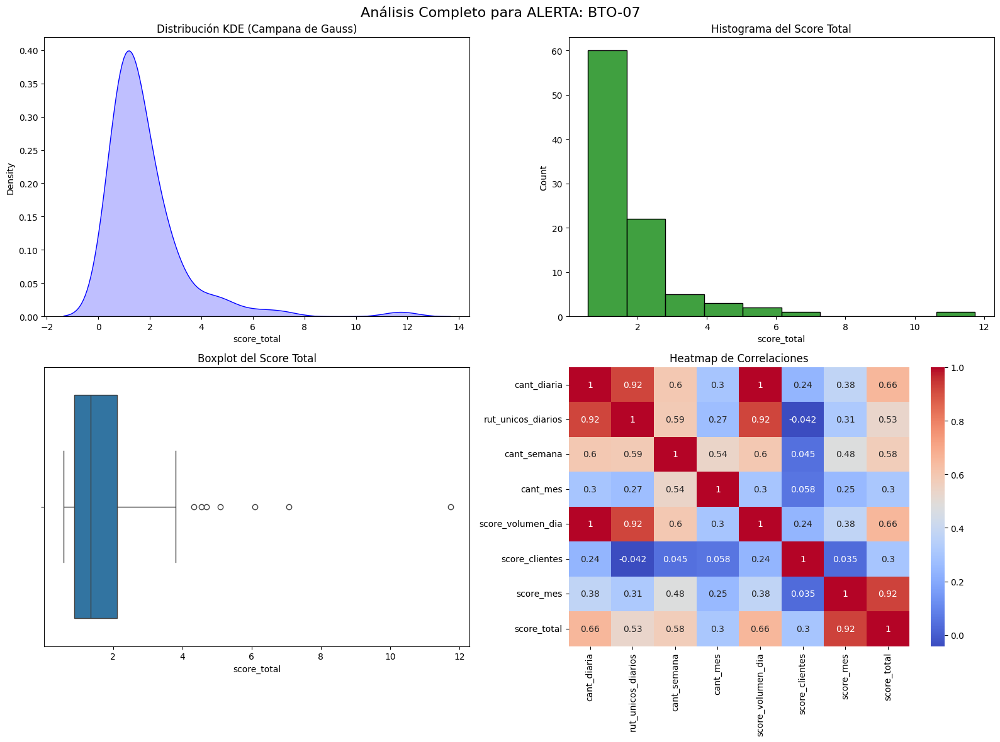

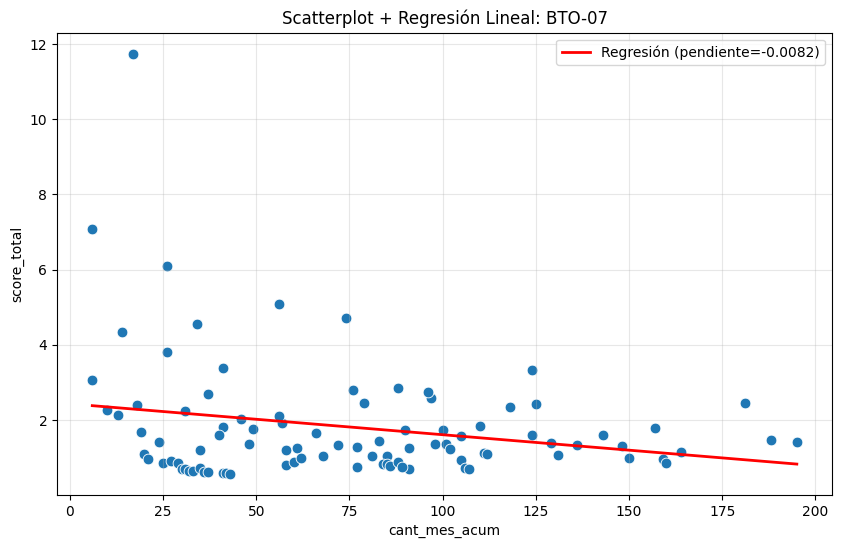


ALERTA: BTO-1



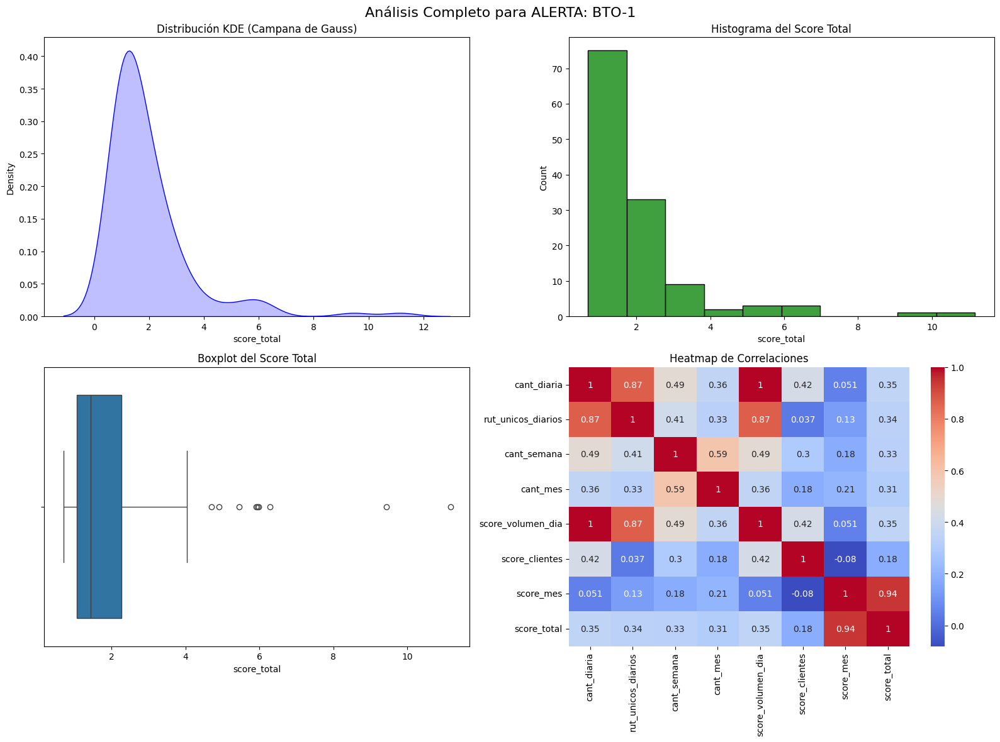

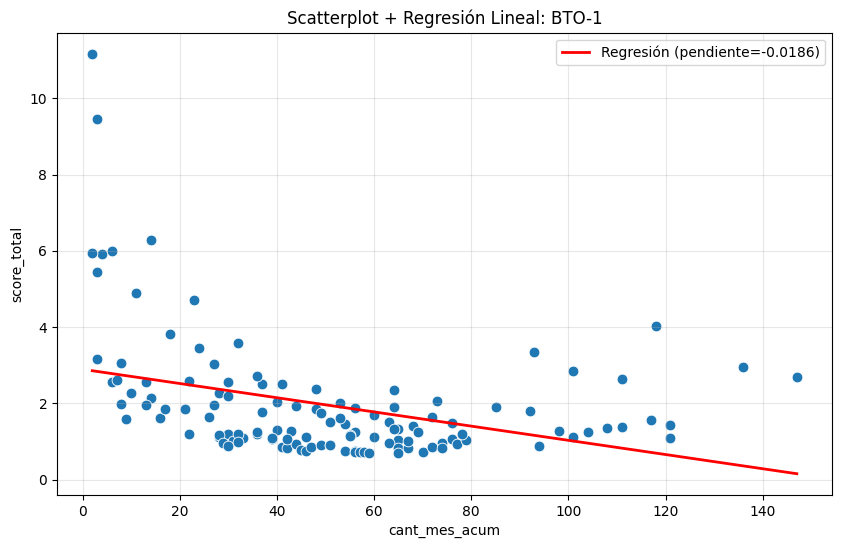


ALERTA: BTO-10



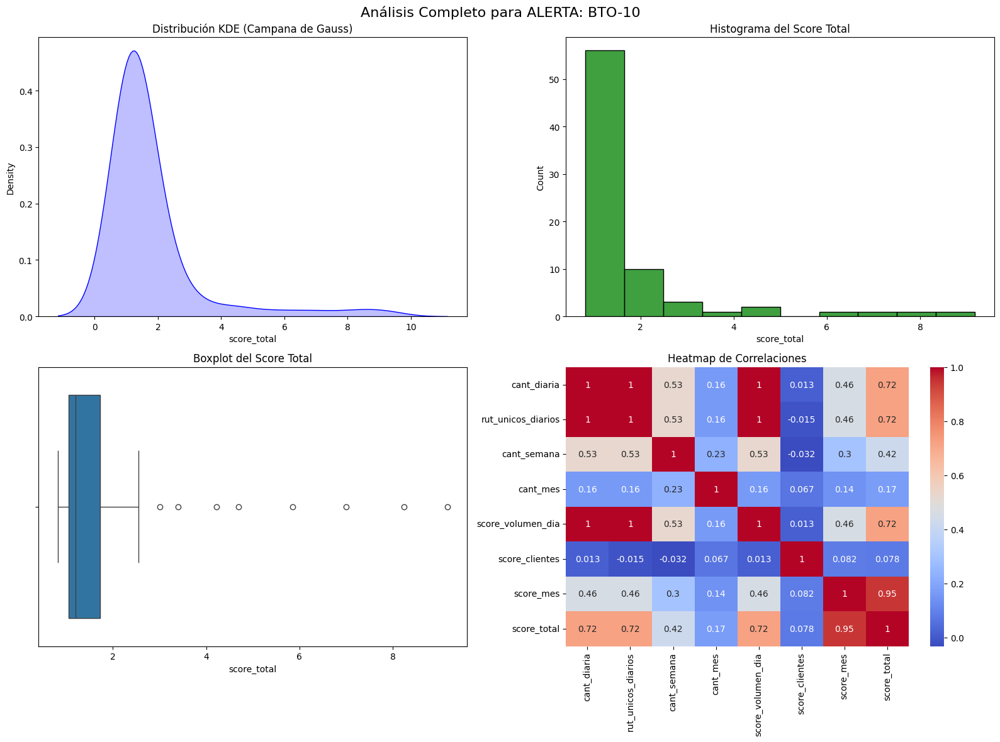

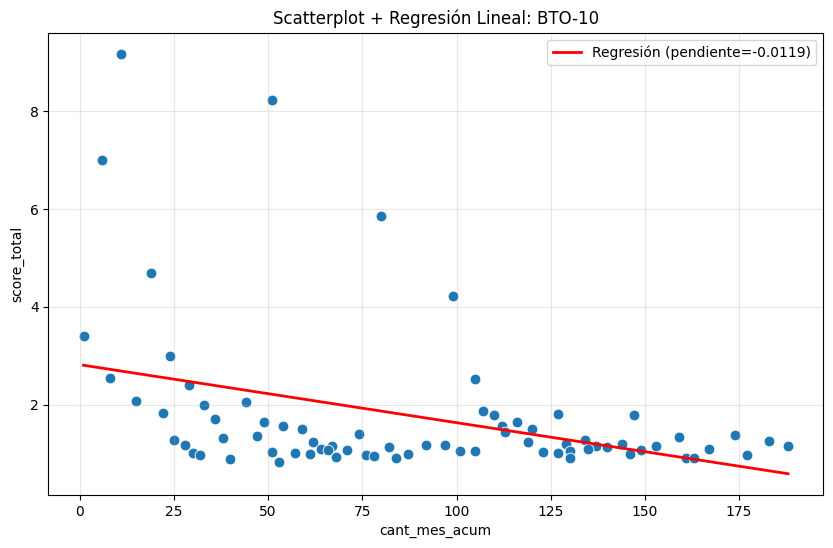


ALERTA: BTO-12



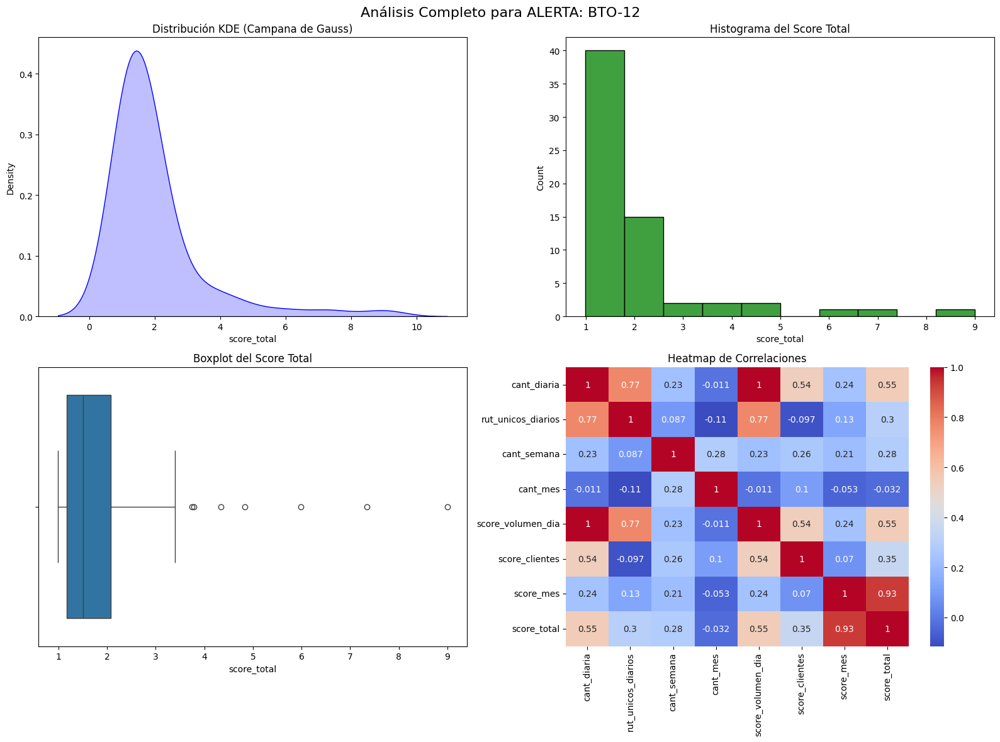

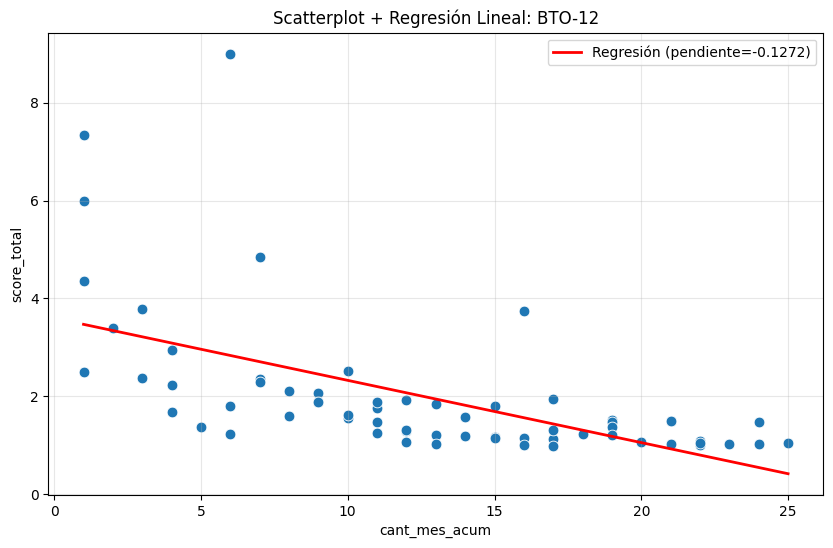


ALERTA: BTO-15



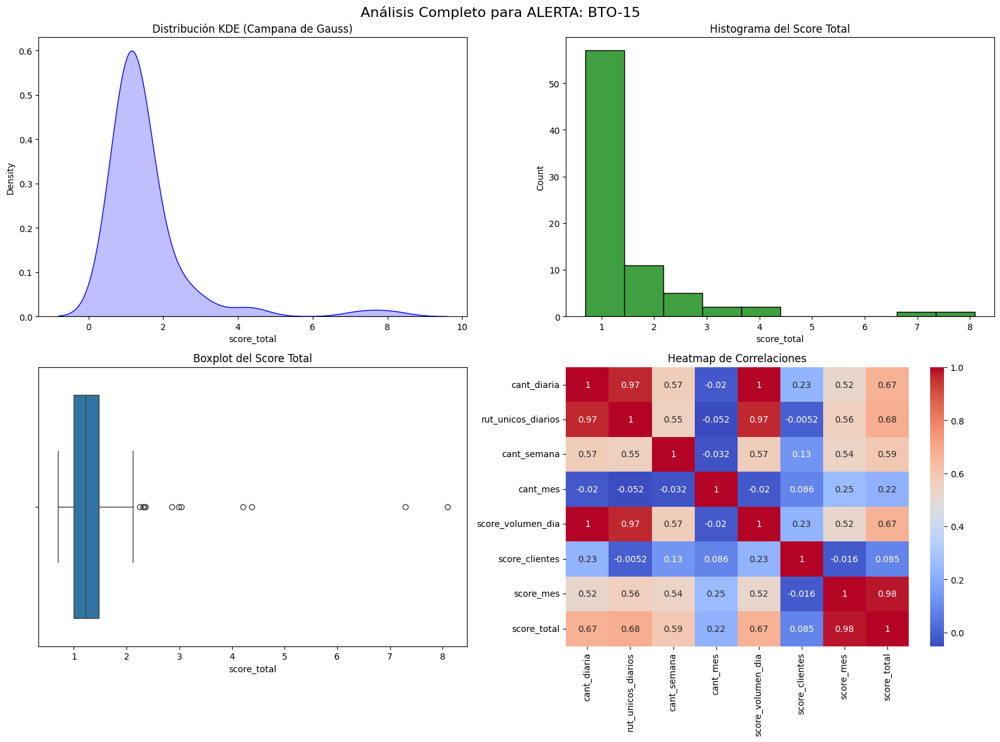

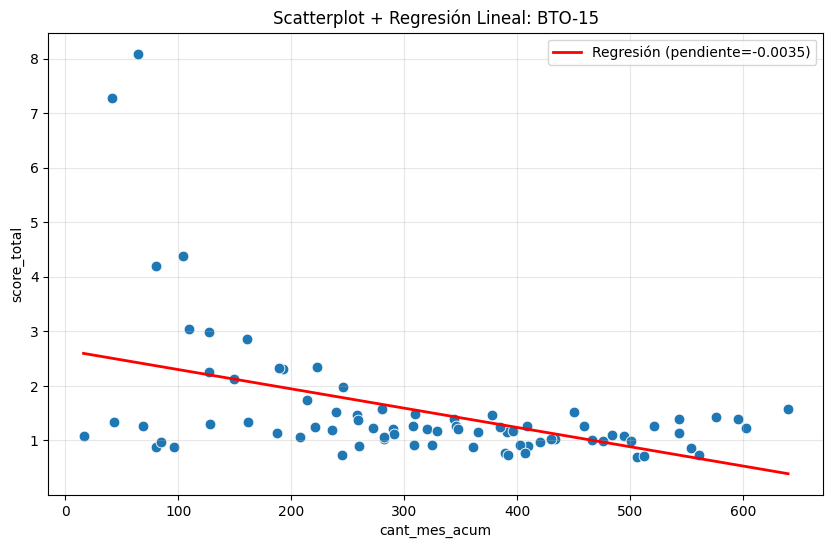


ALERTA: BTO-16



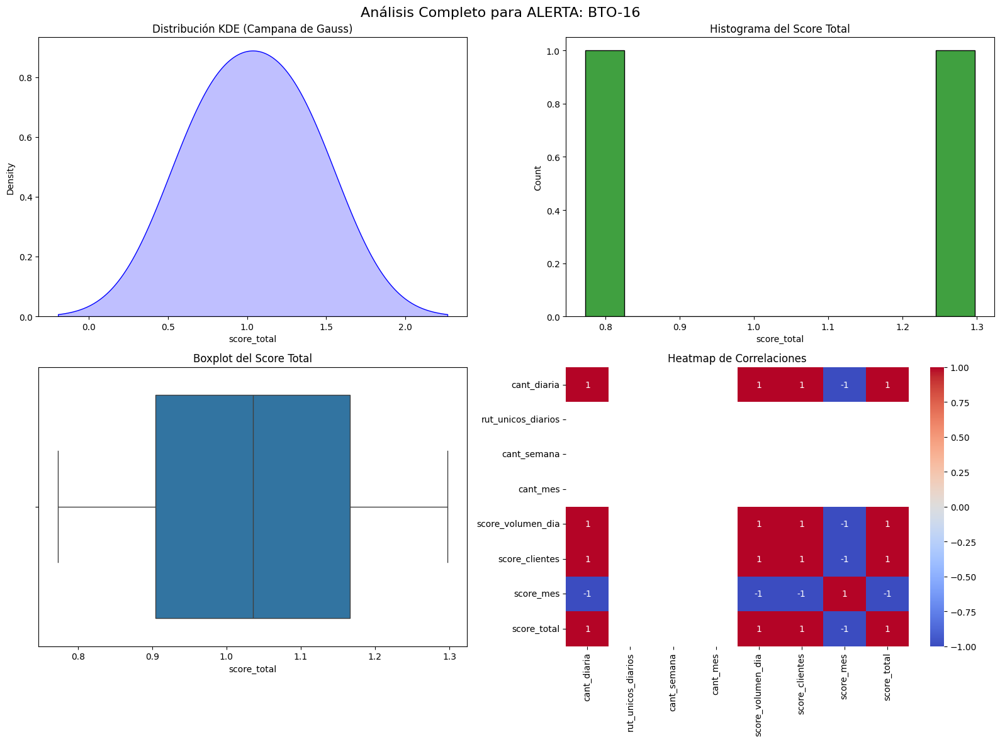

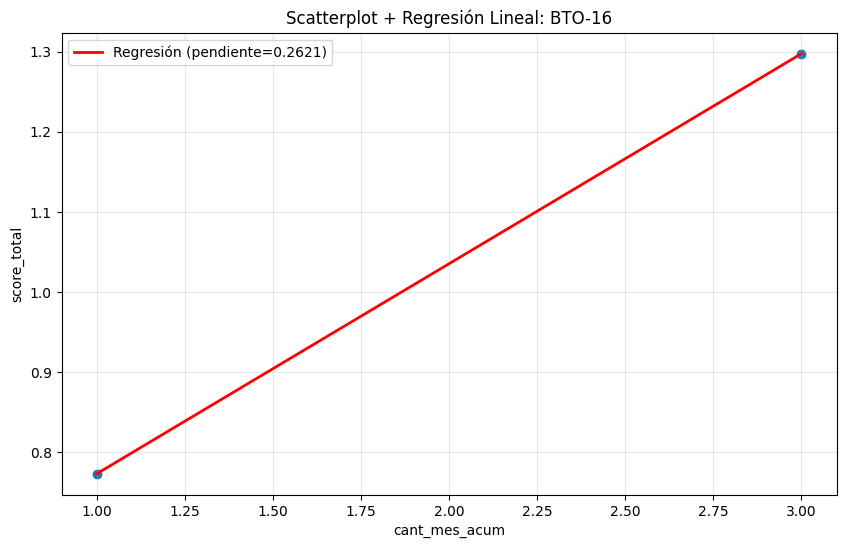


ALERTA: BTO-3



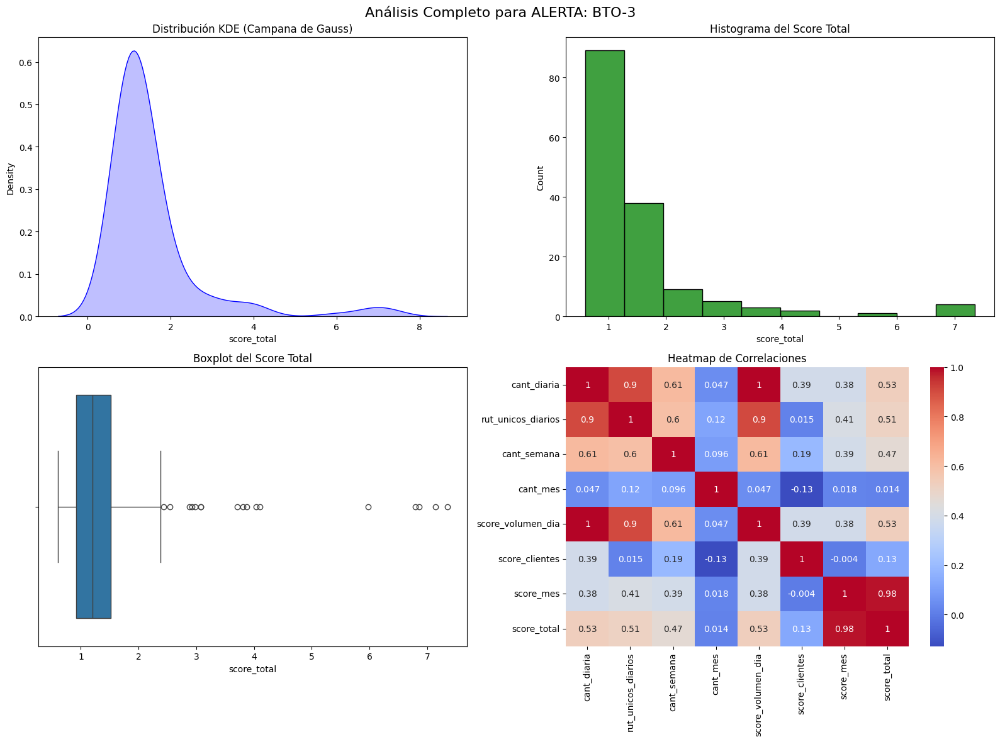

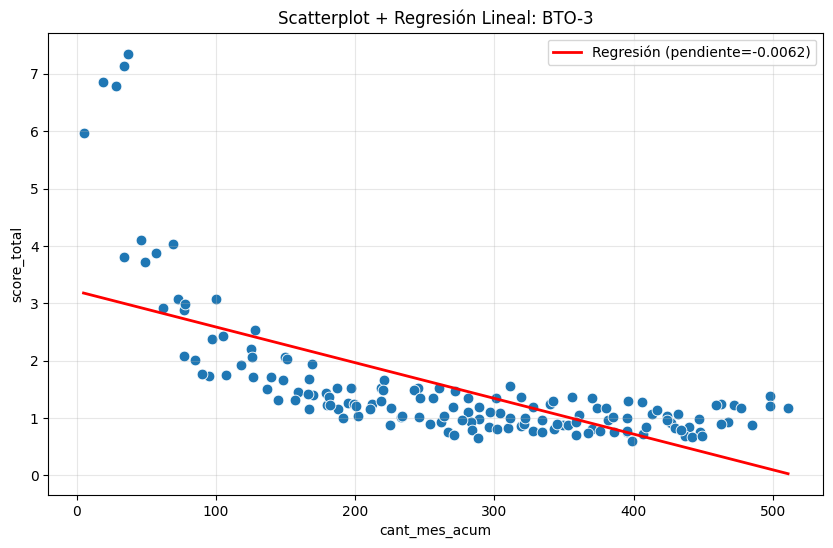


ALERTA: CC_ALERTA_BILLETERA_DATE_TOKEN



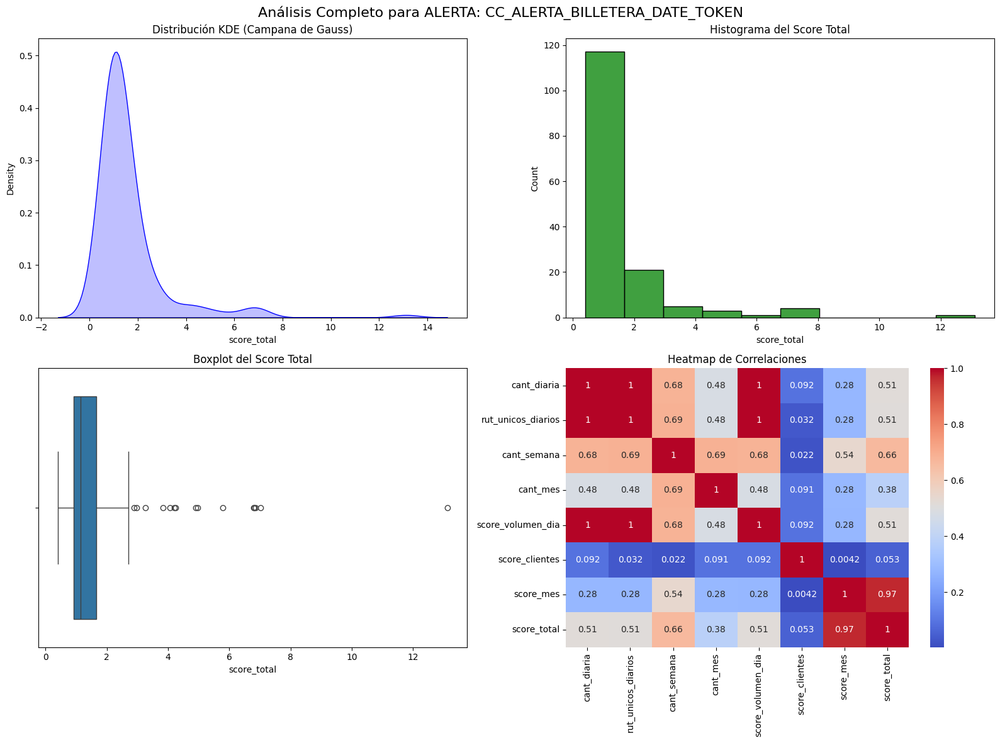

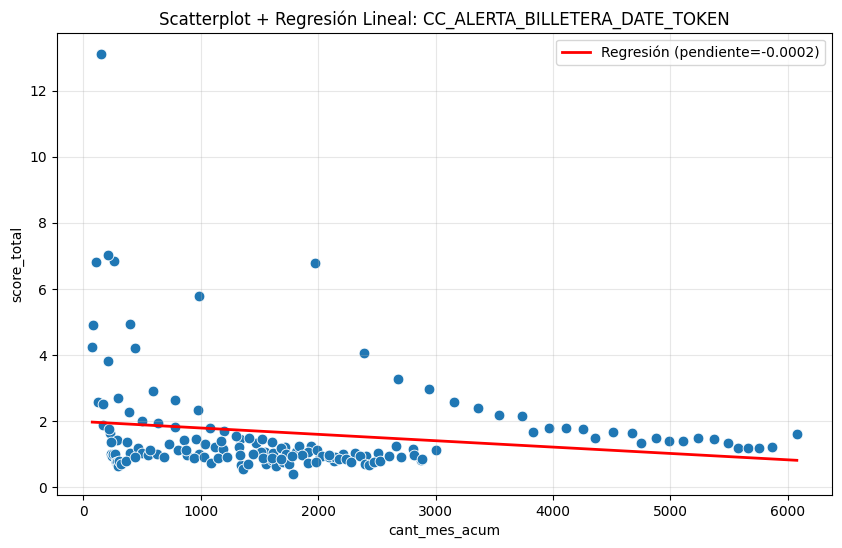


ALERTA: CC_BILLETERA_INTERNACIONAL



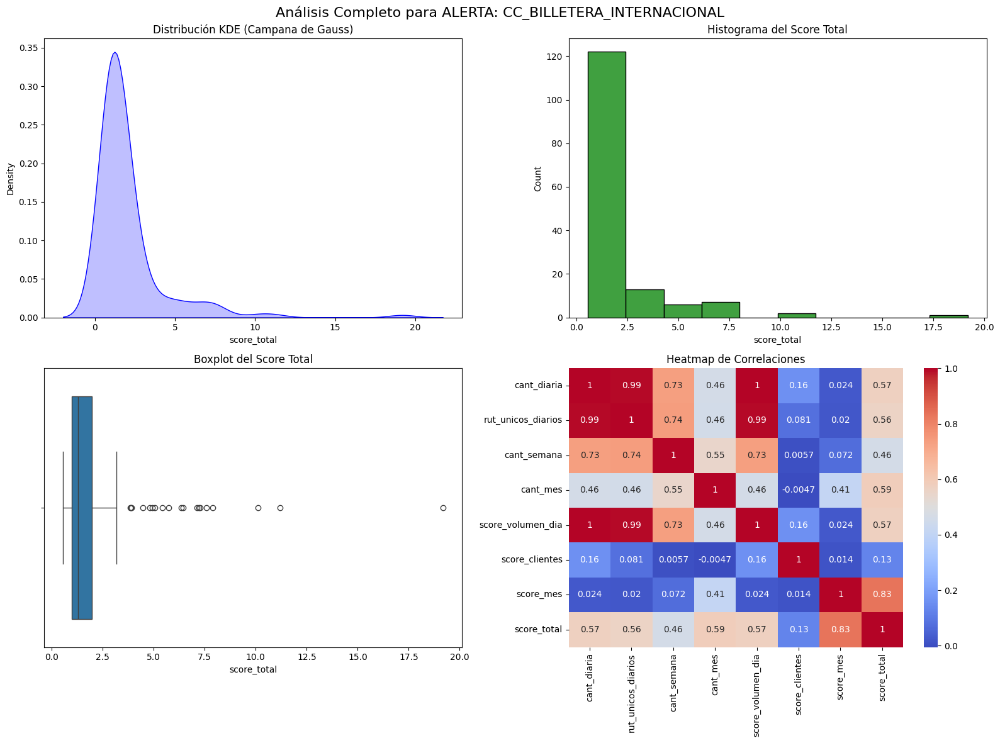

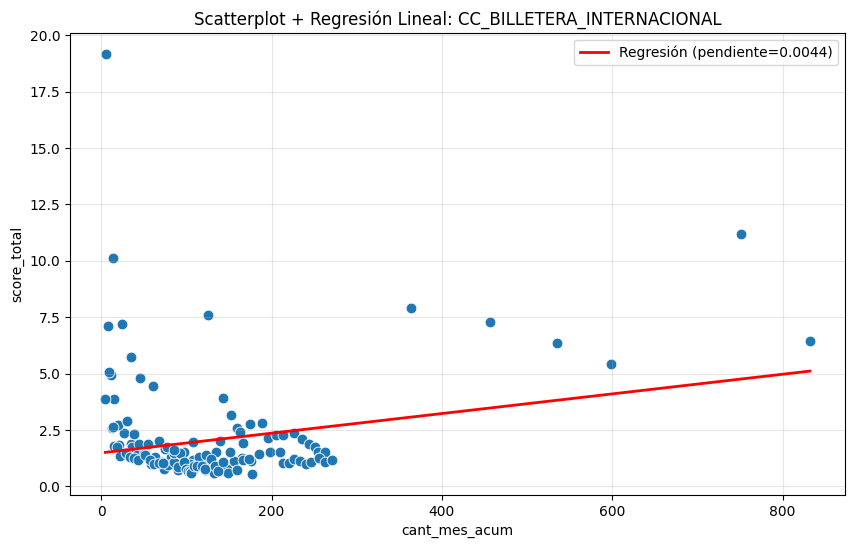


ALERTA: CC_CCIO_PRUEBA_BANDA



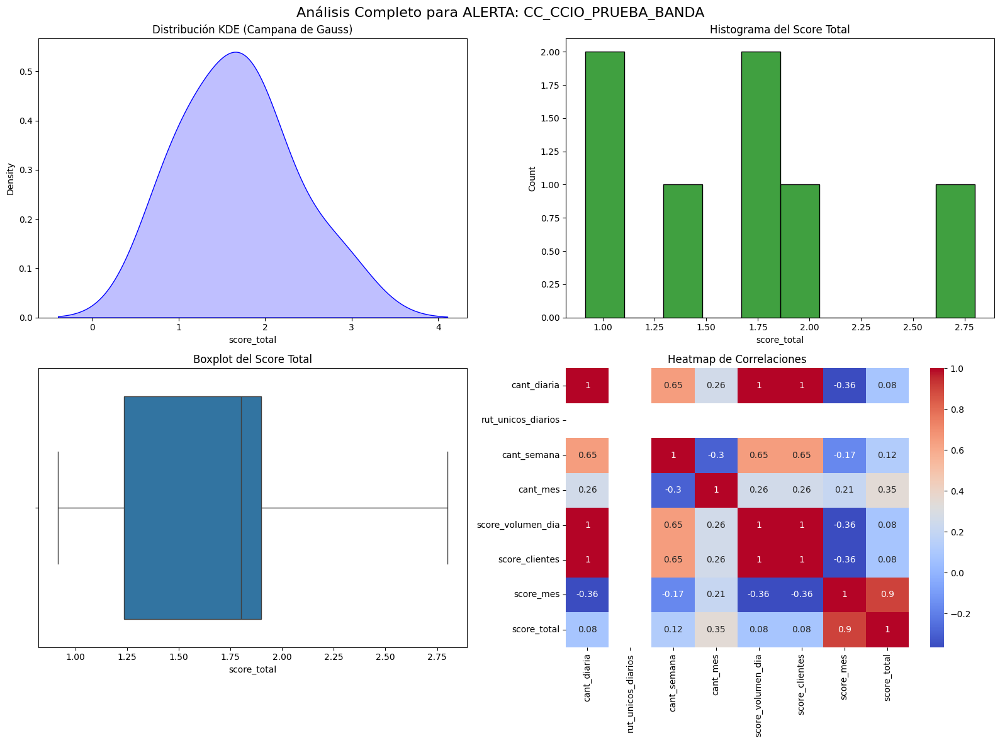

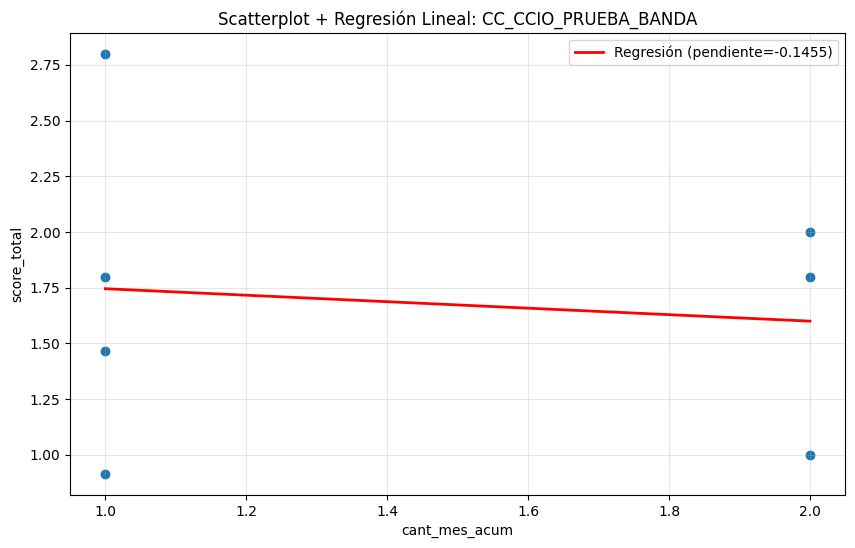


ALERTA: CC_COMERCIOS_WEBPAY



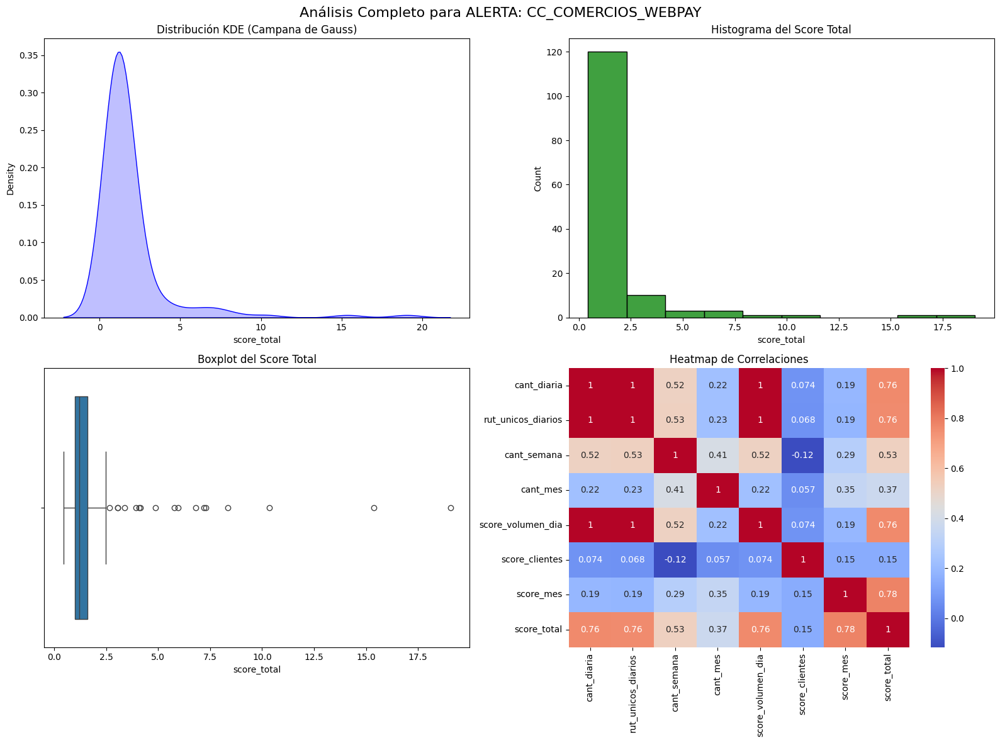

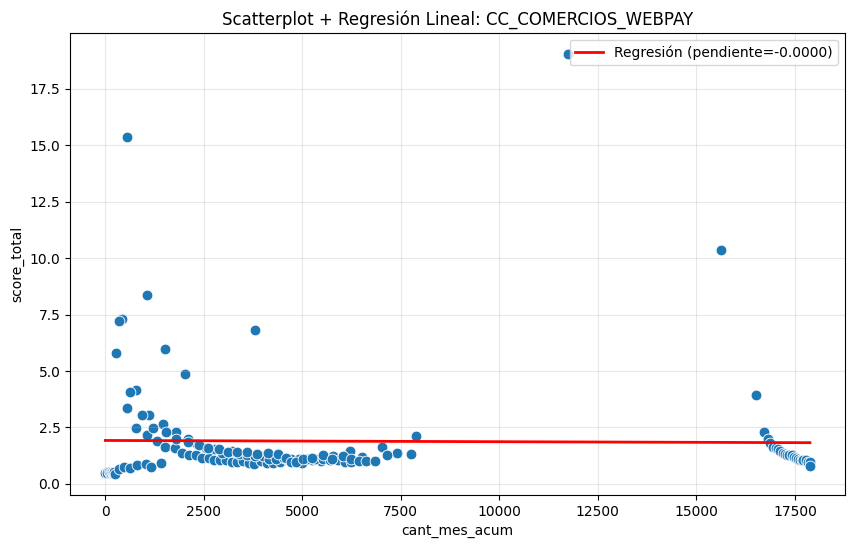


ALERTA: CC_ECOMMERCE_SCORE_ALTO



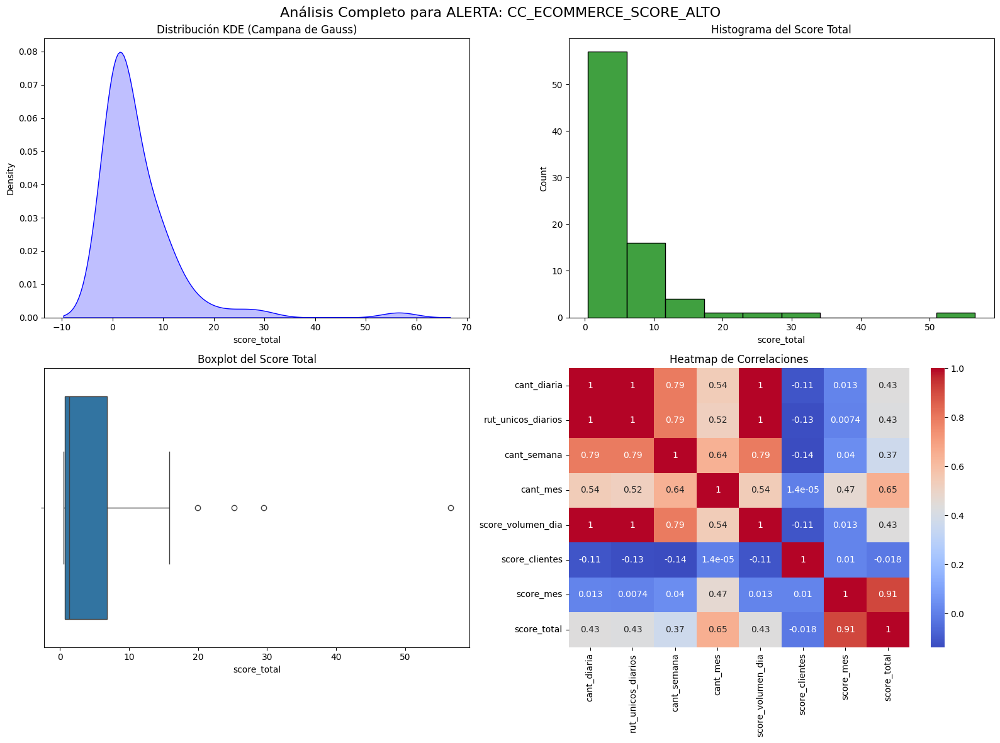

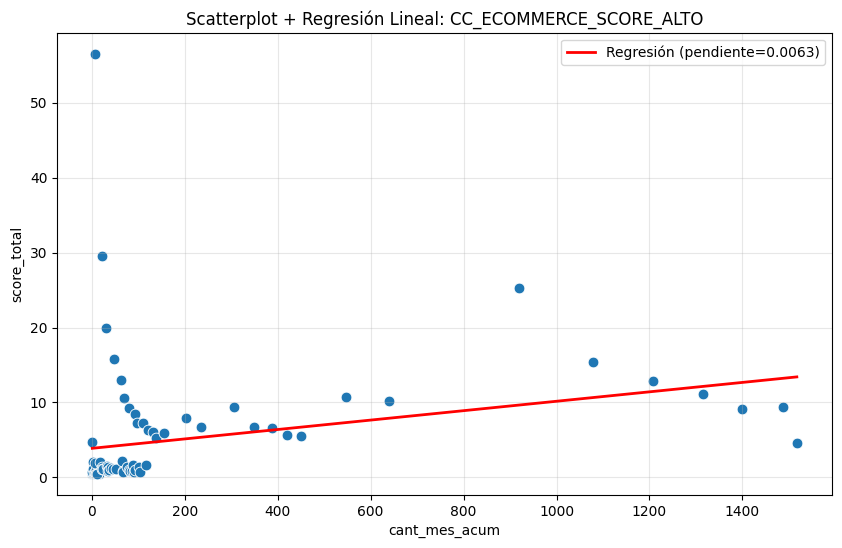


ALERTA: CC_FACEBOOK_2.0



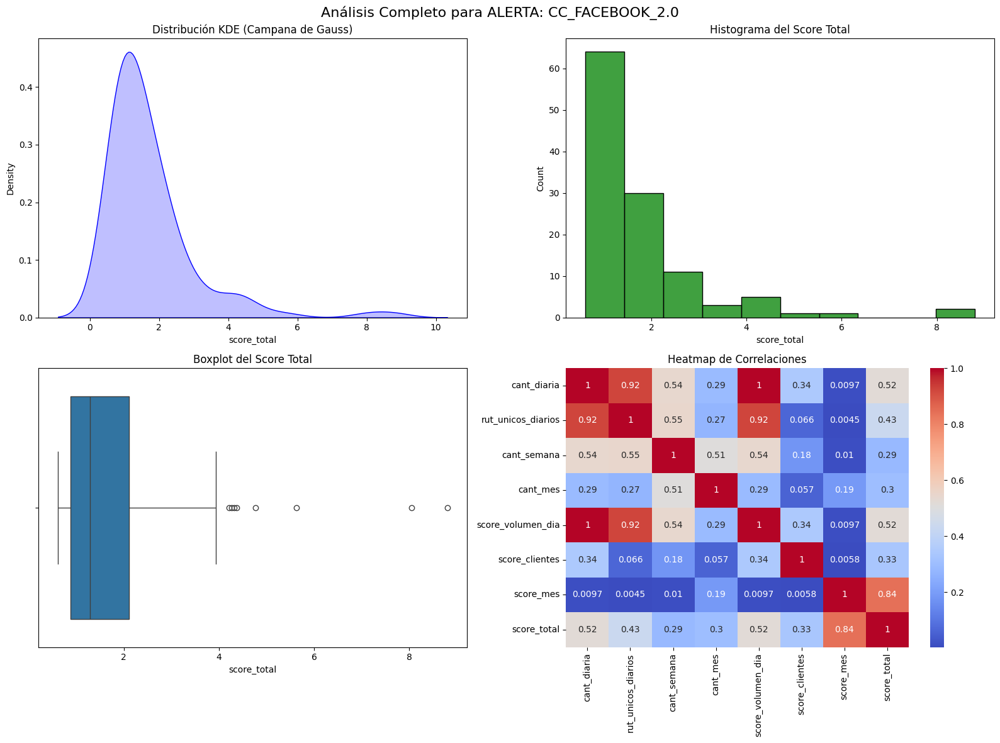

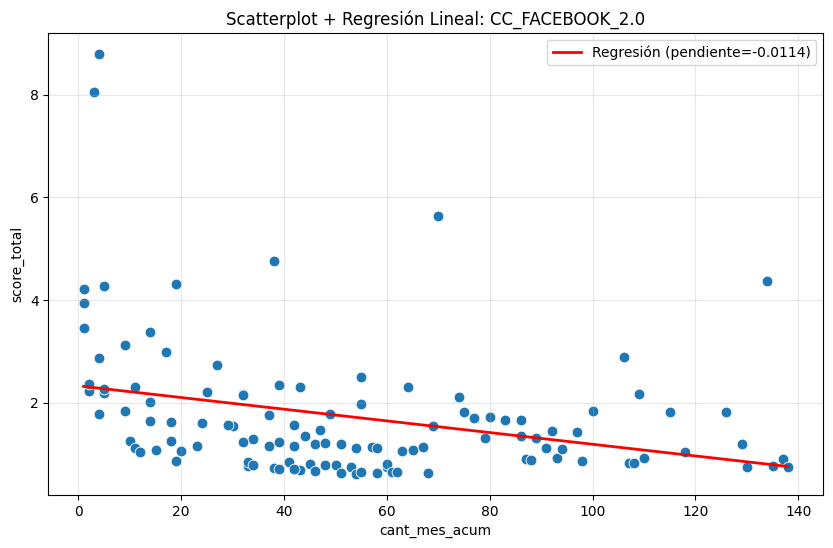


ALERTA: CC_LC_ALERT_POR_MONTO



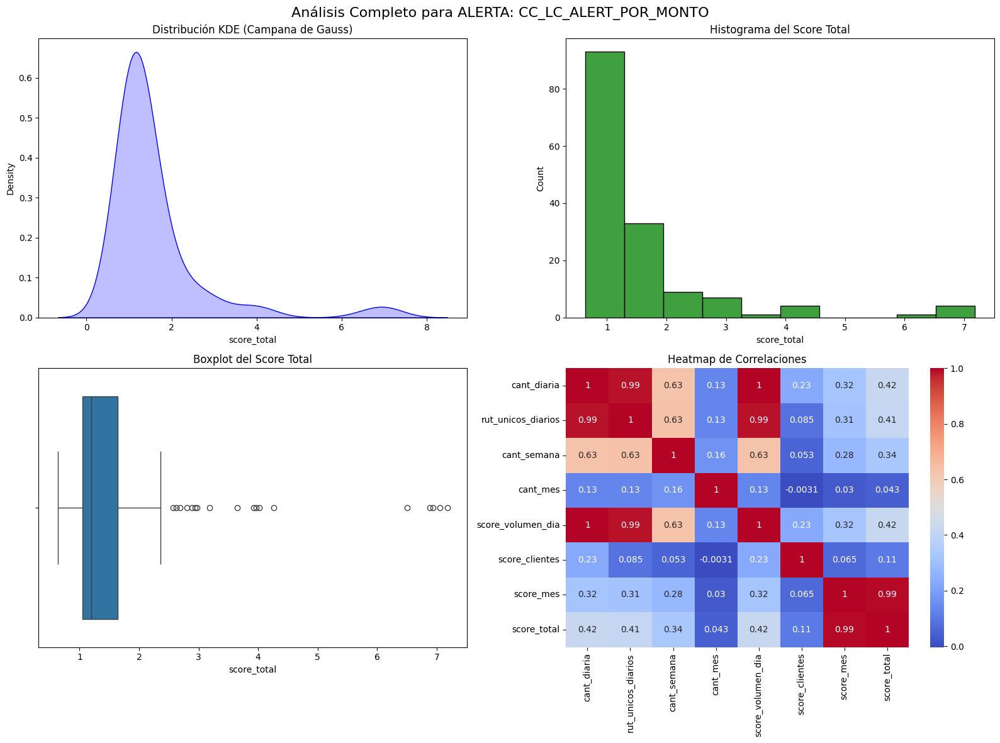

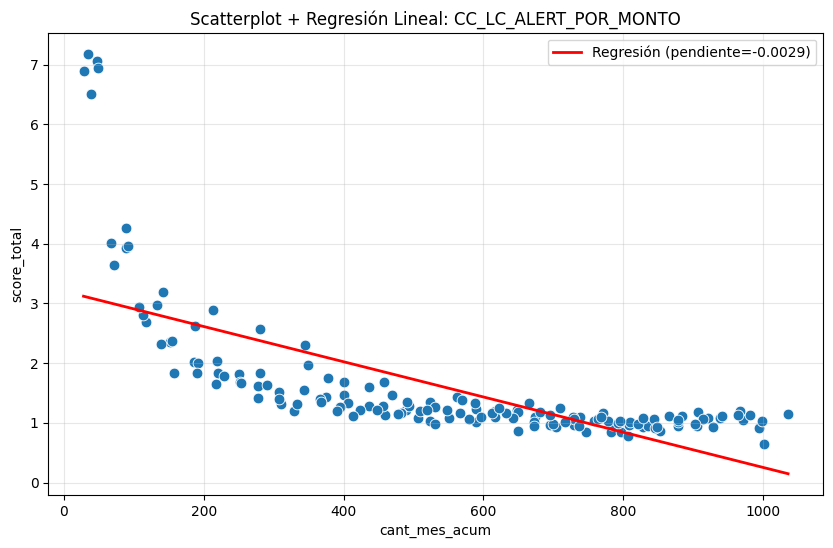


ALERTA: CC_ONE_CLICK_SCORE



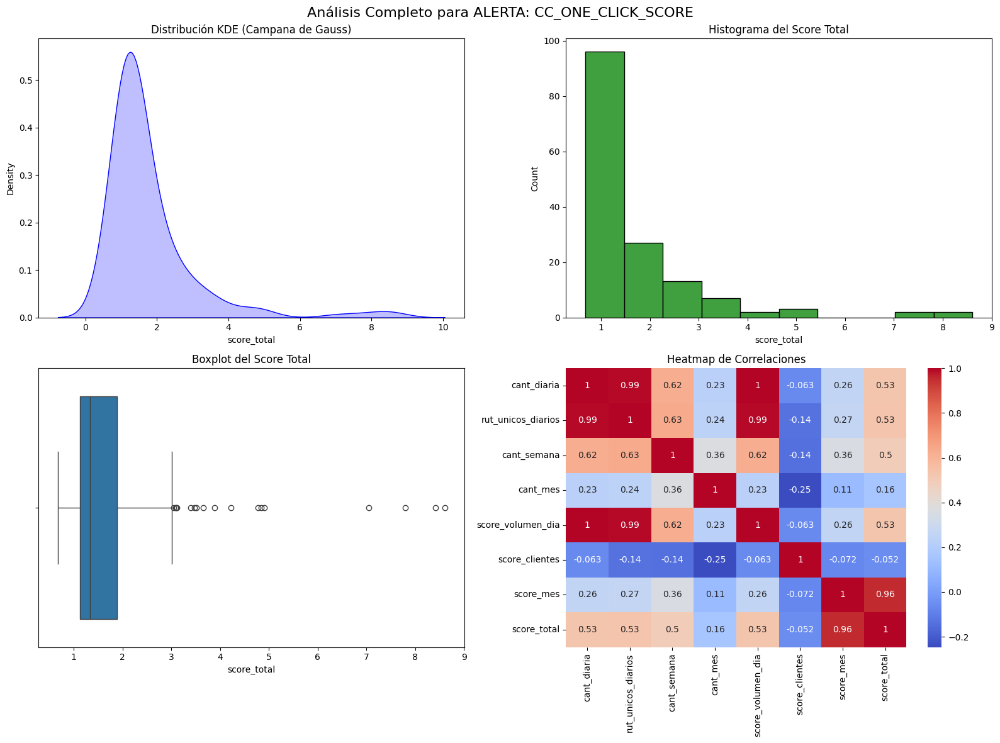

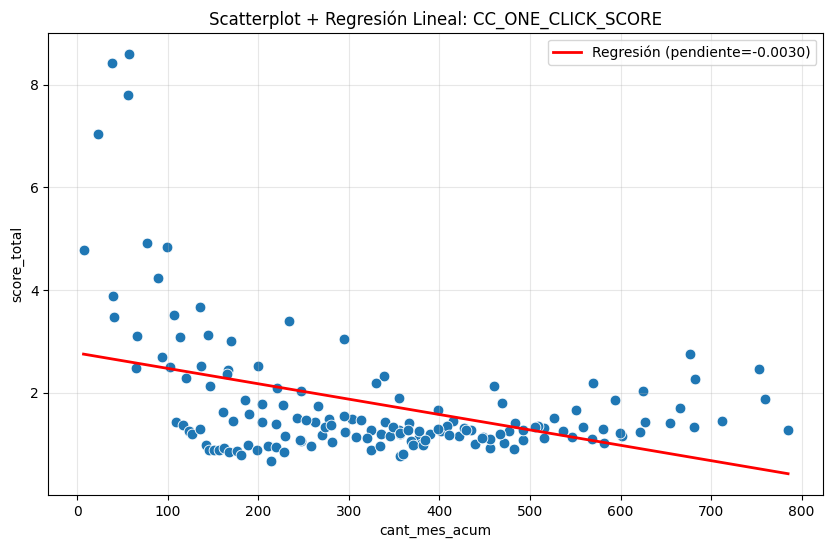


ALERTA: CC_PILOTO_SCORE_VAAI



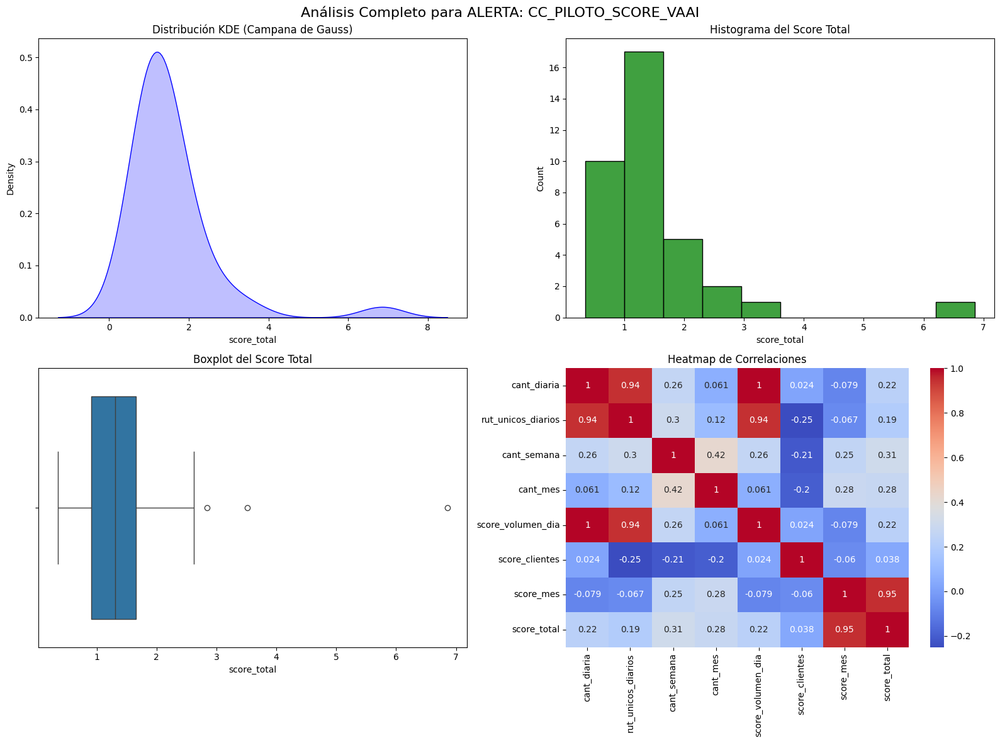

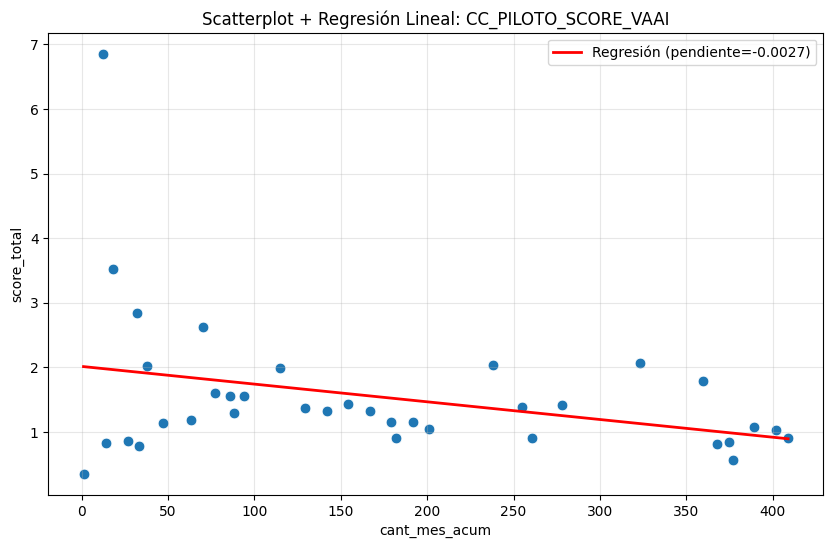


ALERTA: CC_RTP_SUPLANTACION_3DS



C:\Users\gonza\AppData\Local\Temp\ipykernel_15092\4156901888.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_a["score_total"], fill=True, ax=axes[0,0], color="blue")
C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


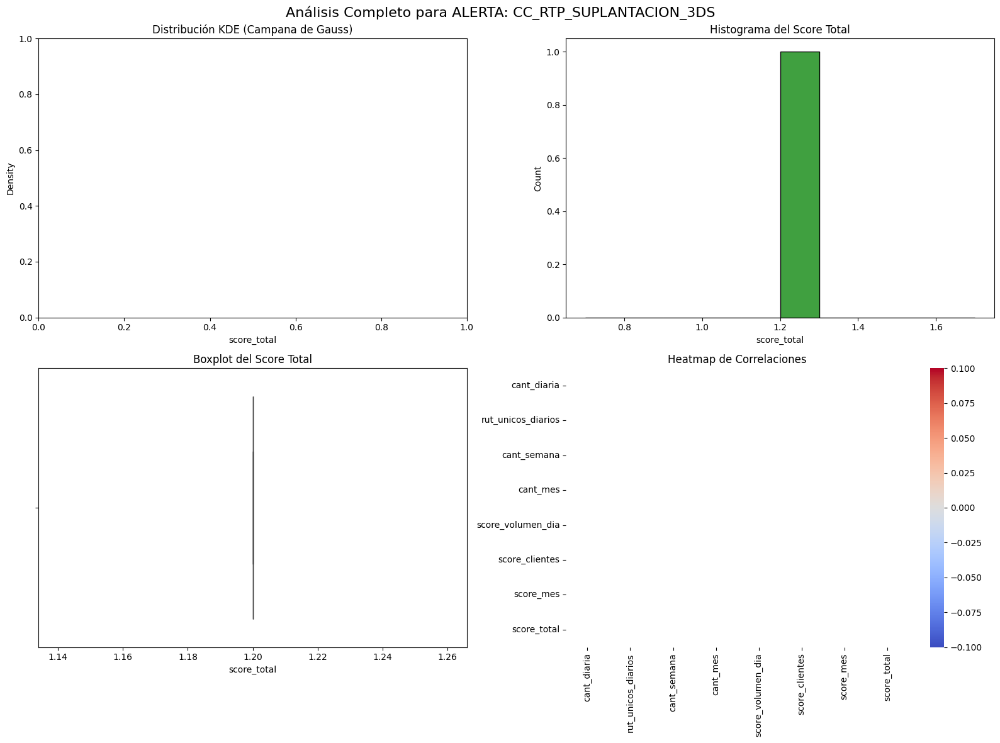

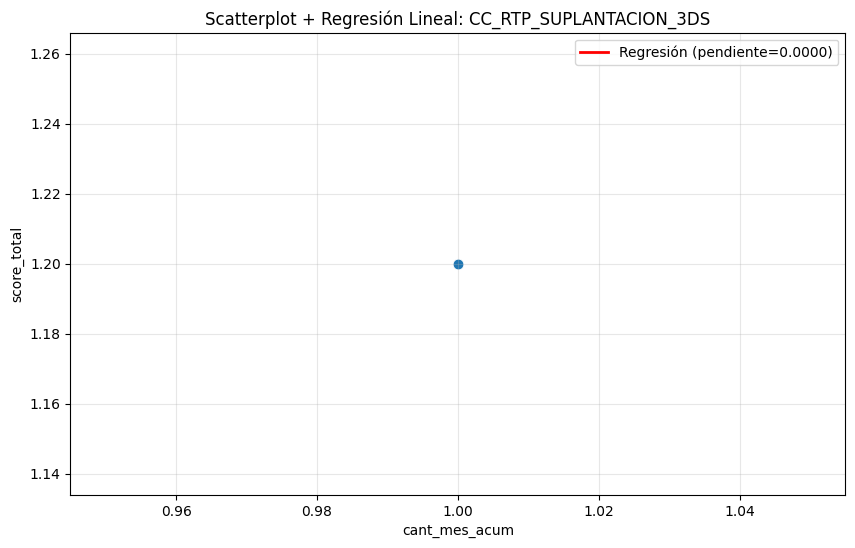


ALERTA: CC_SUPLANTACION_3DS



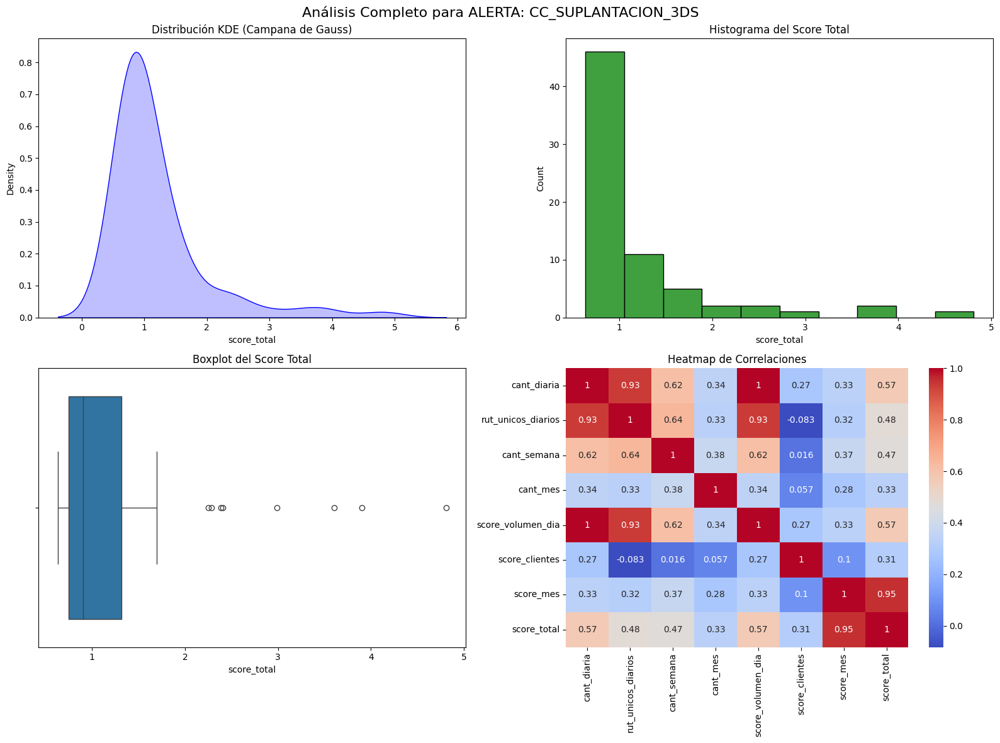

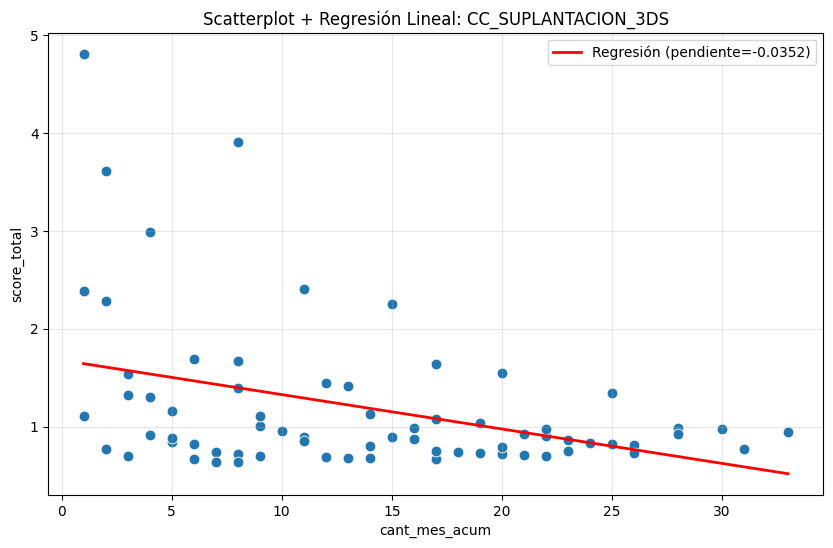


ALERTA: CC_TX_CONSECUTIVA_ECOMMERCE



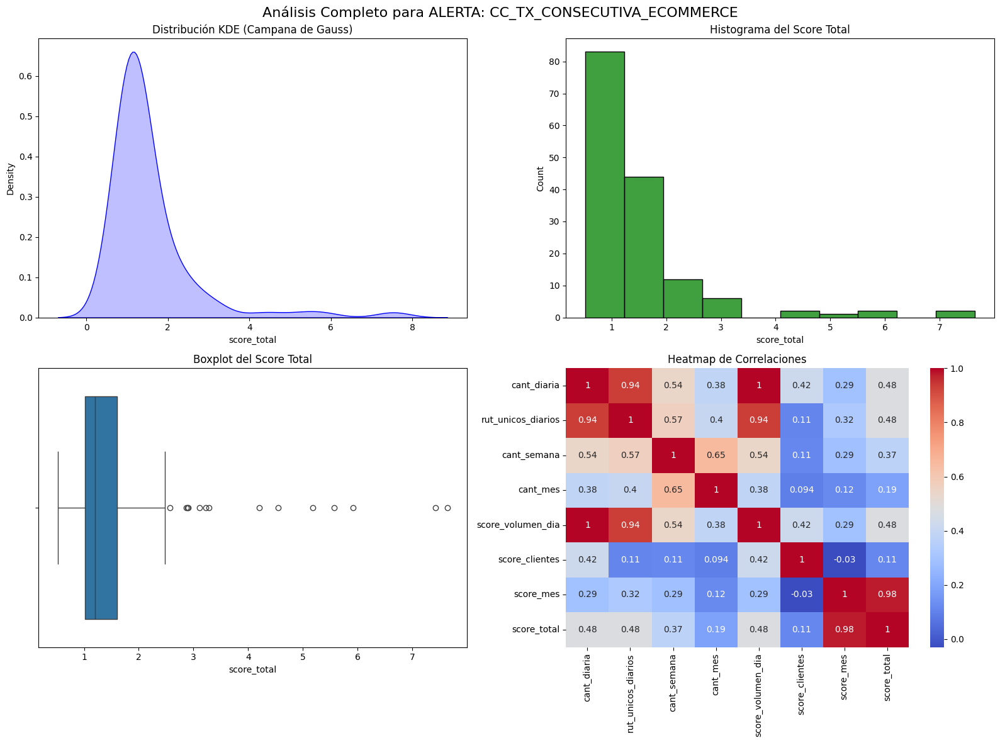

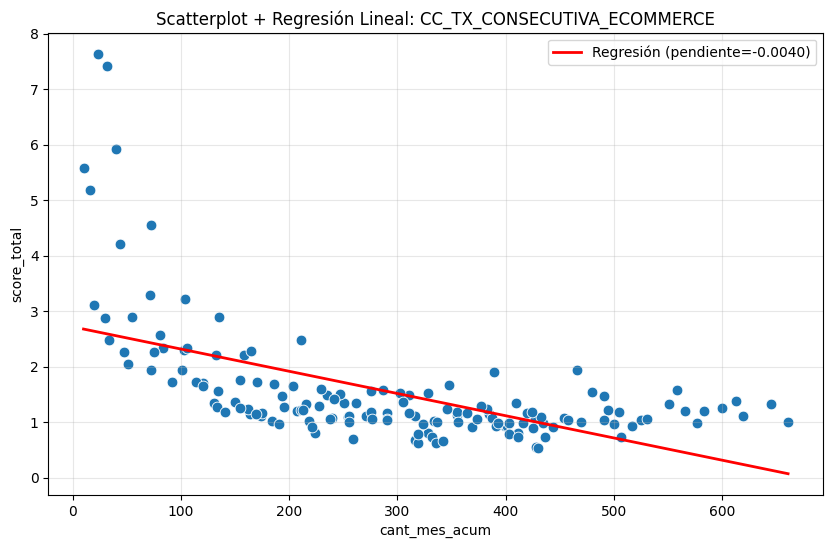


ALERTA: CC_VALIDA_PRIM._TRX_MP_WALLET



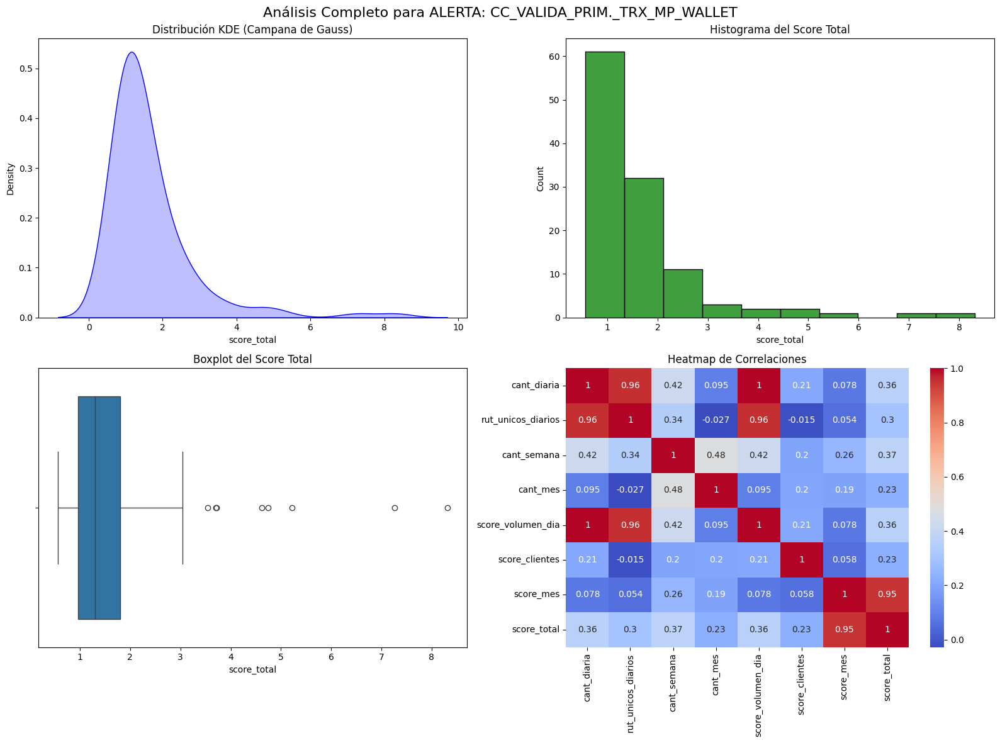

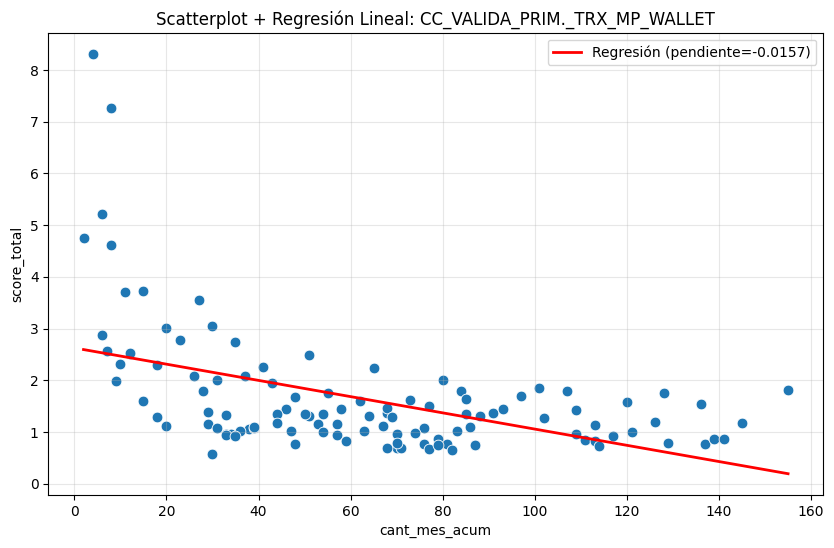


ALERTA: CMPA-04



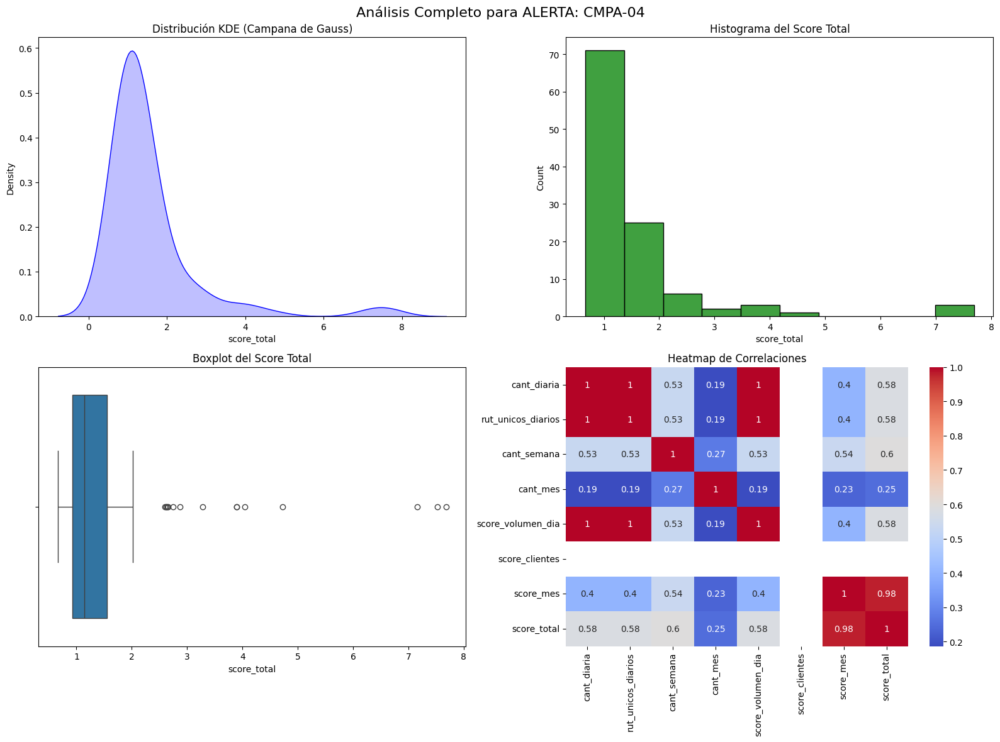

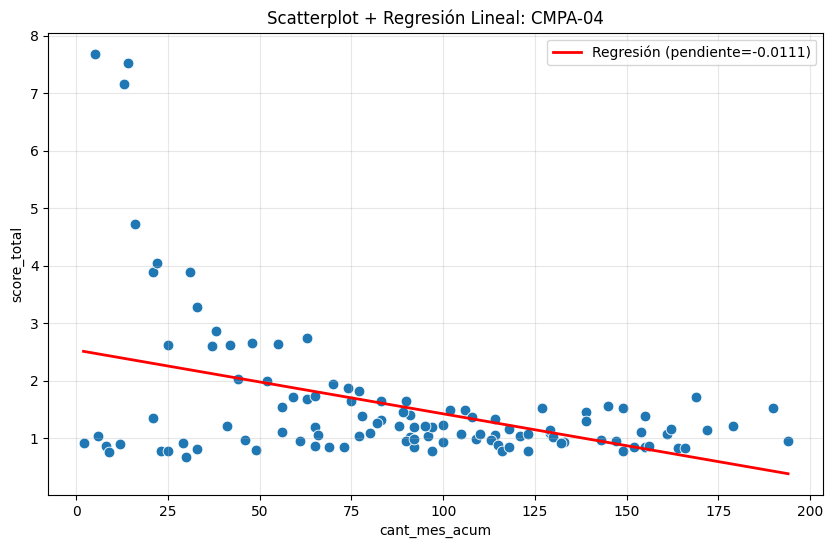


ALERTA: CMPA-05



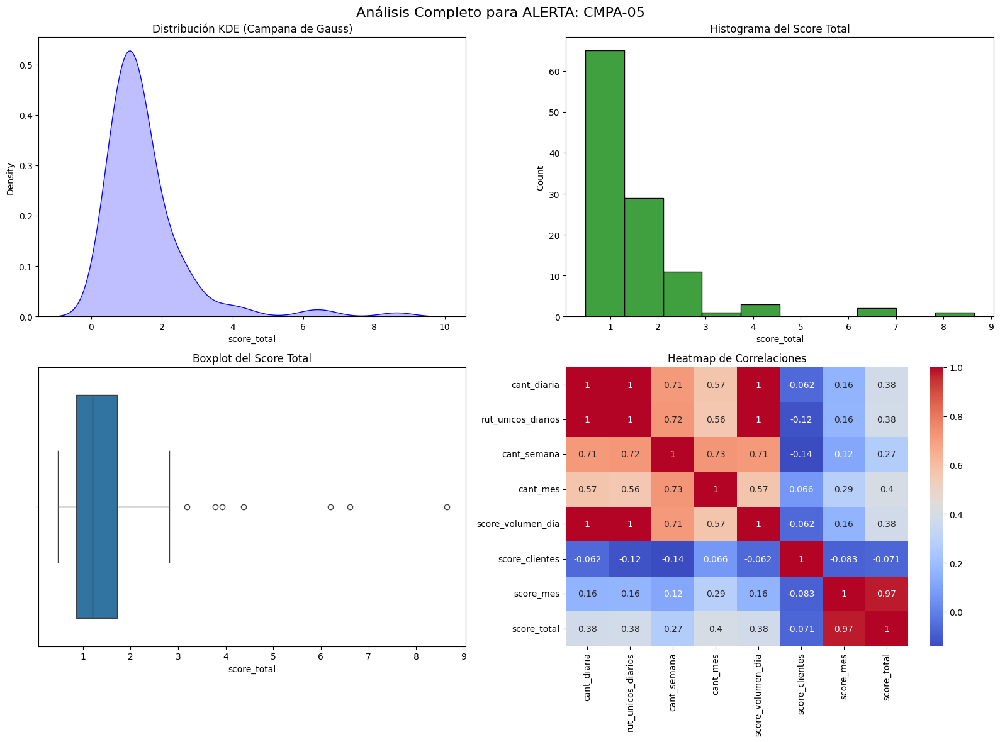

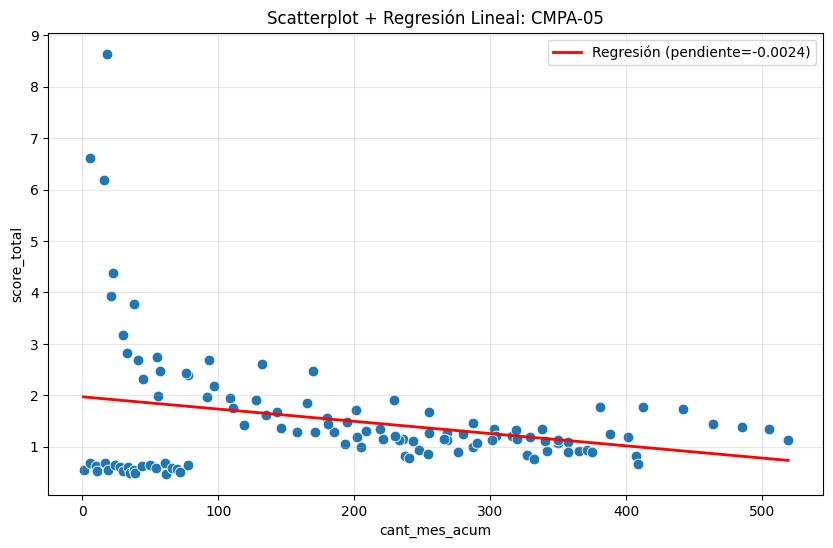


ALERTA: CMPA-06



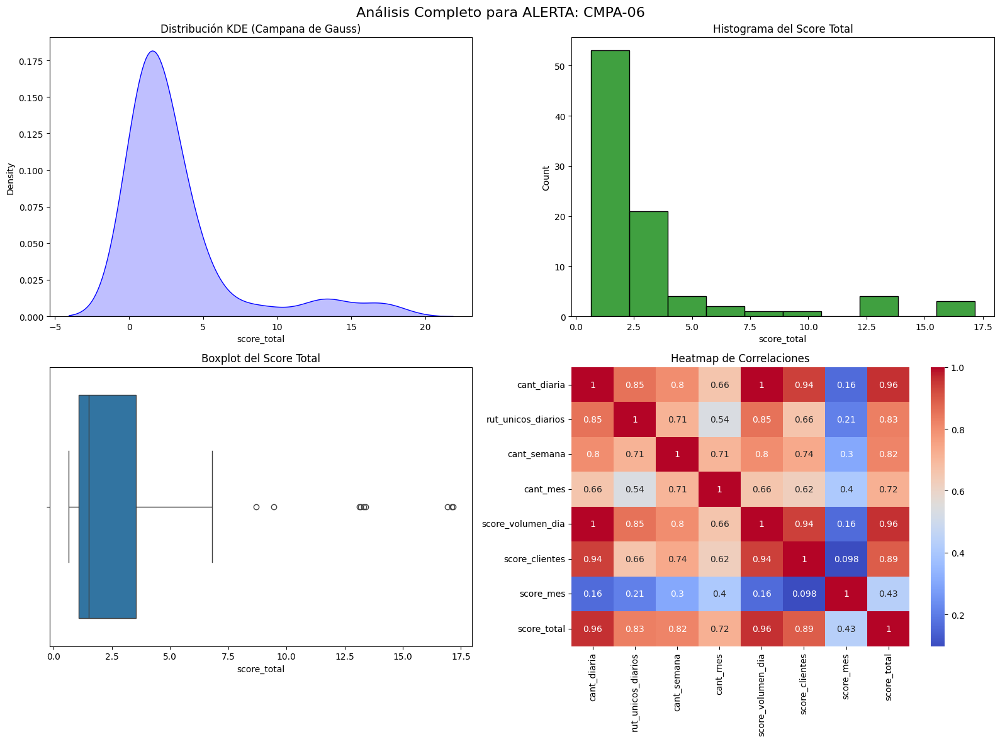

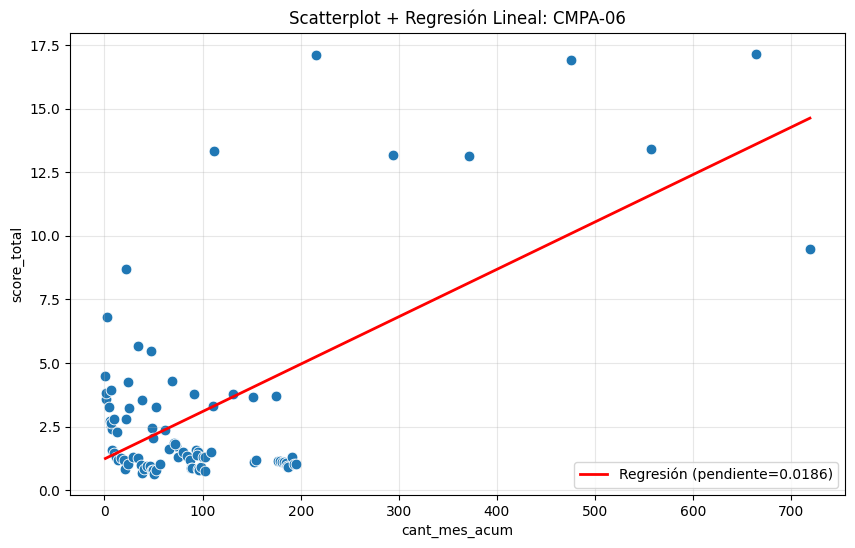


ALERTA: CMPA-07



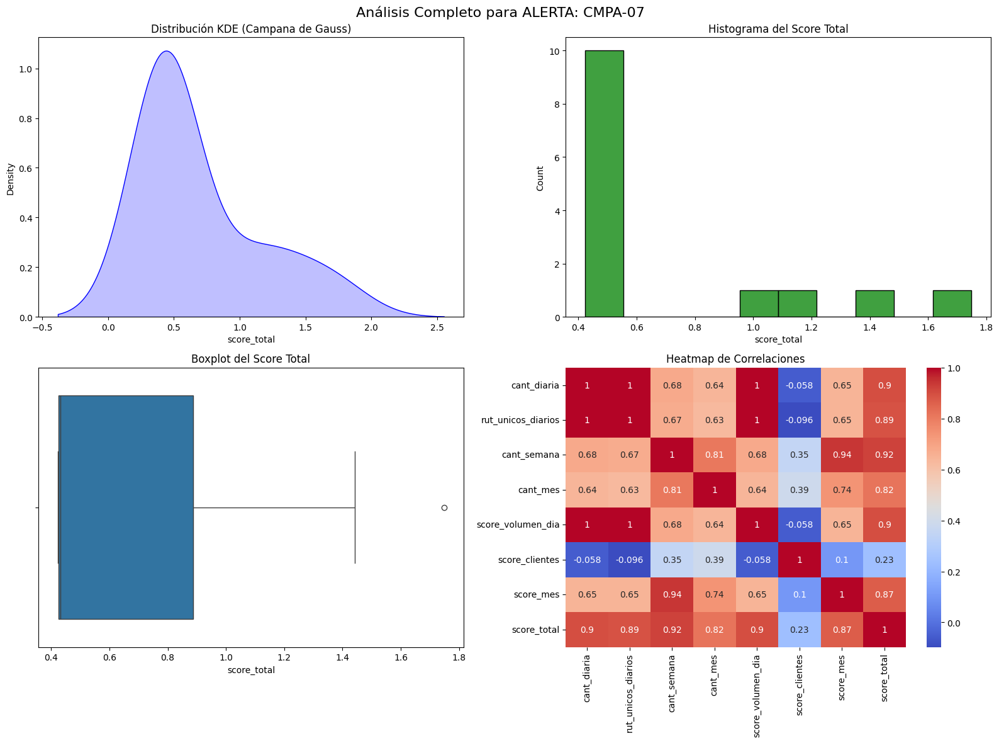

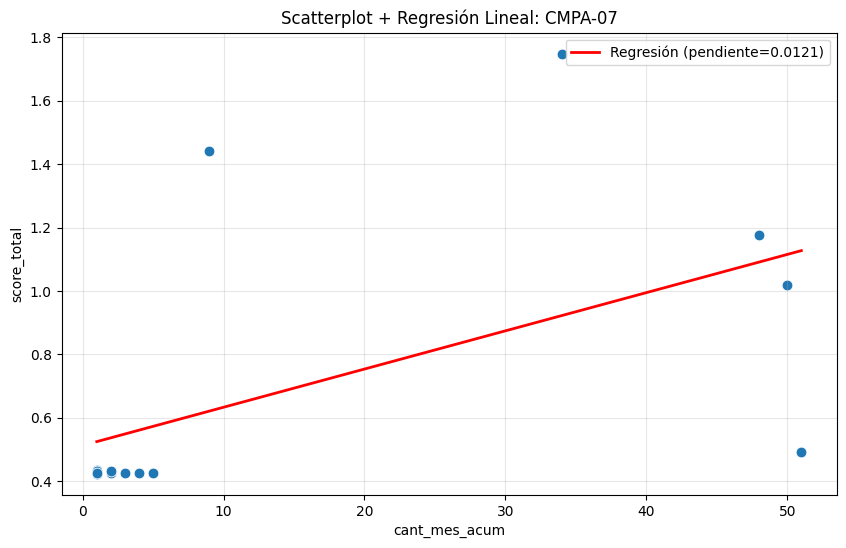


ALERTA: COMB-11



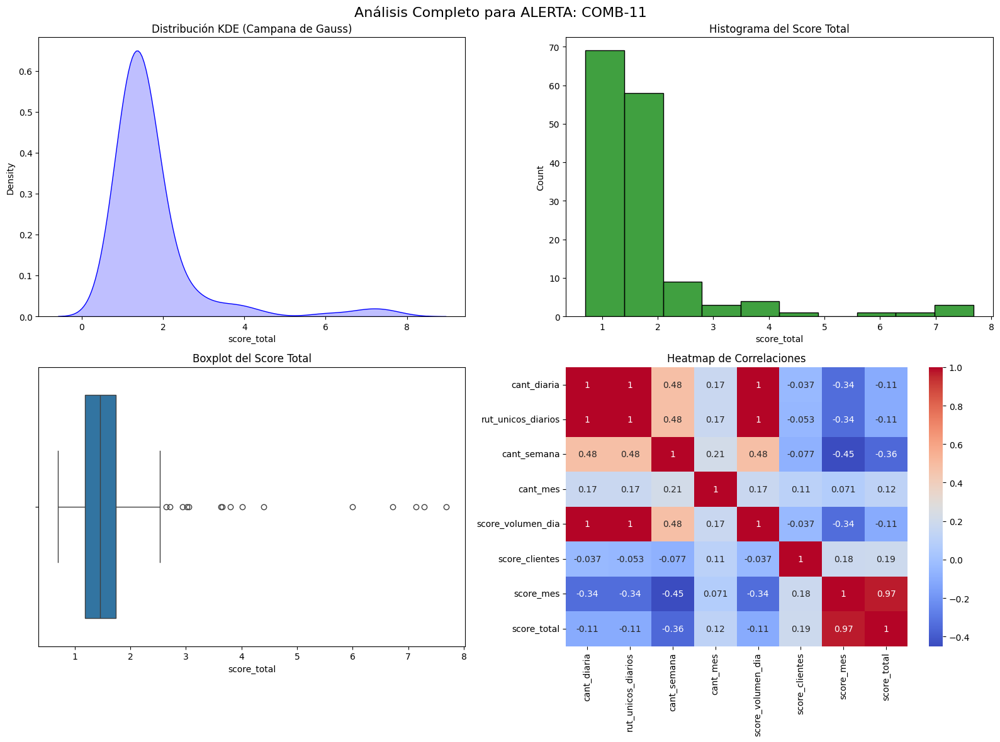

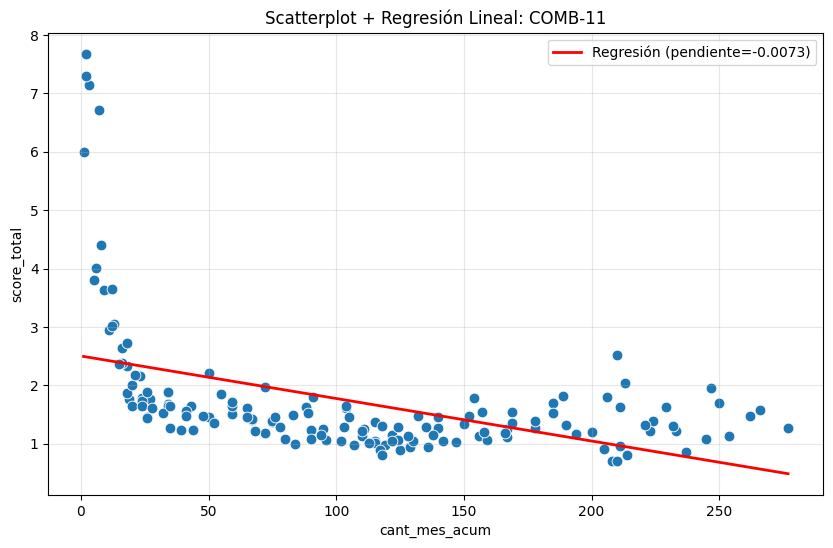


ALERTA: COMB-13



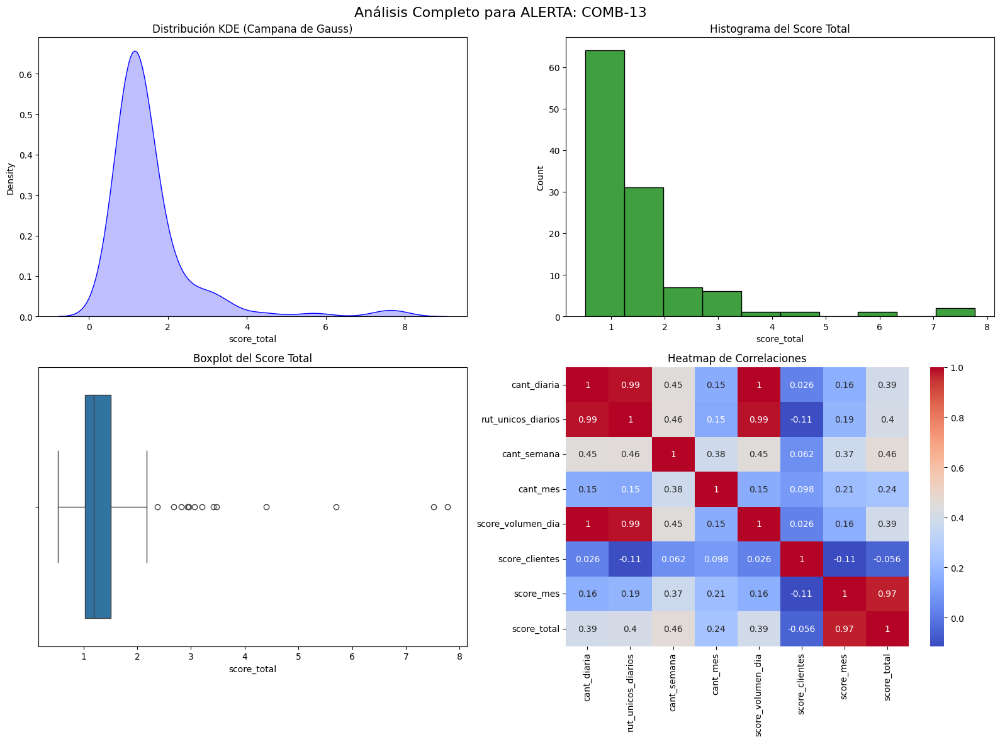

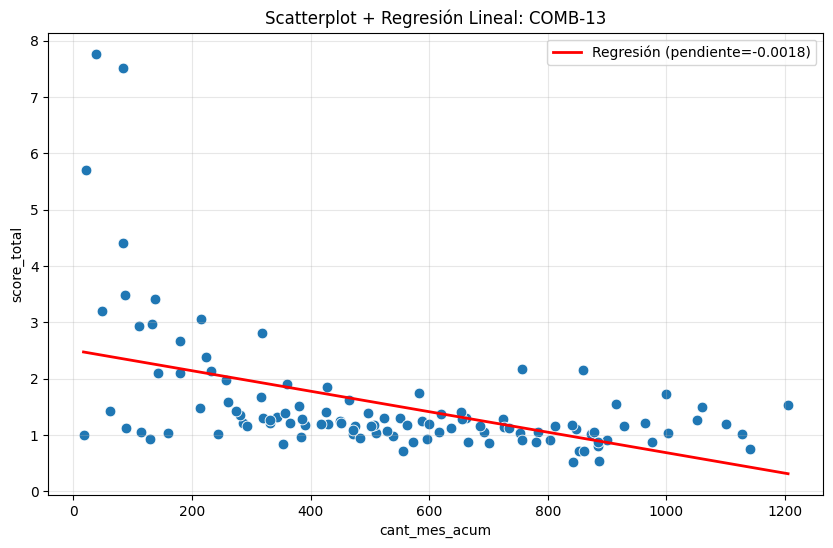


ALERTA: COMB-17



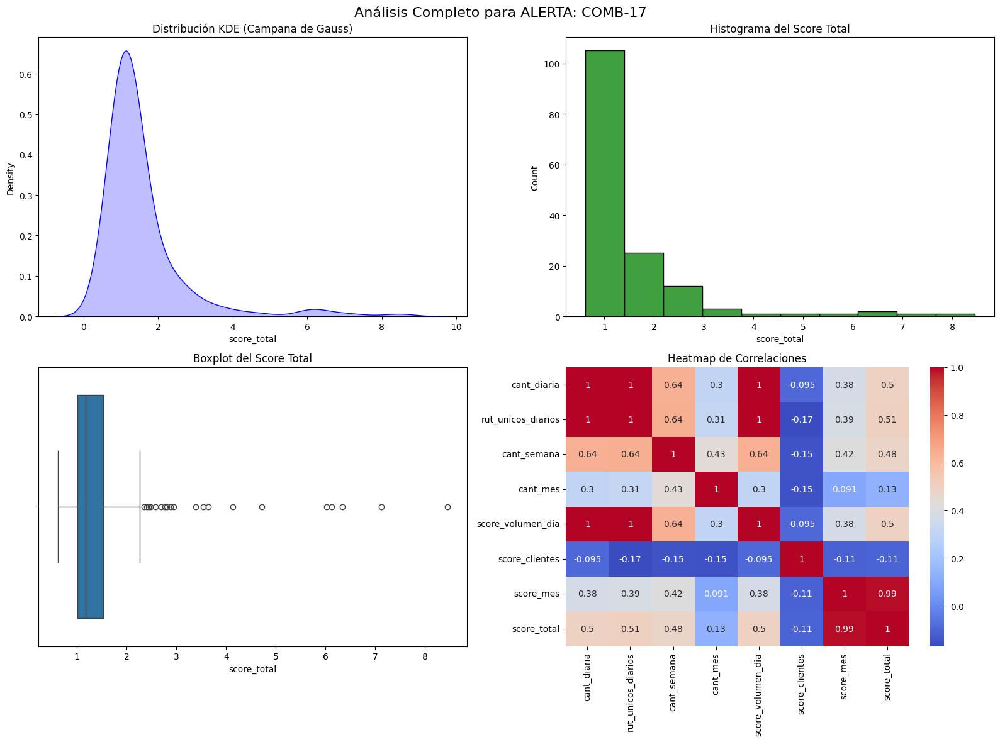

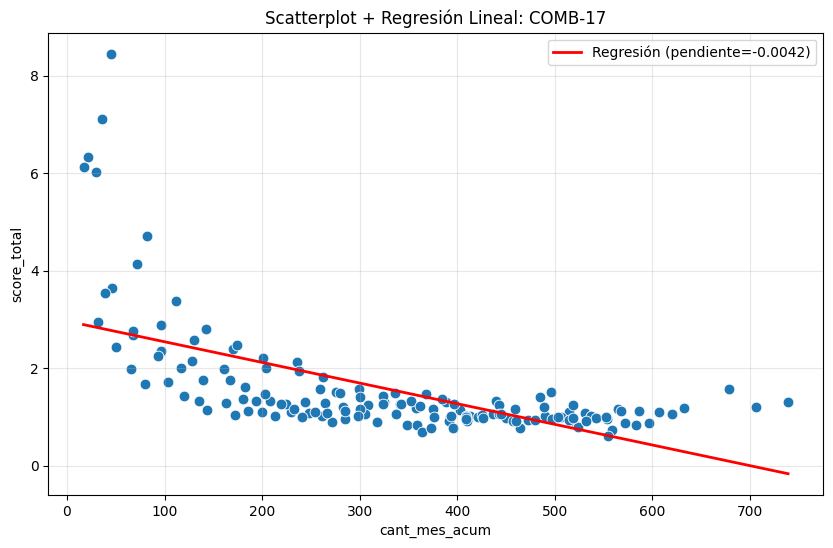


ALERTA: COMB-24



C:\Users\gonza\AppData\Local\Temp\ipykernel_15092\4156901888.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_a["score_total"], fill=True, ax=axes[0,0], color="blue")
C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


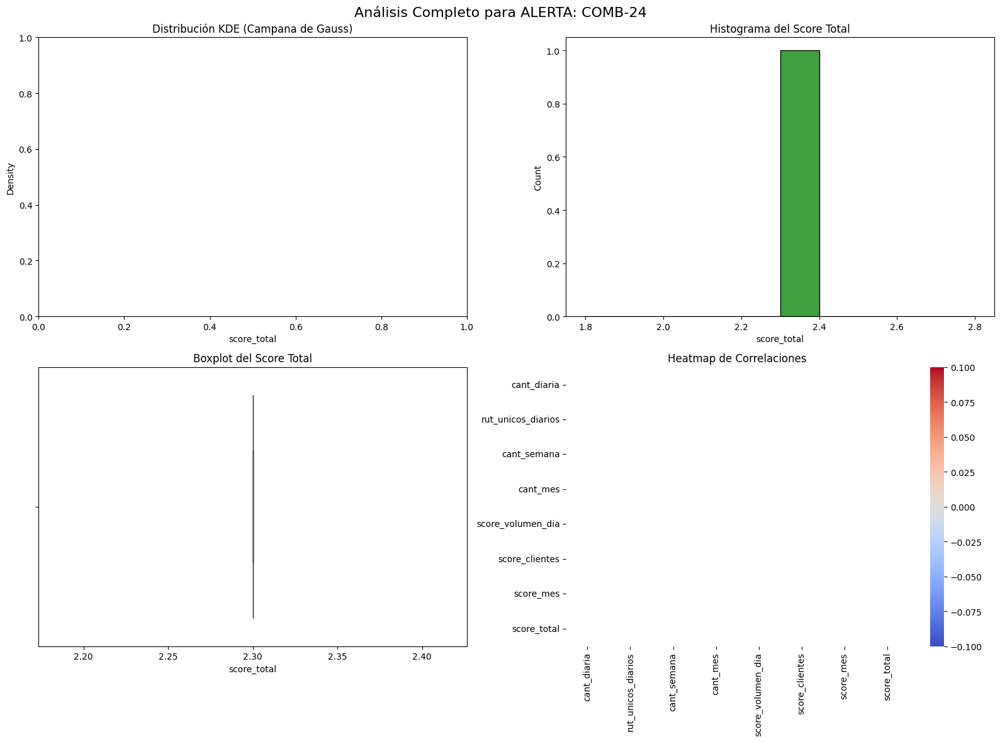

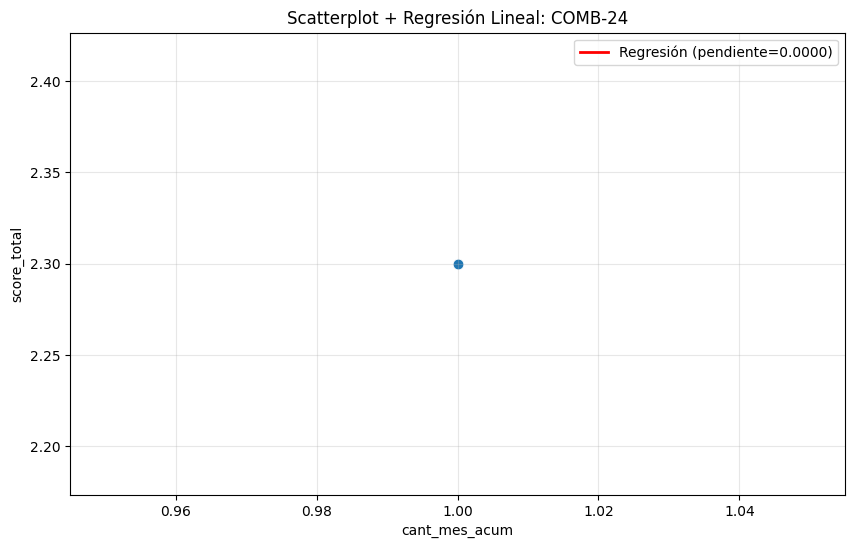


ALERTA: COMB-25



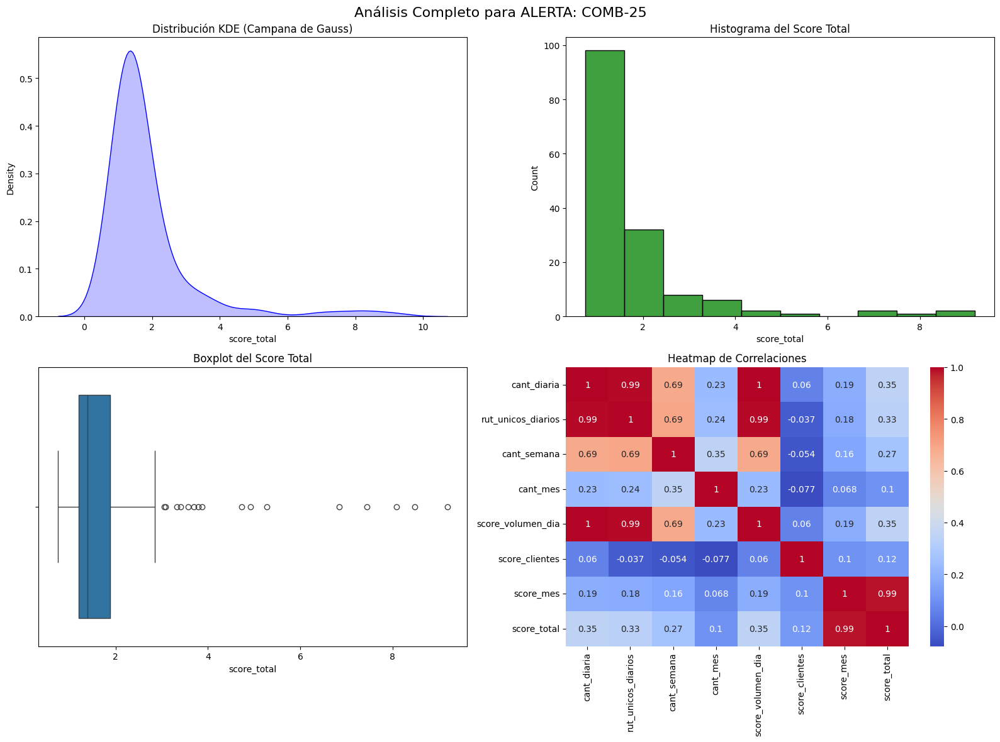

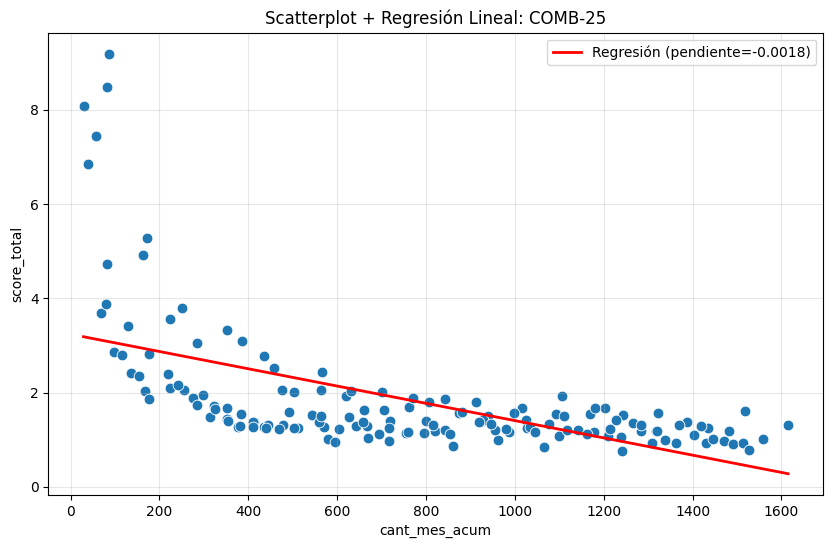


ALERTA: COMB-27



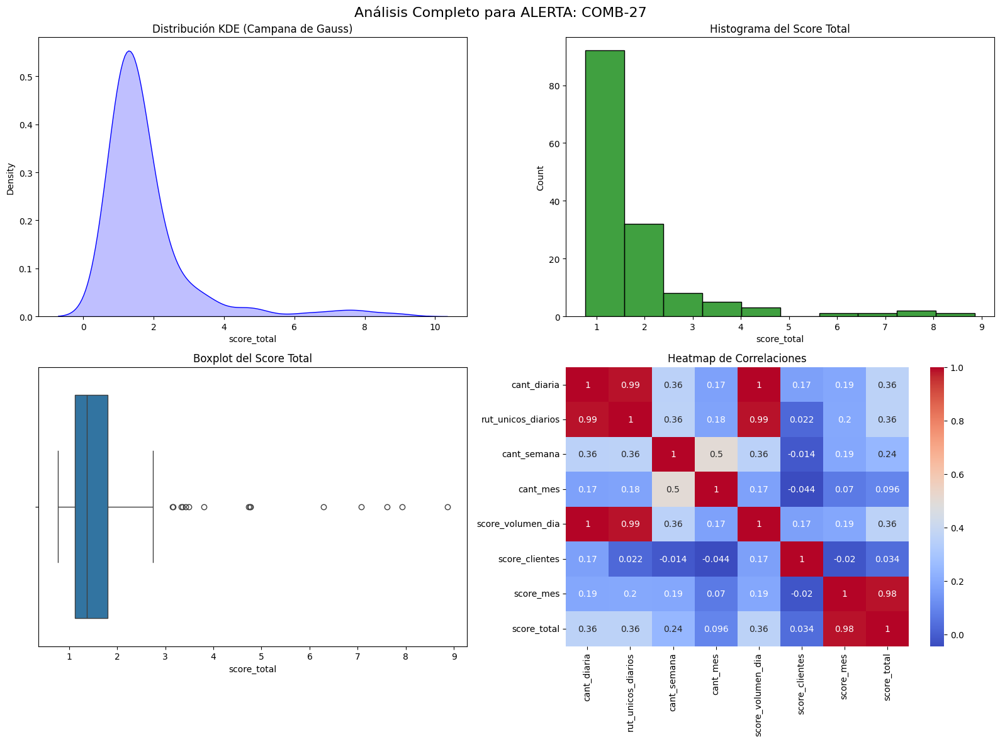

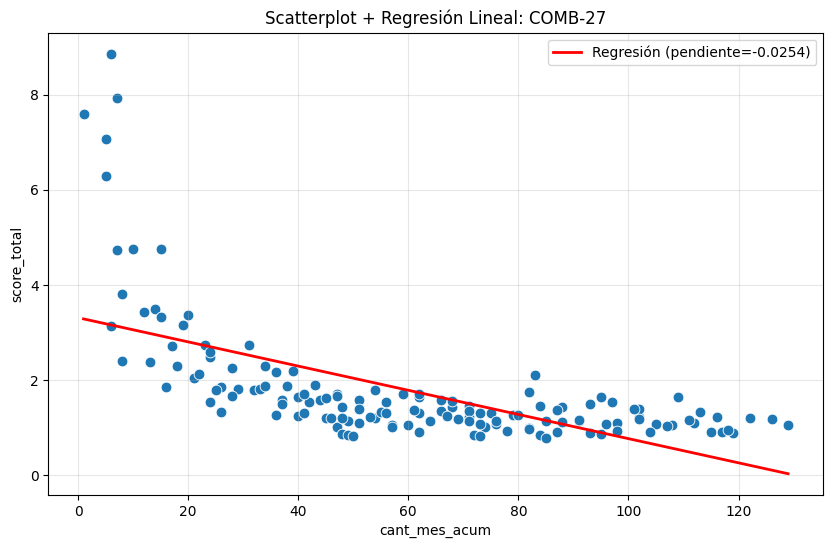


ALERTA: COMB-28



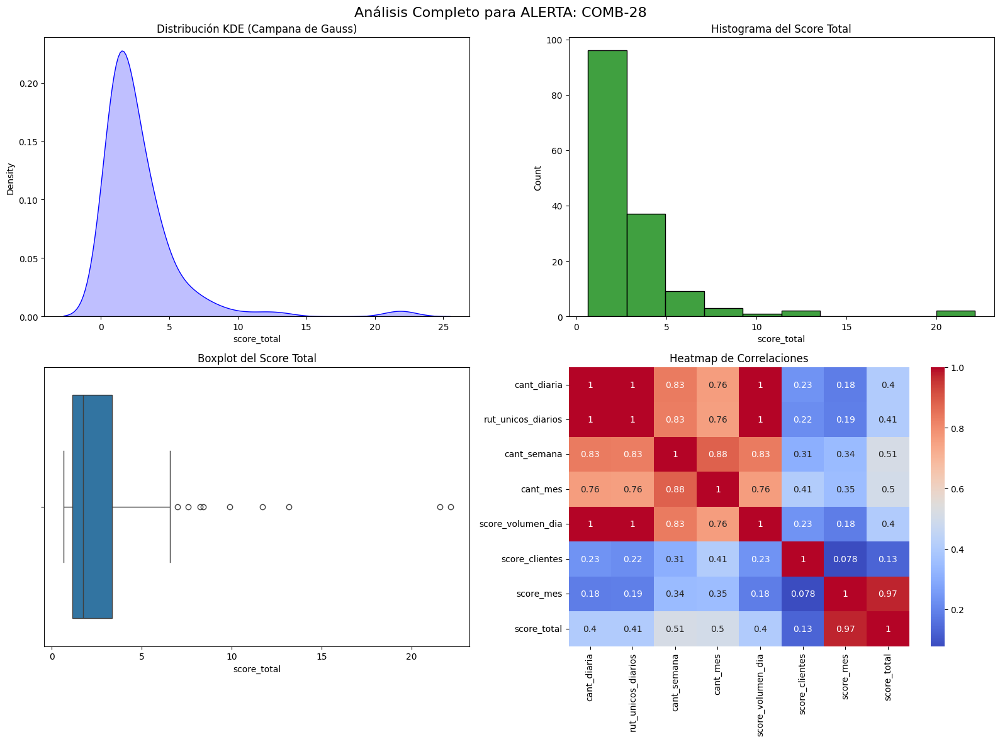

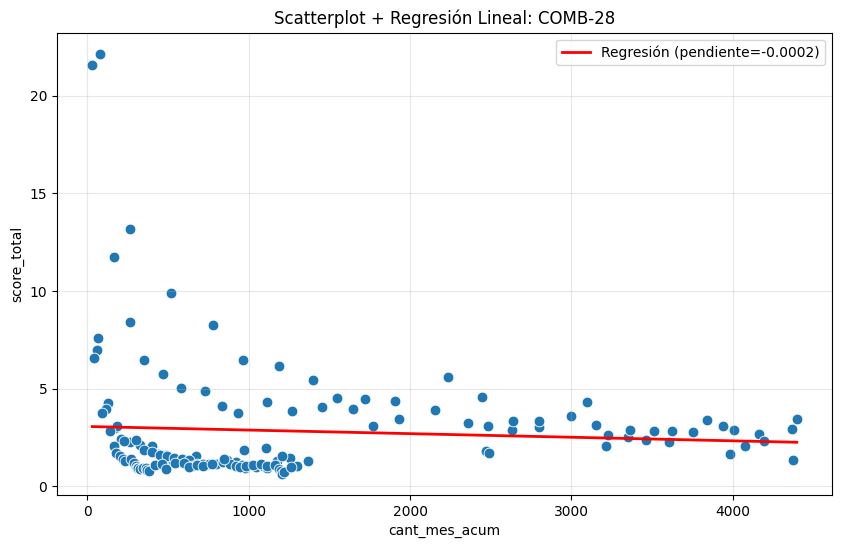


ALERTA: COMB-30



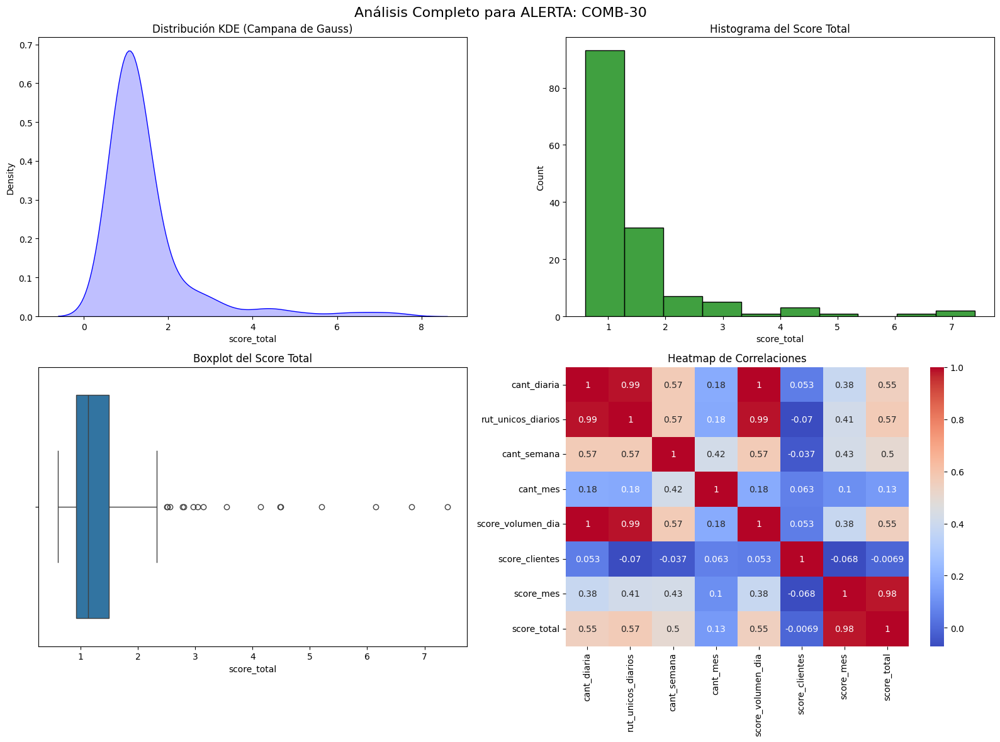

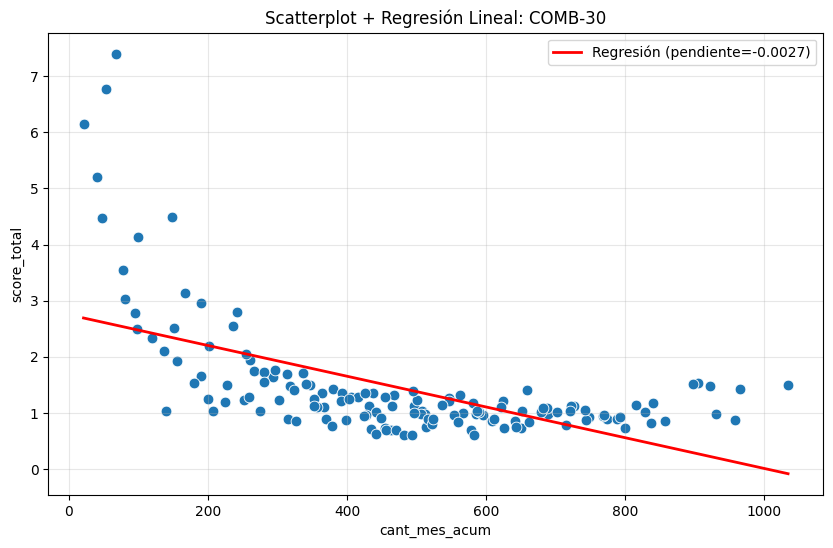


ALERTA: CV-8



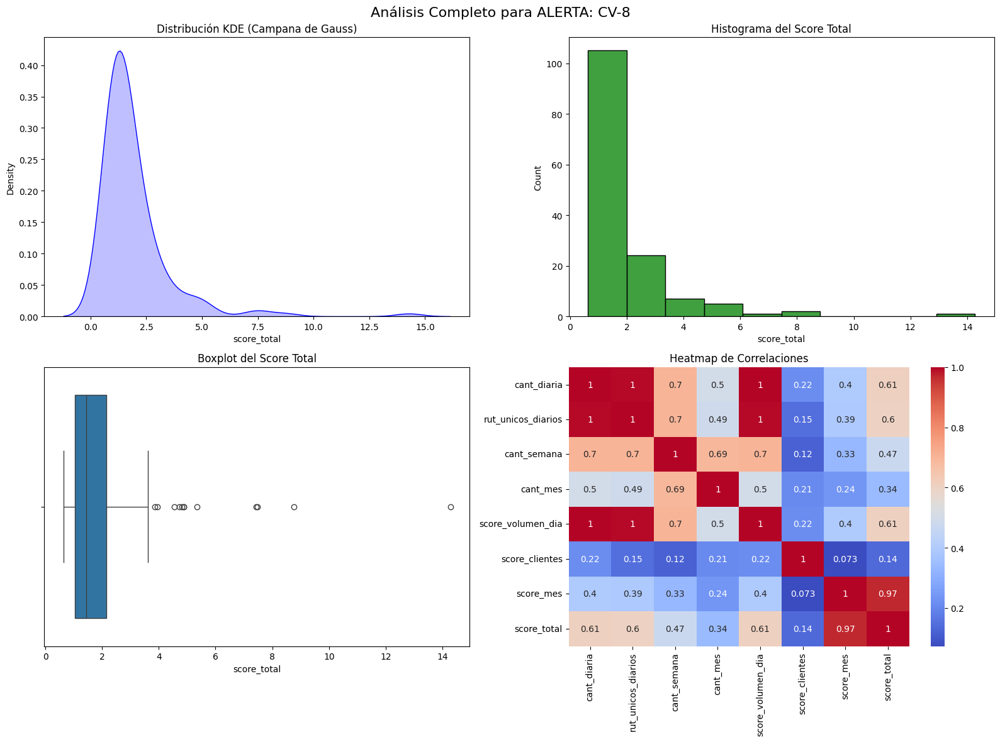

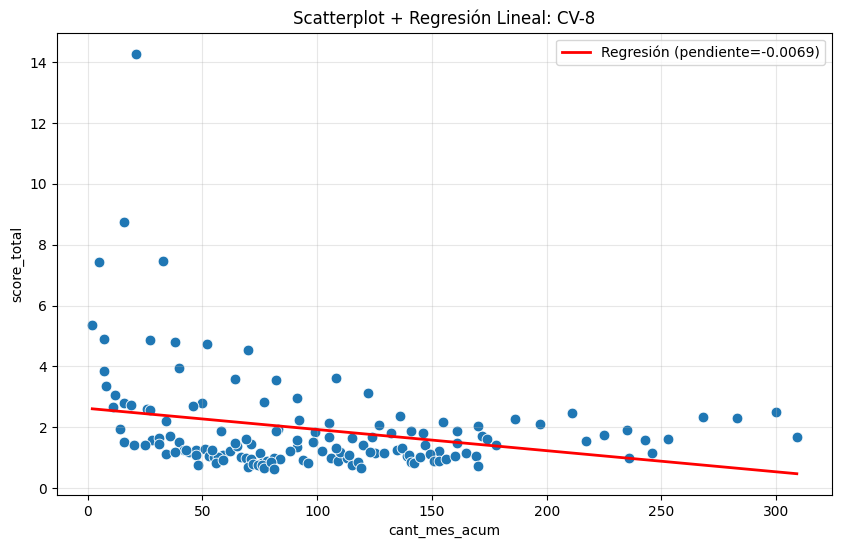


ALERTA: NWM-04



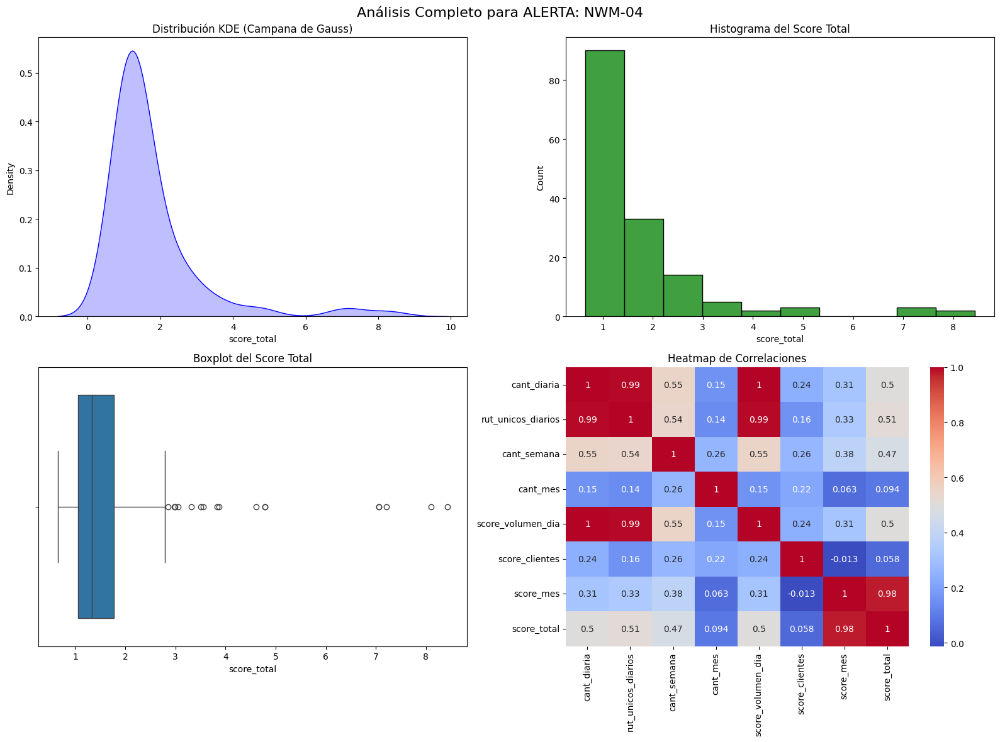

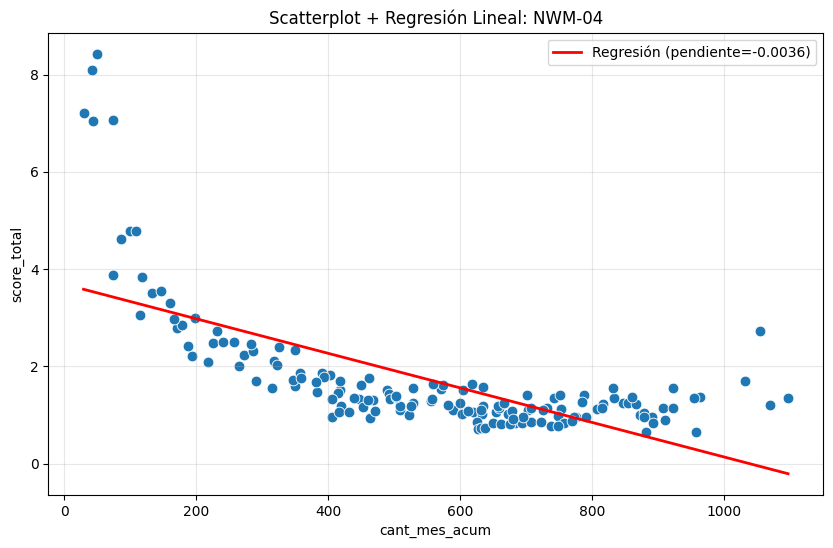


ALERTA: NWM-05



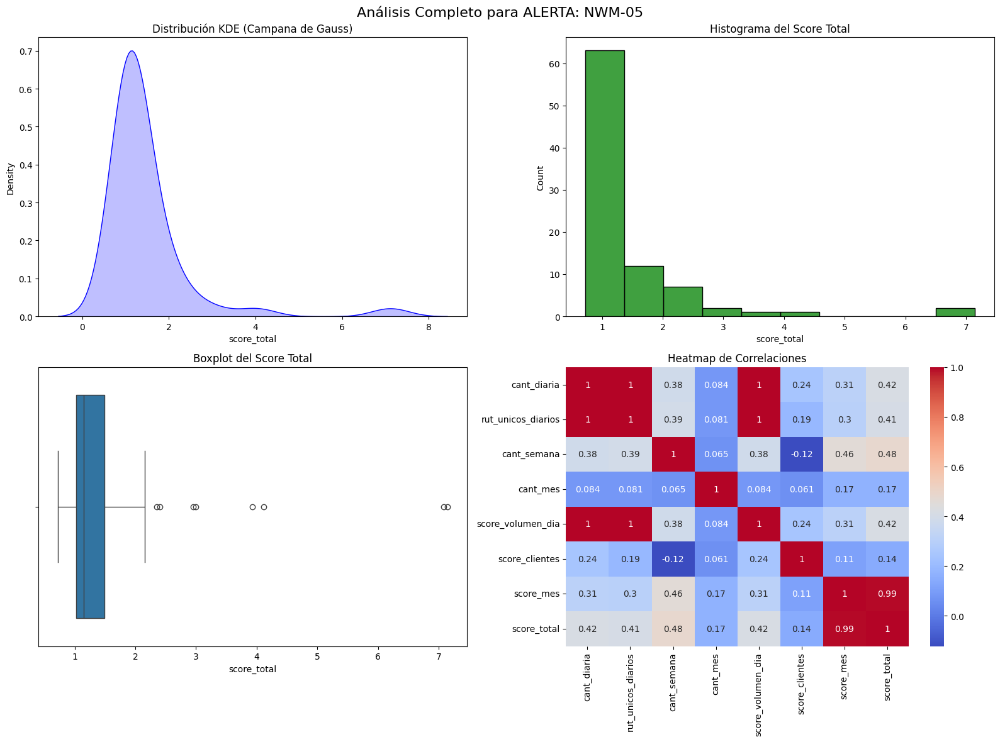

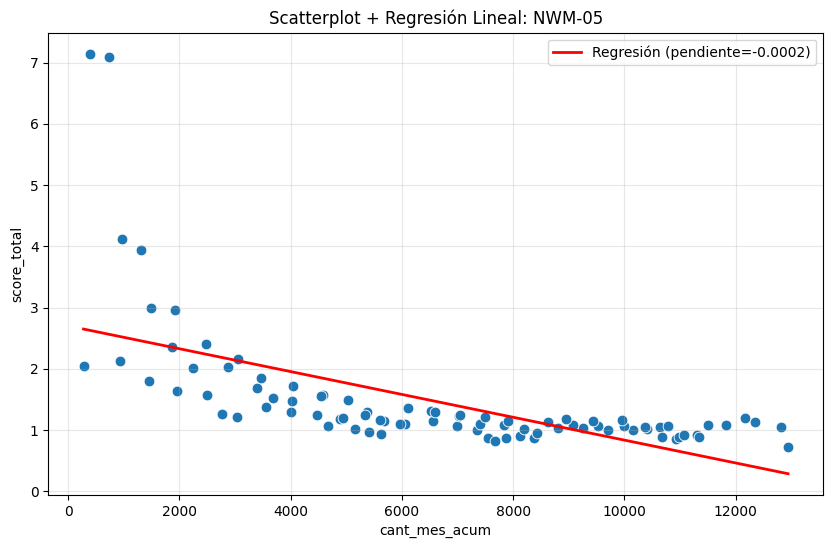


ALERTA: NWM-07



C:\Users\gonza\AppData\Local\Temp\ipykernel_15092\4156901888.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df_a["score_total"], fill=True, ax=axes[0,0], color="blue")
C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


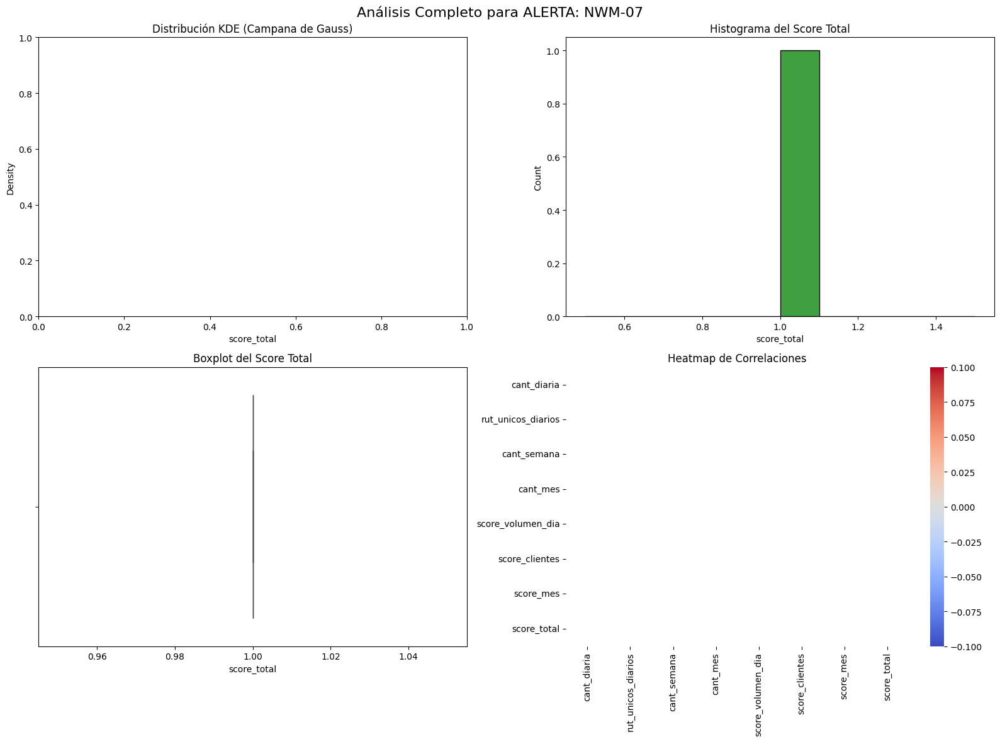

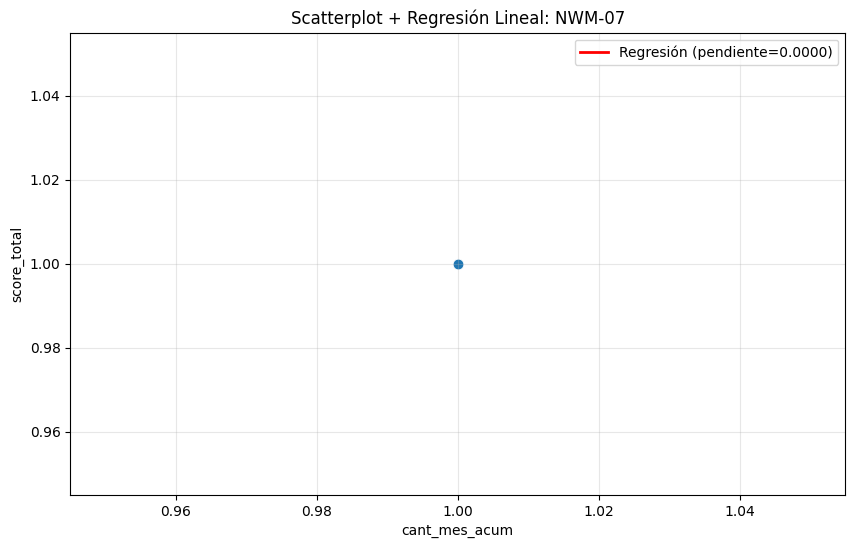


ALERTA: NWM-19



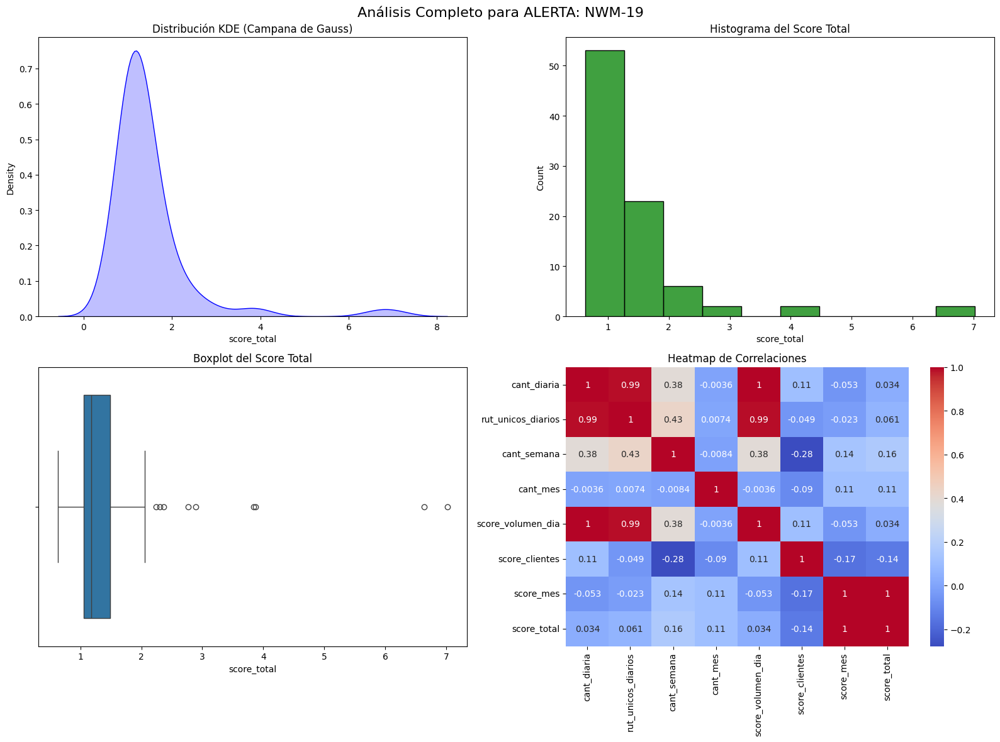

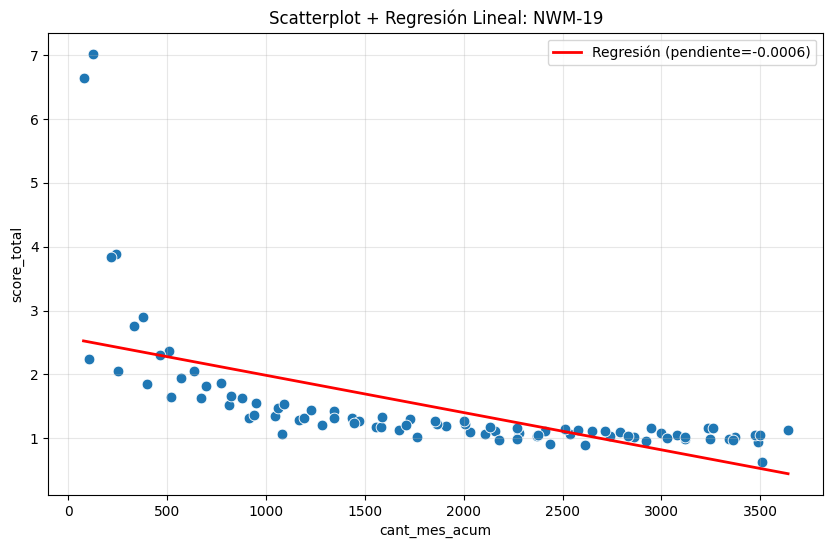


ALERTA: NWM-21



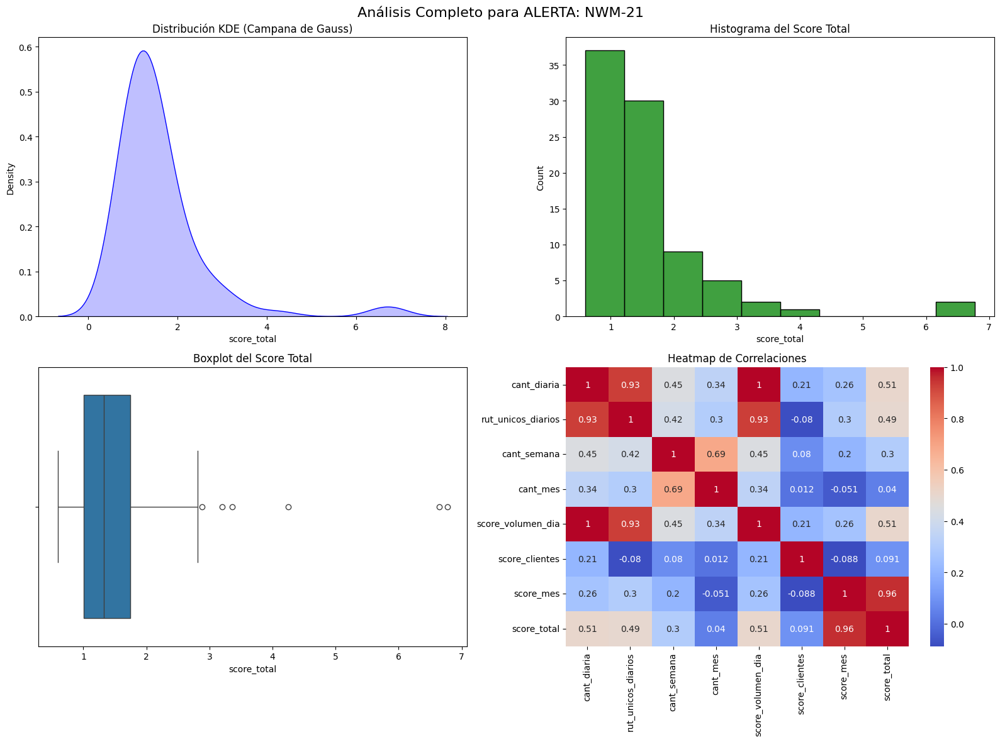

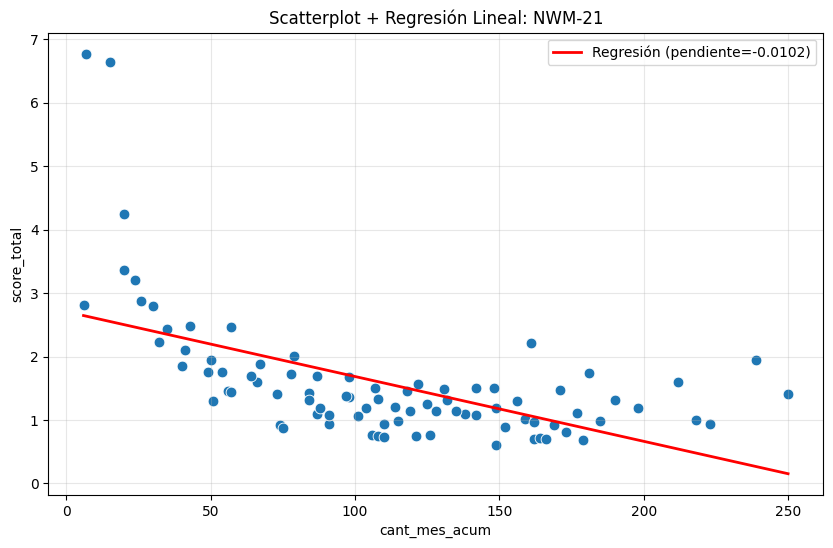


ALERTA: NWM-22



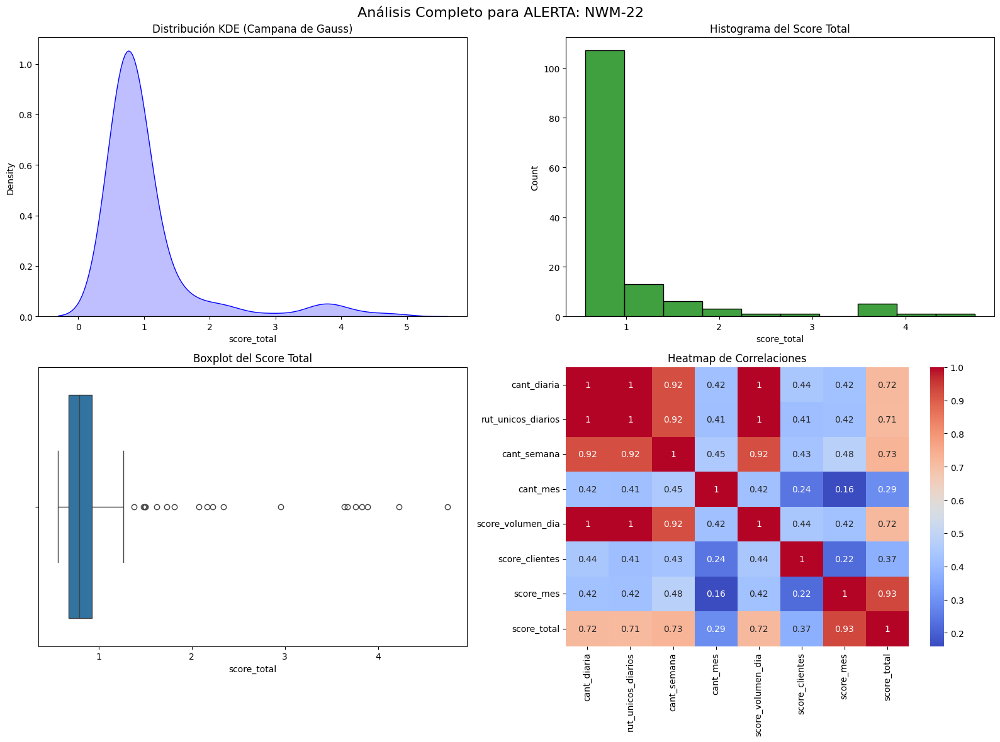

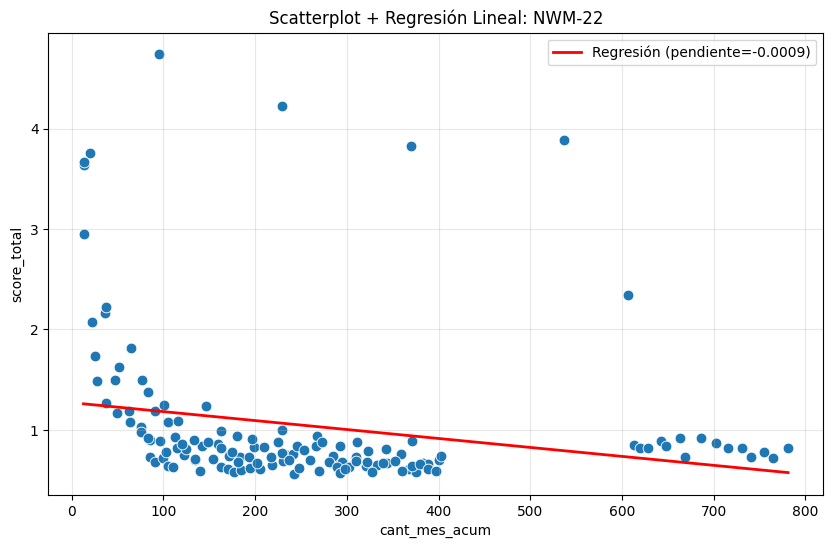


ALERTA: NWM-24



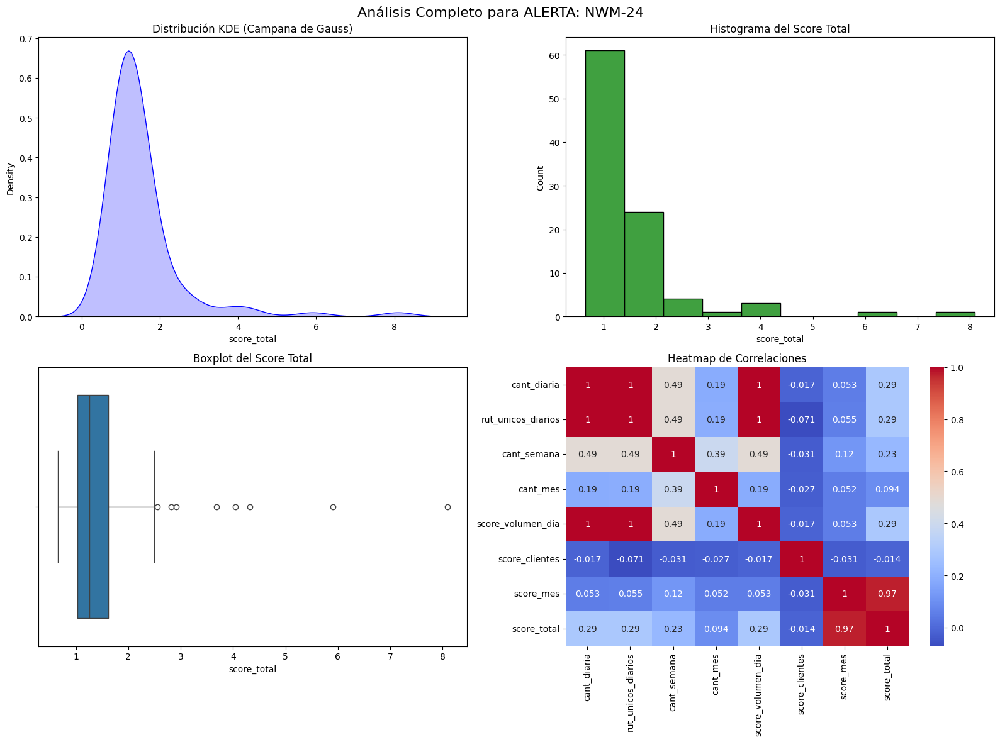

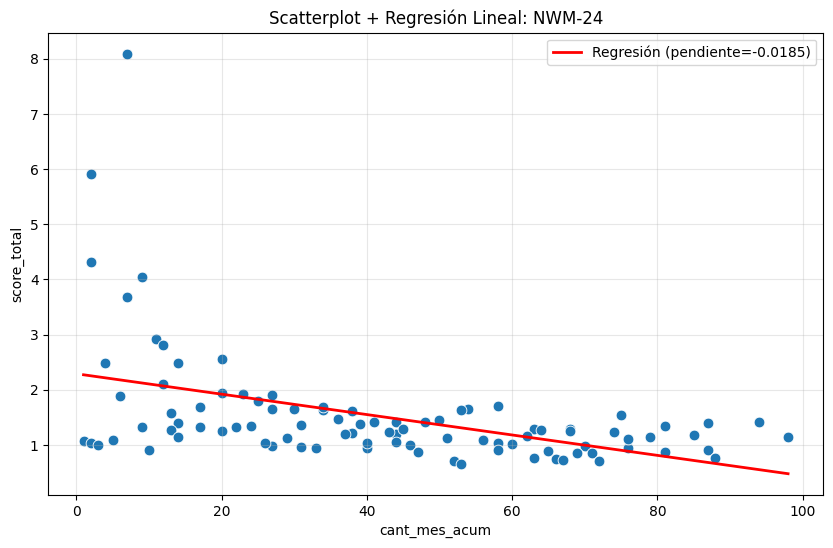


ALERTA: NWM-26



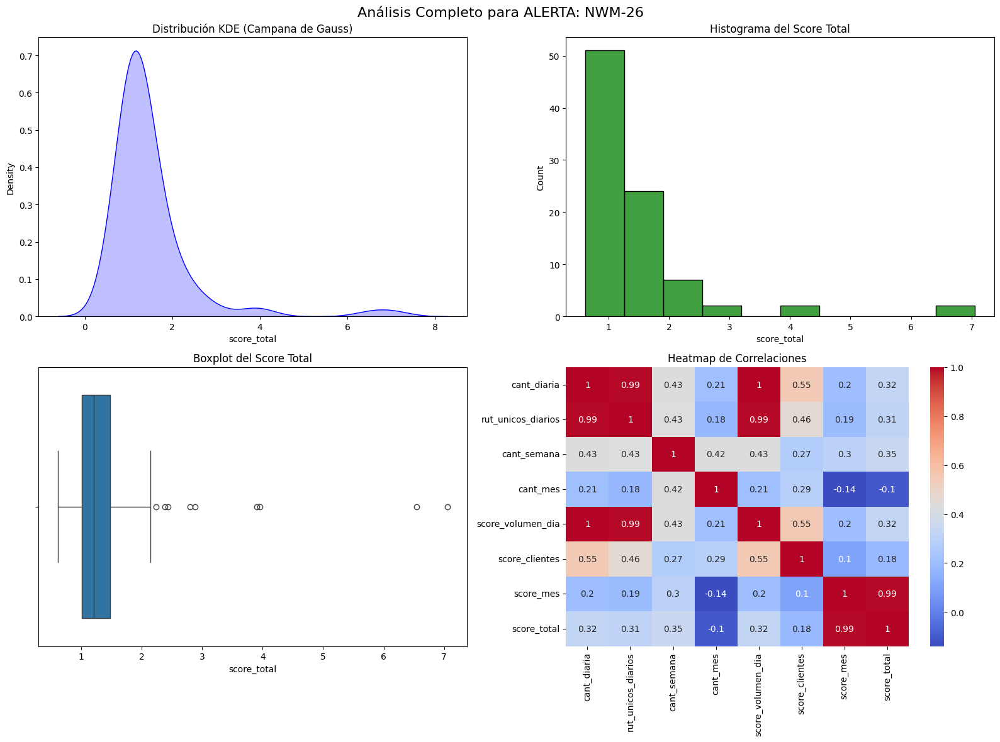

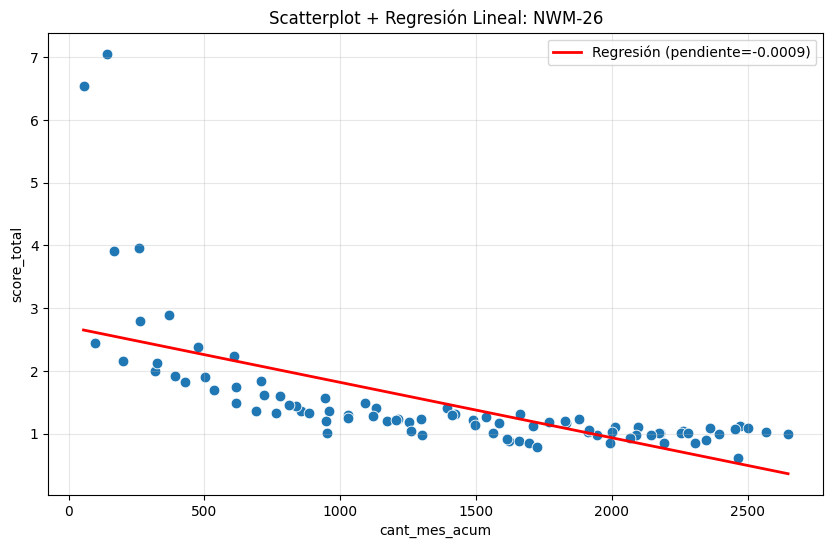


ALERTA: NWM-28



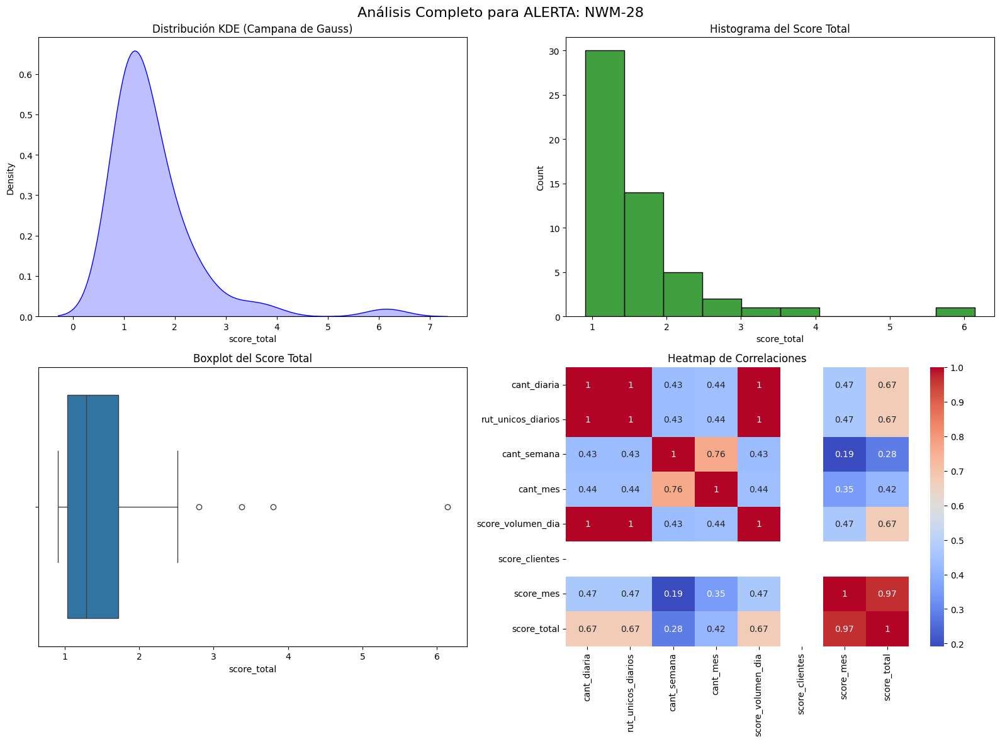

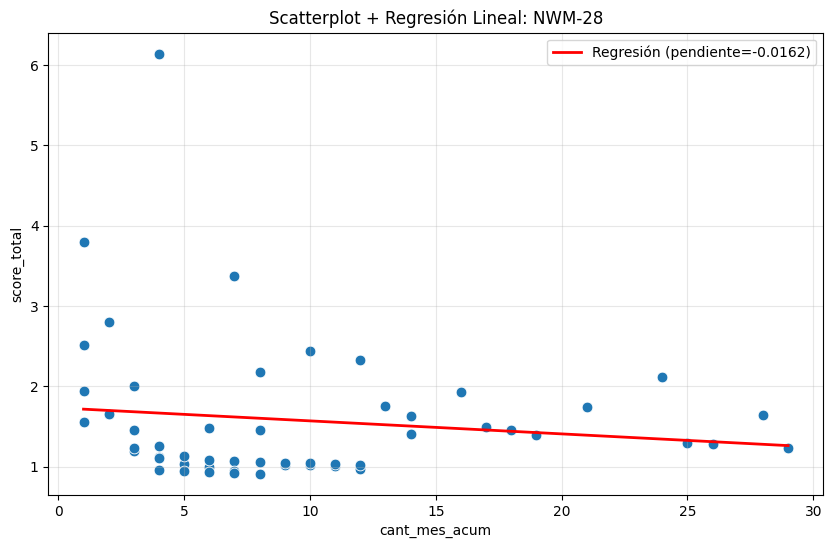


ALERTA: NWM-30



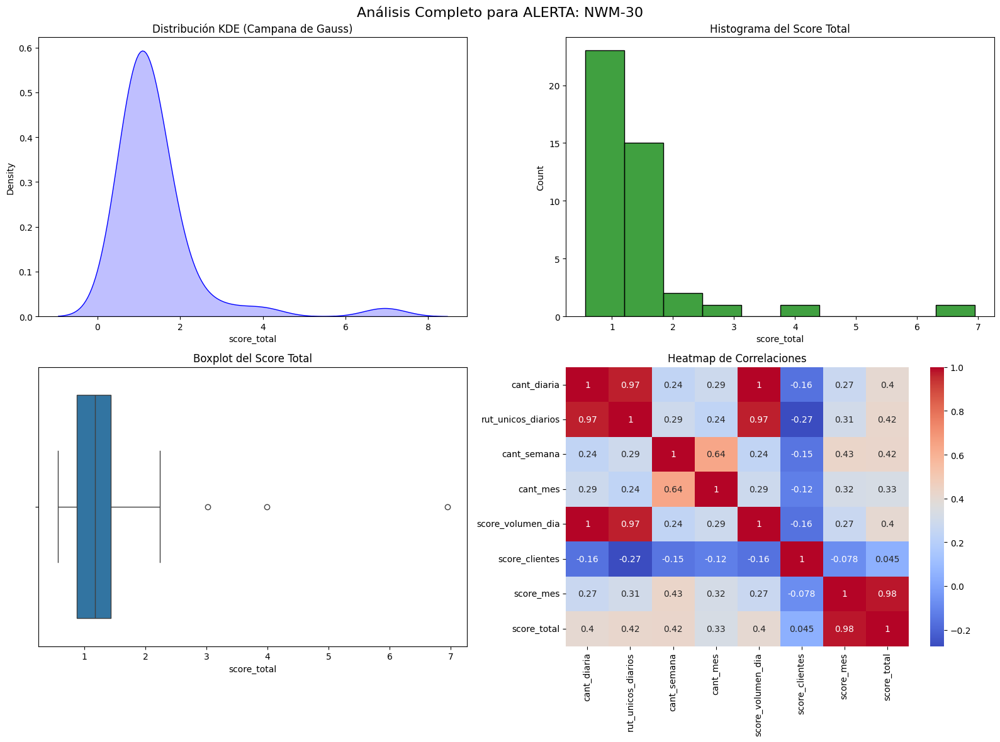

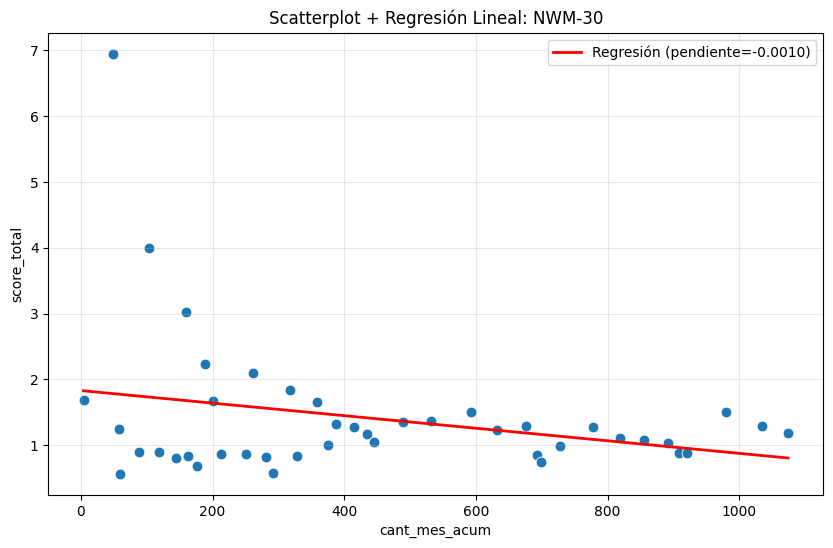


ALERTA: NWM-31



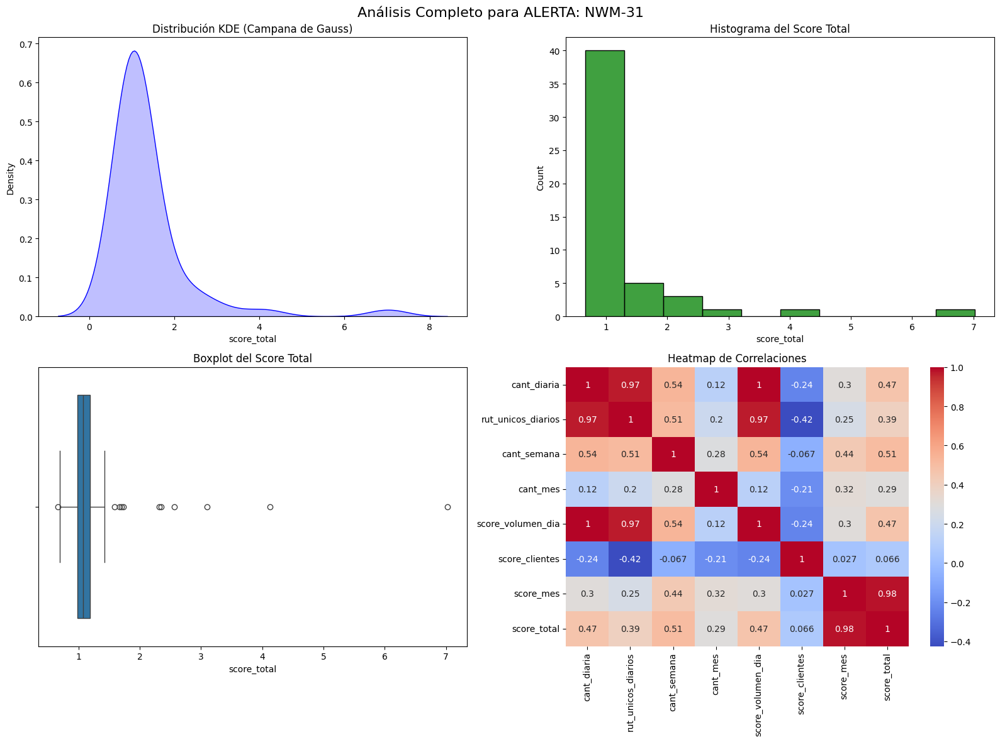

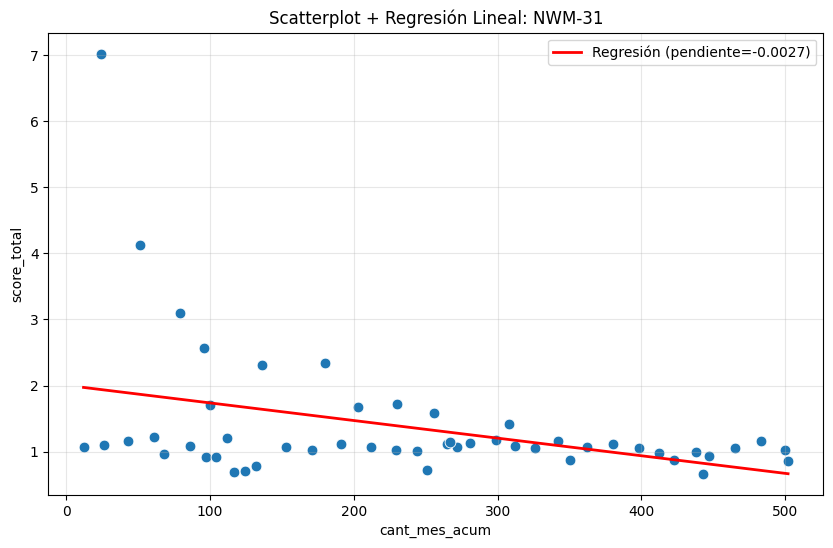


ALERTA: NWM-32



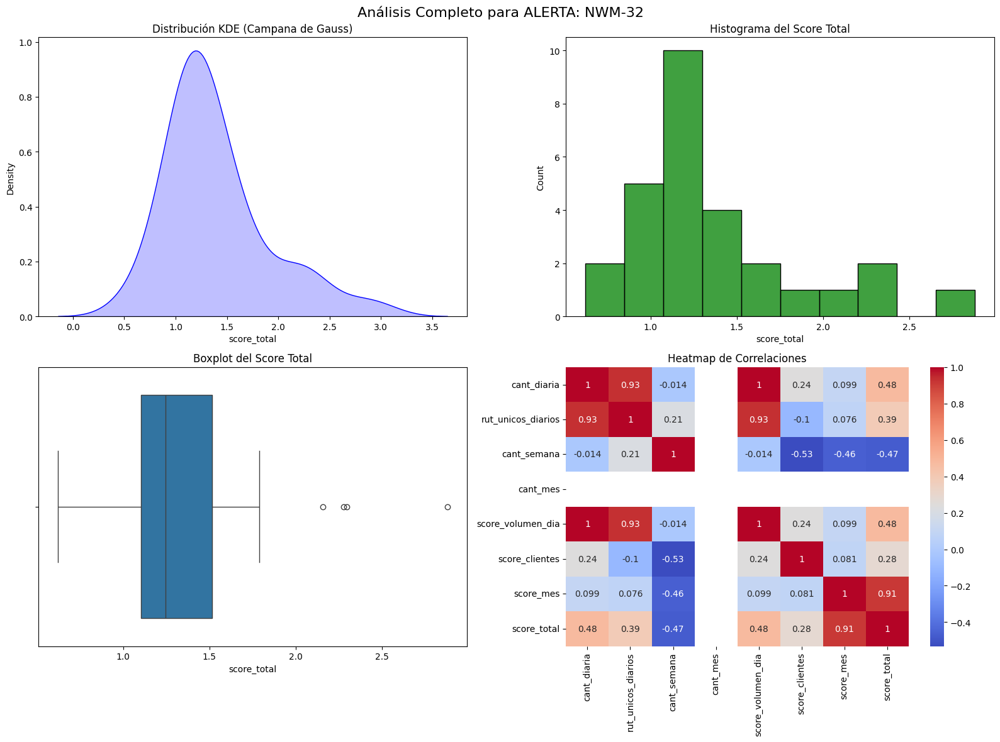

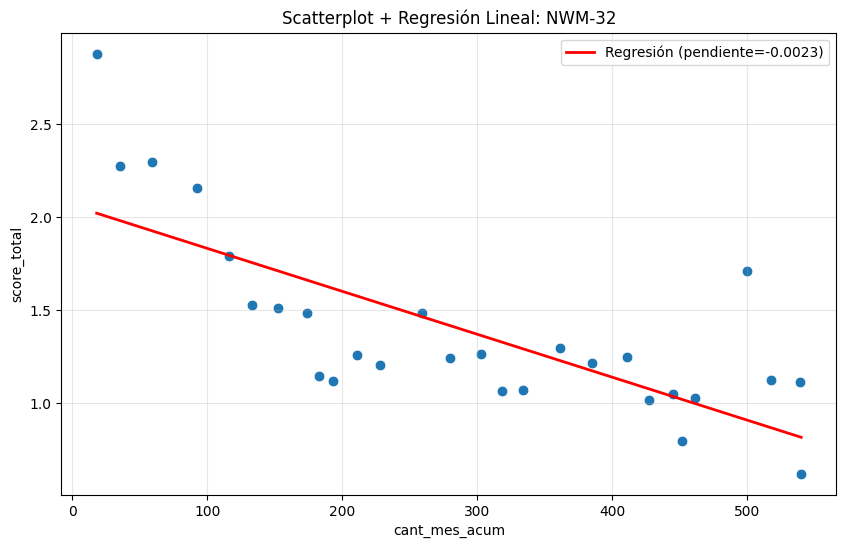


ALERTA: OS_WEBPAY_AFEX



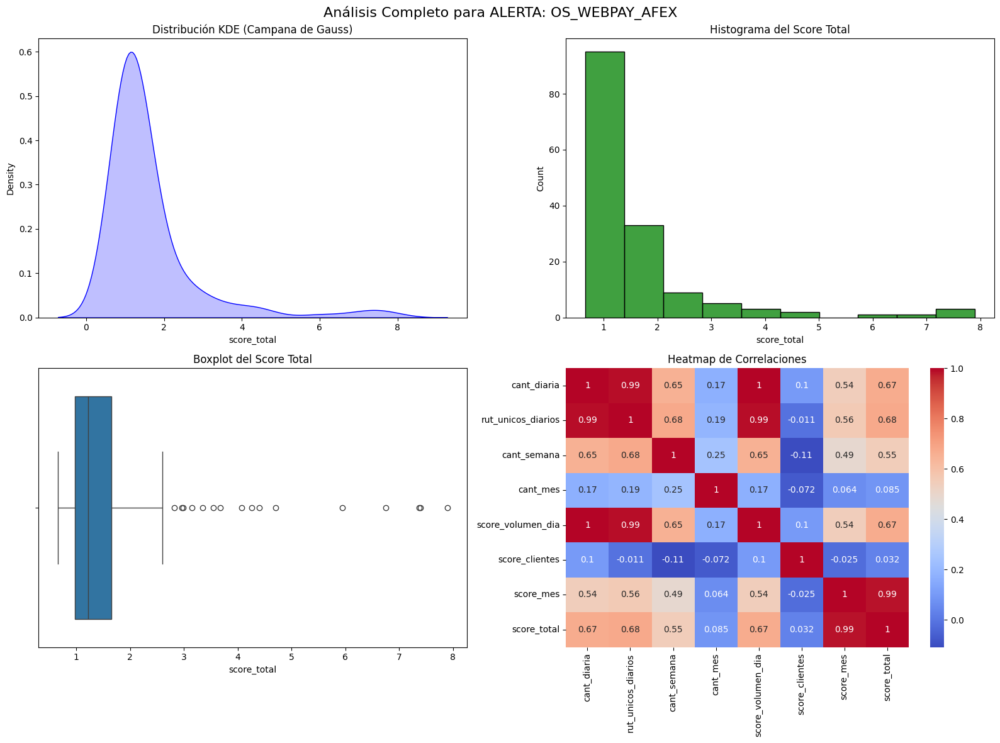

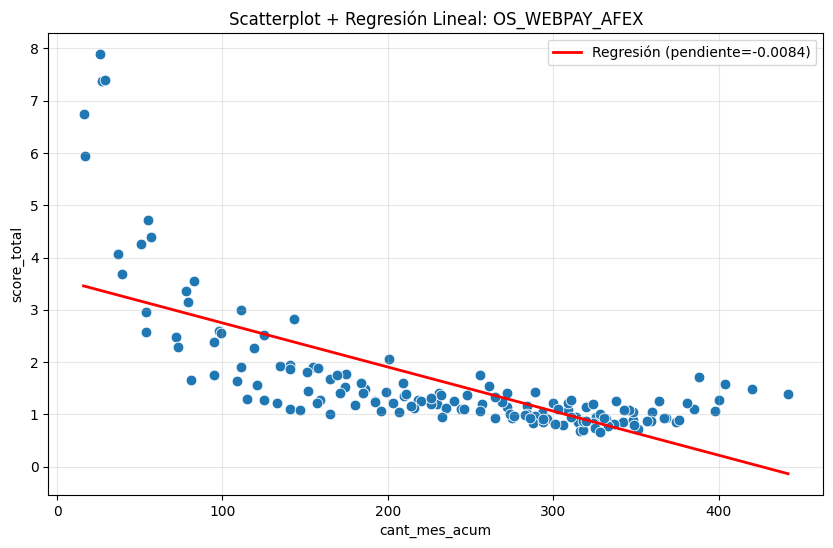


ALERTA: OS_WEBPAY_ALPS_Y_NUVEI



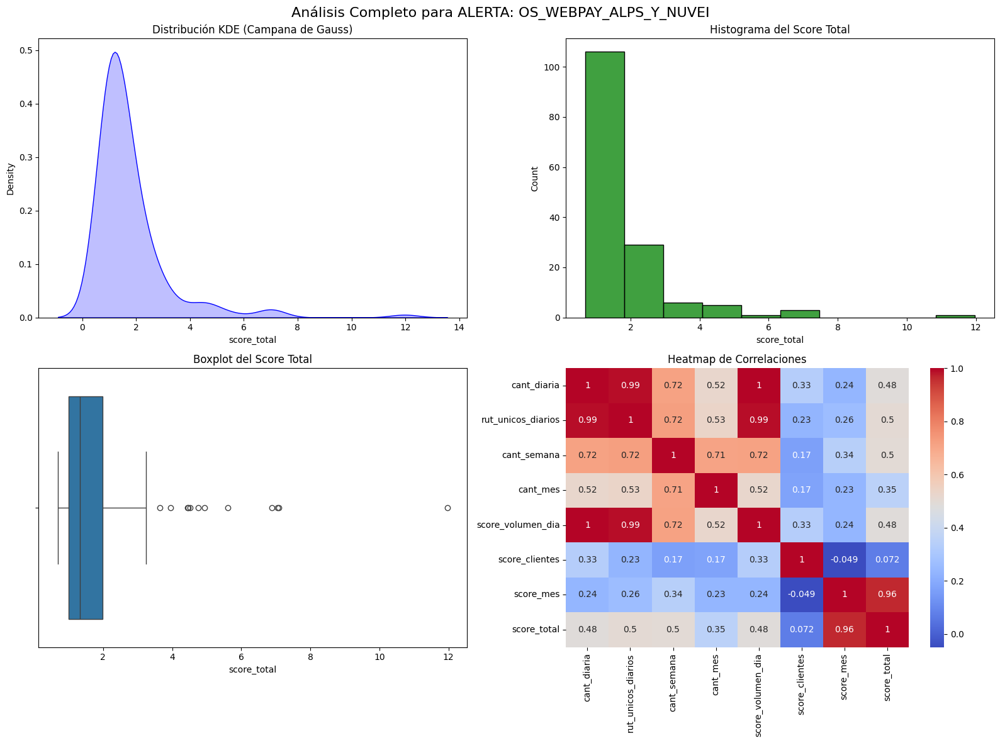

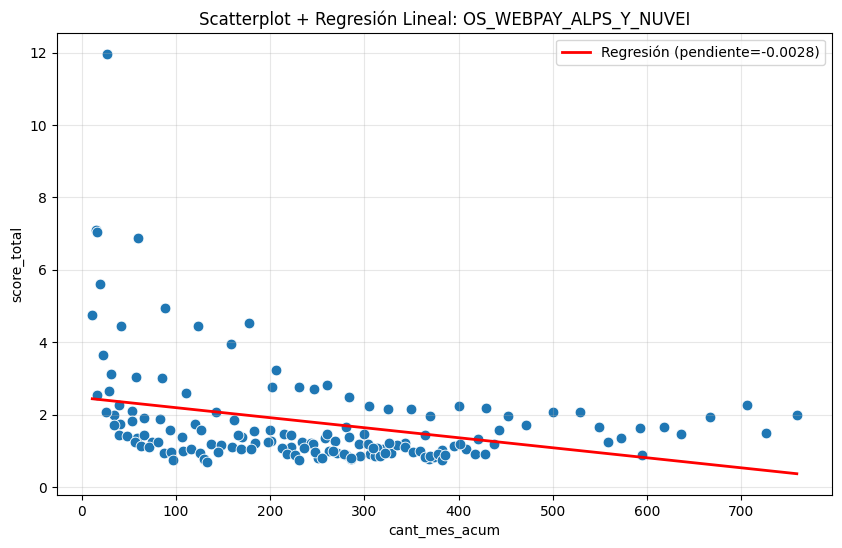


ALERTA: OS_WEBPAY_HITES



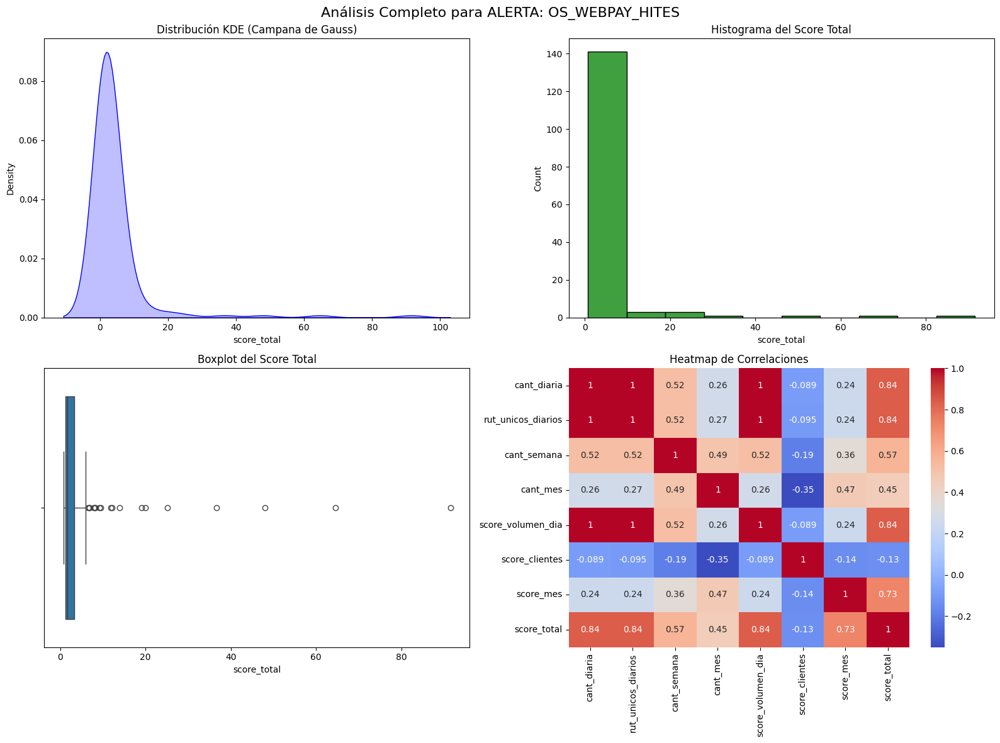

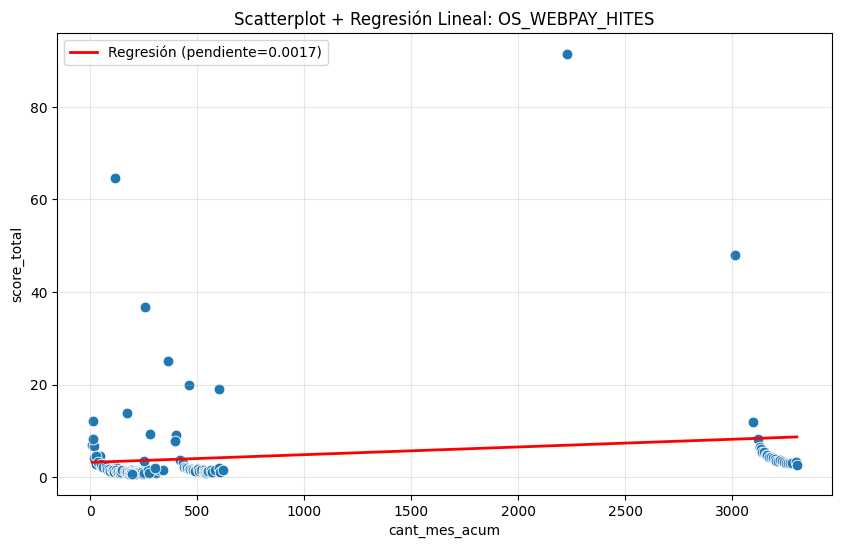


ALERTA: OS_WEBPAY_PRONTO_PAGA



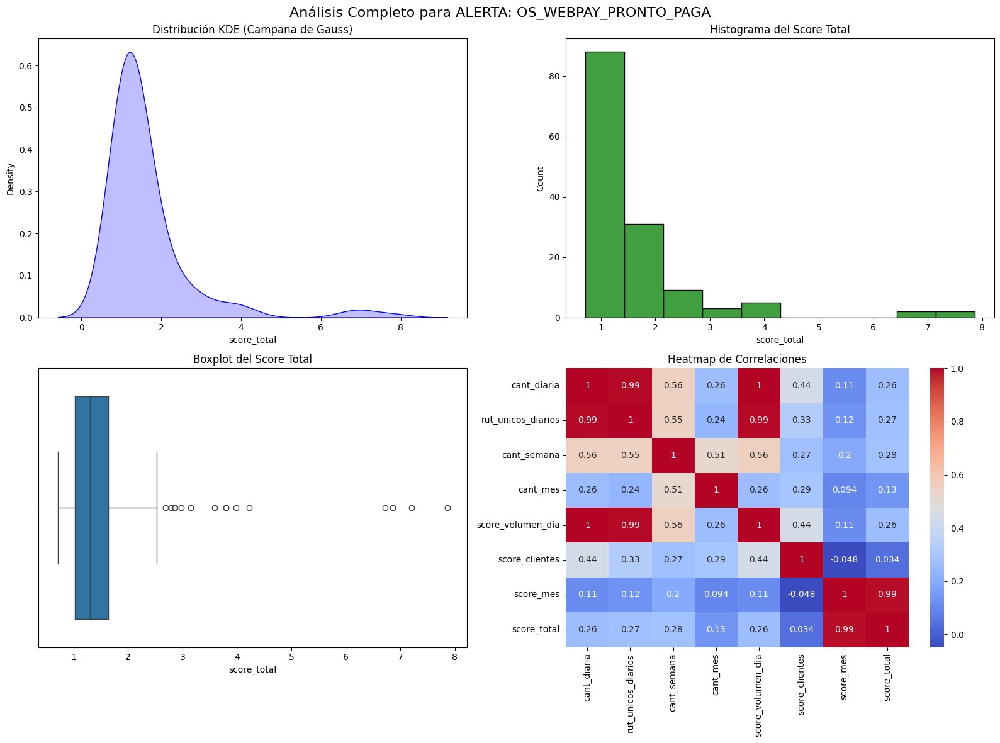

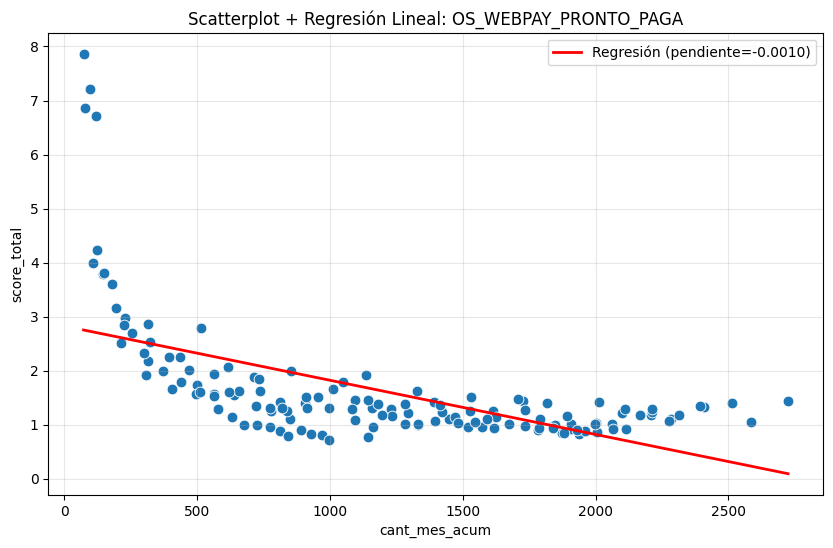


ALERTA: OS_WEBPAY_WEB_LIDER_ONE_CLICK



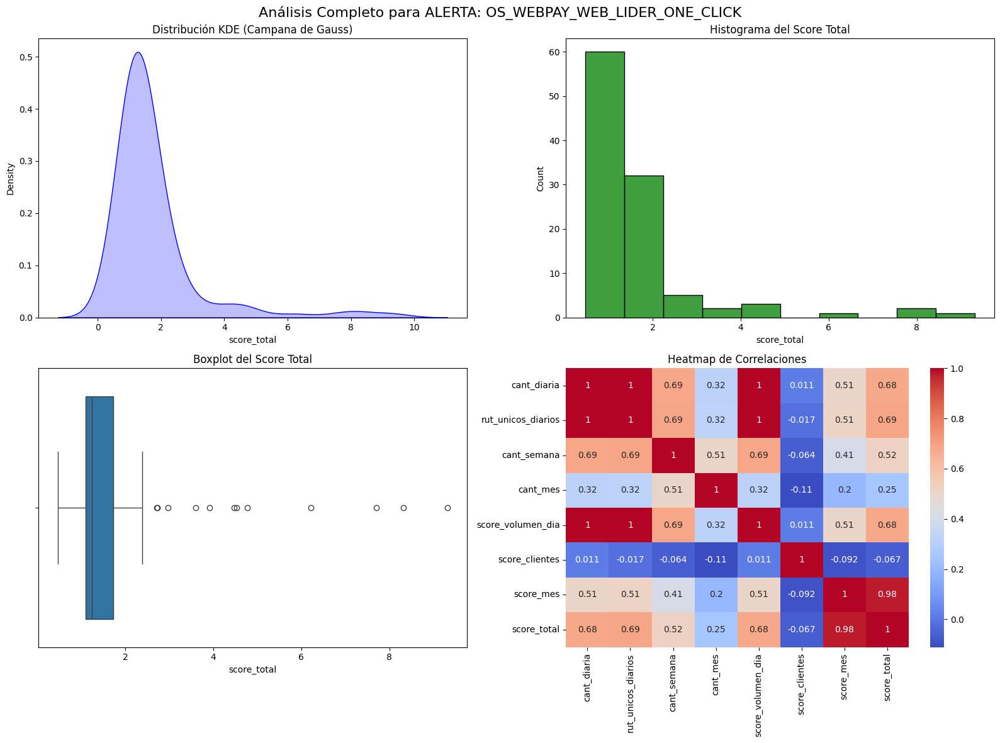

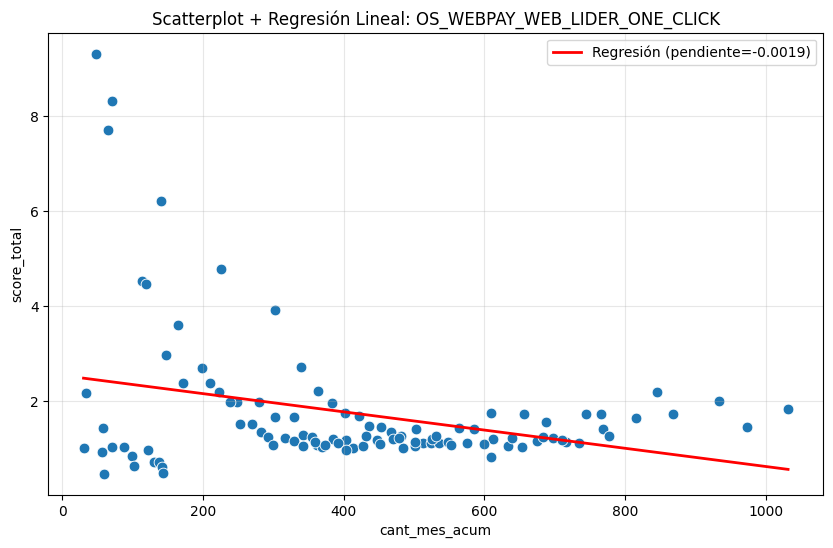


ALERTA: OS_WEBPAY_WEB_PAGADOOR



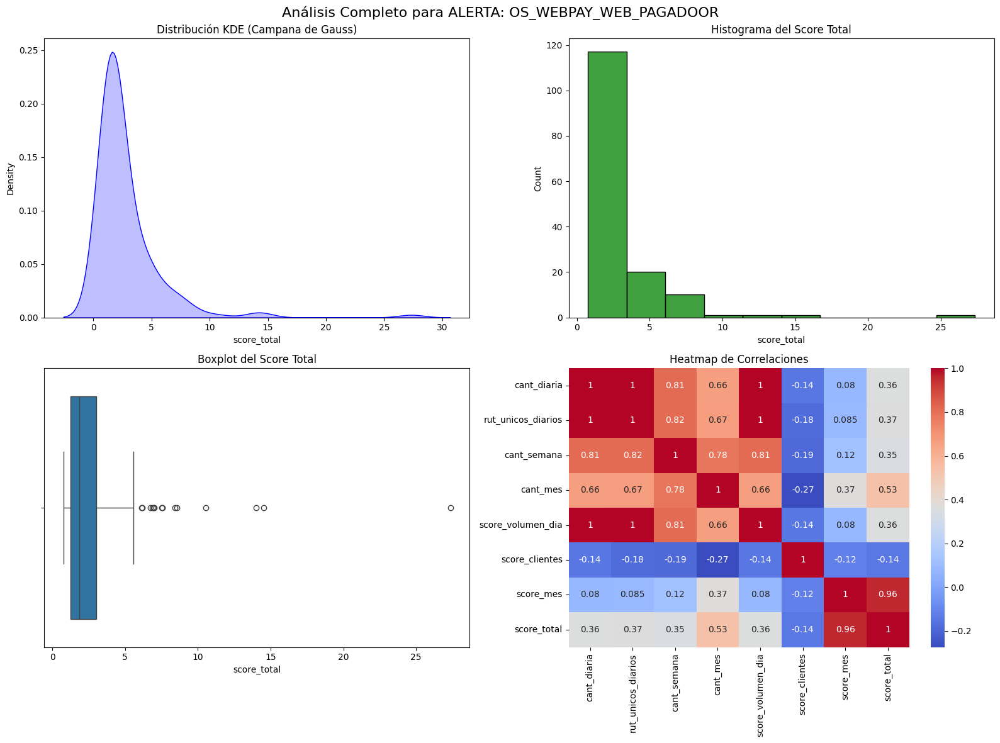

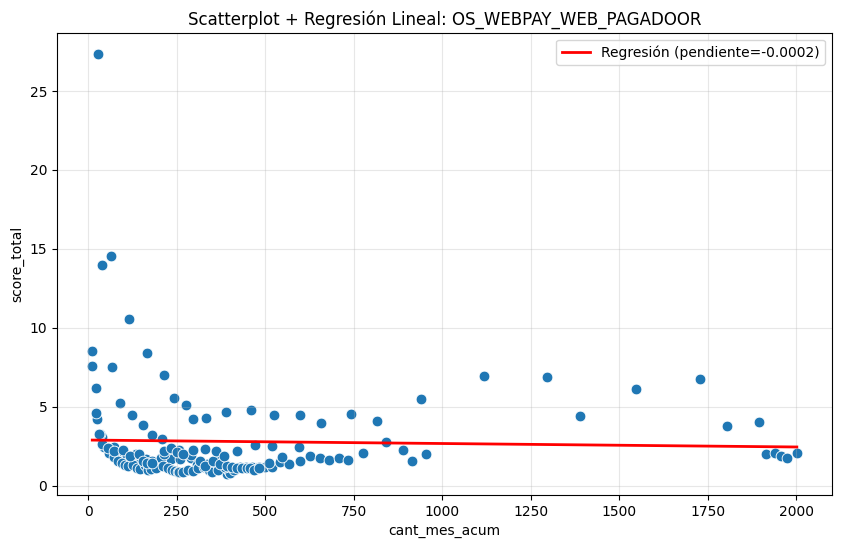


ALERTA: OS_WEB_PK_COMERCIOS_EN_LINEA



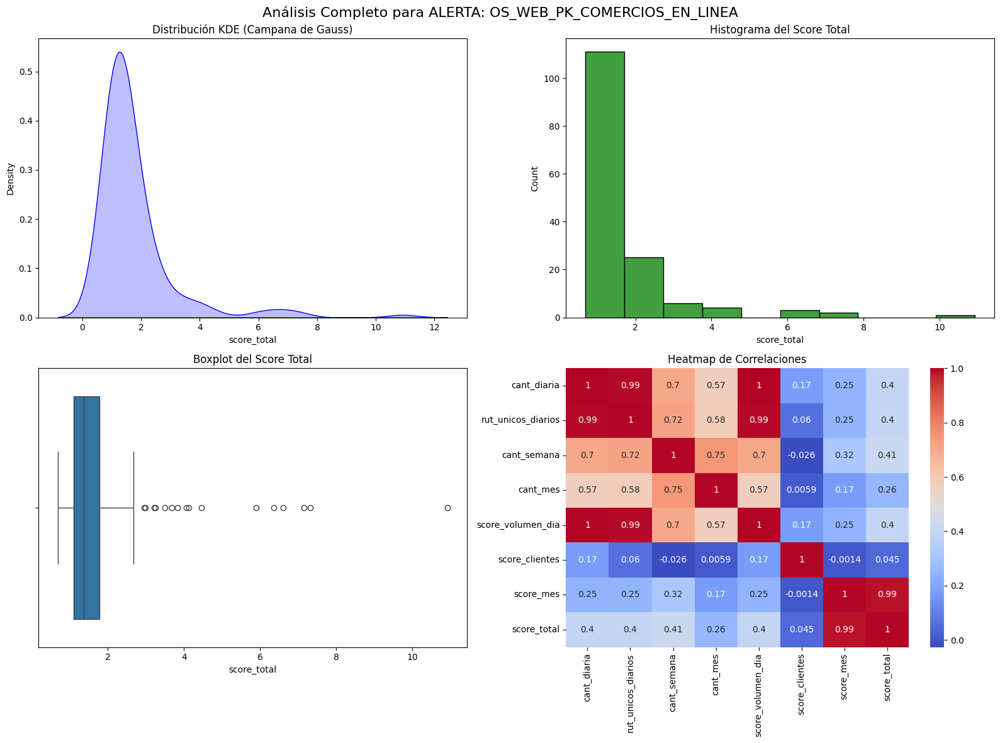

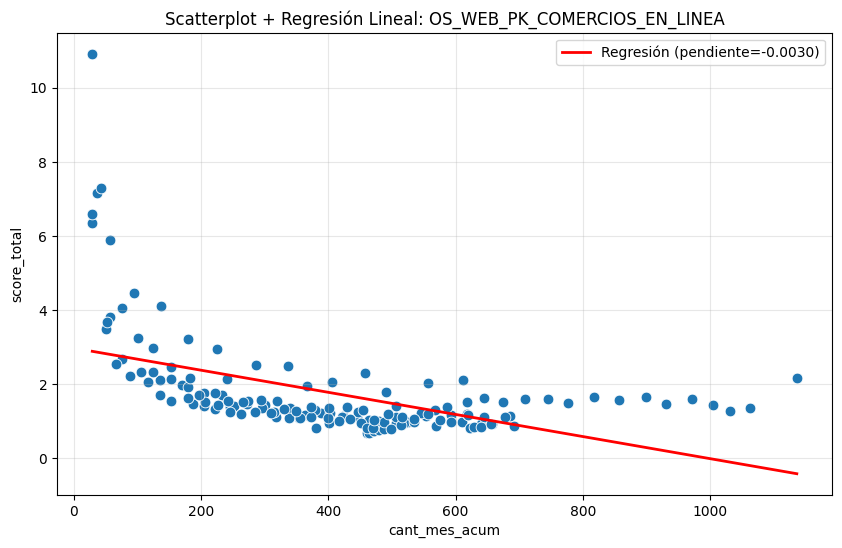


ALERTA: SUC-02



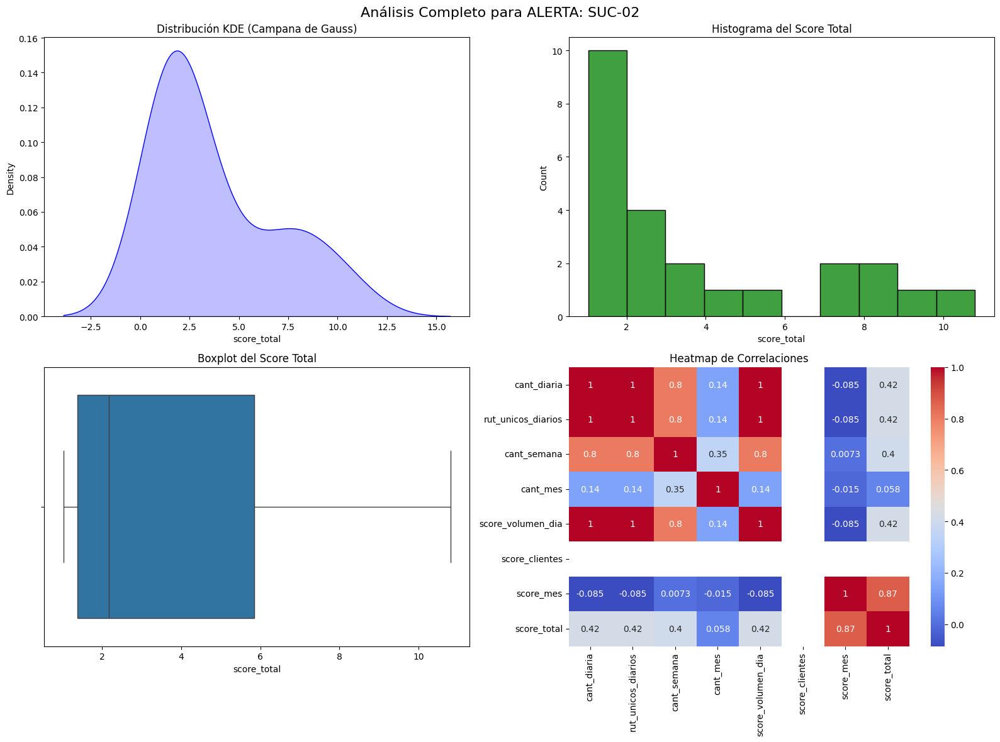

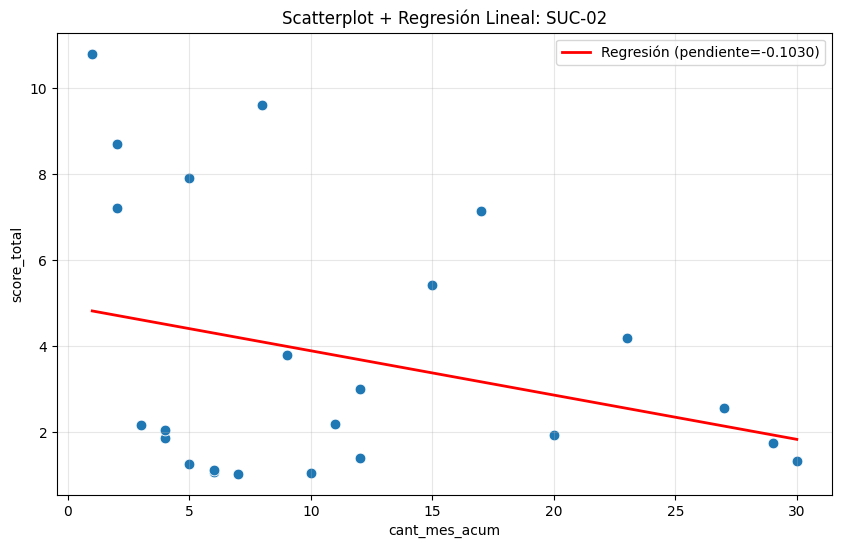


ALERTA: SUC-03



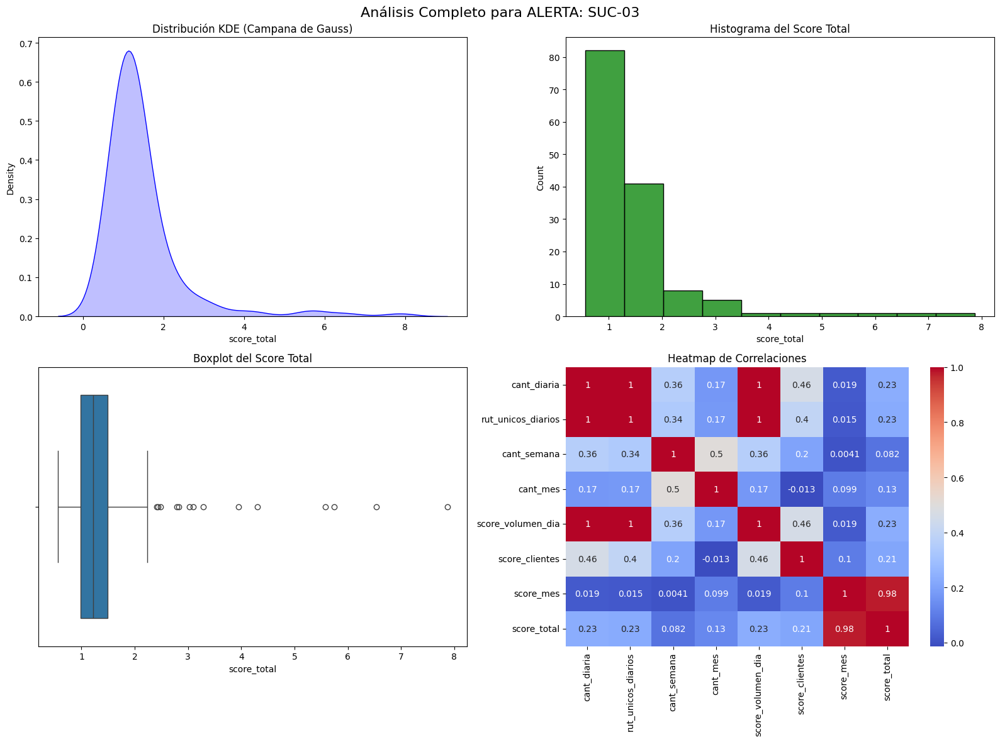

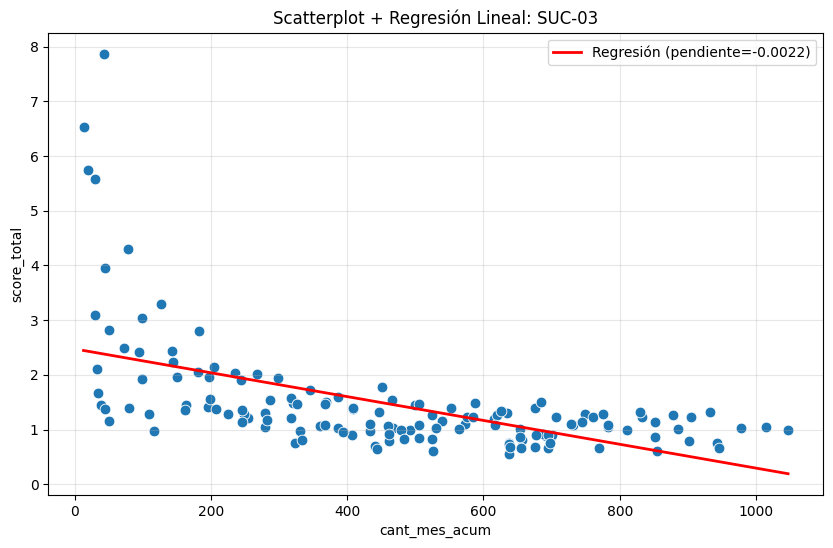


ALERTA: SUC-04



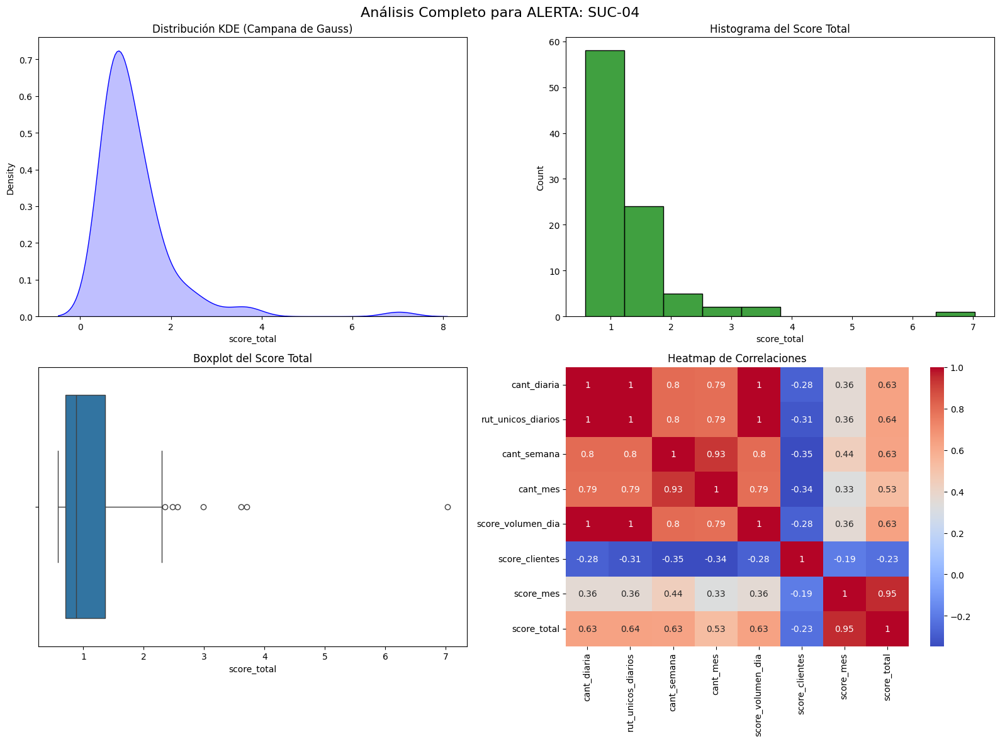

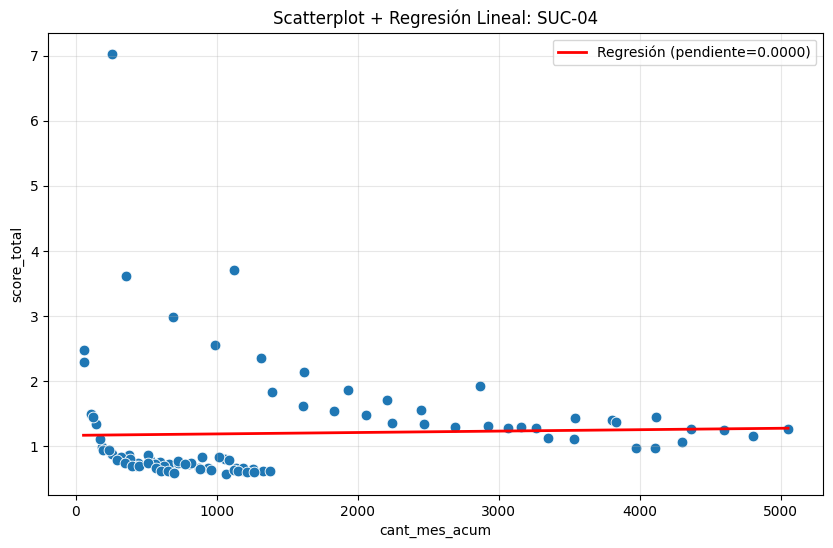


ALERTA: WEB-06



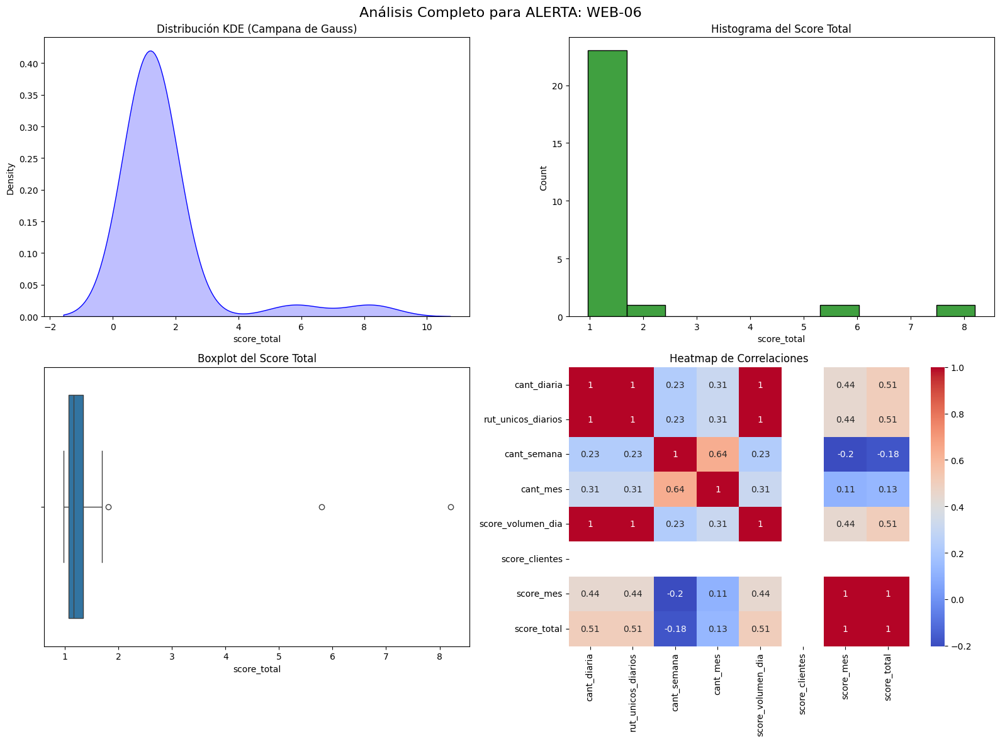

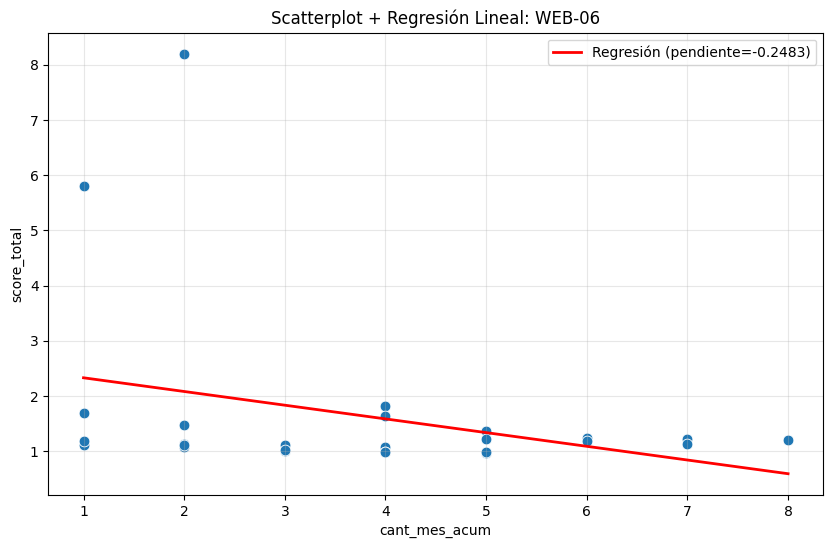


ALERTA: WEB-12



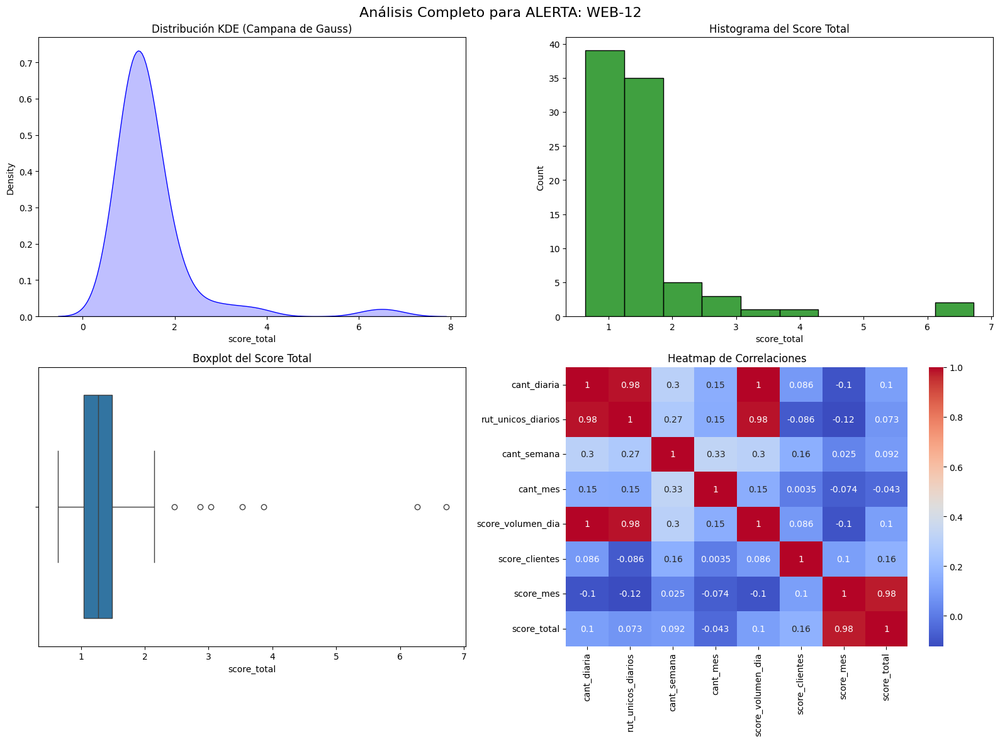

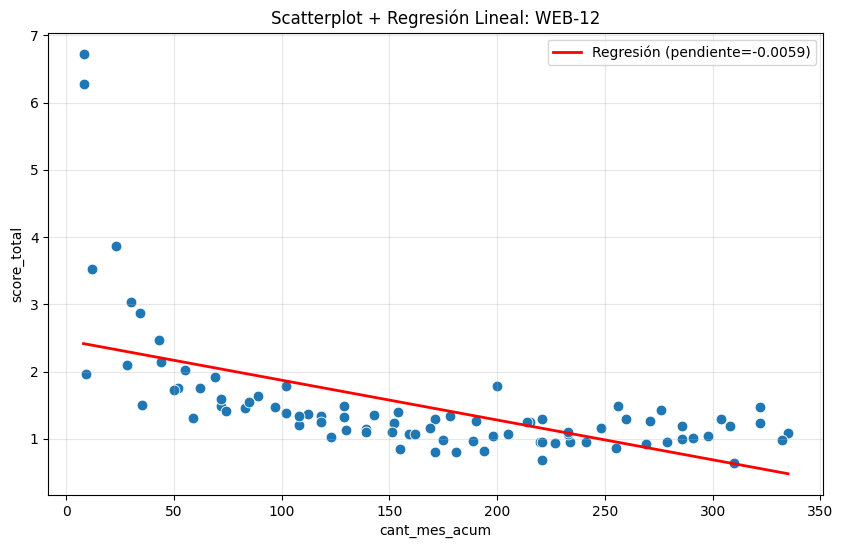


ALERTA: WEB-13



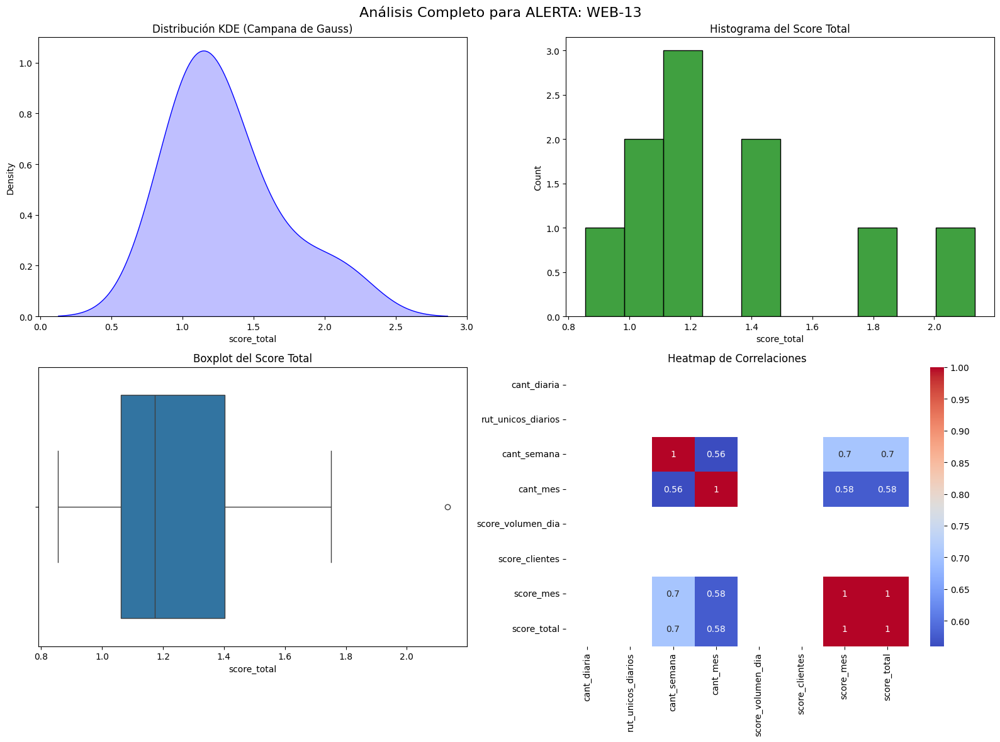

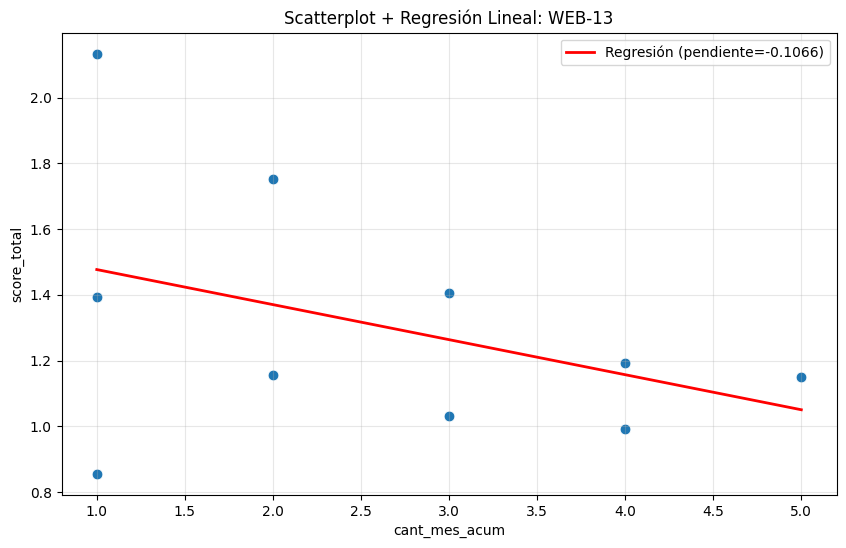


ALERTA: WEB-17



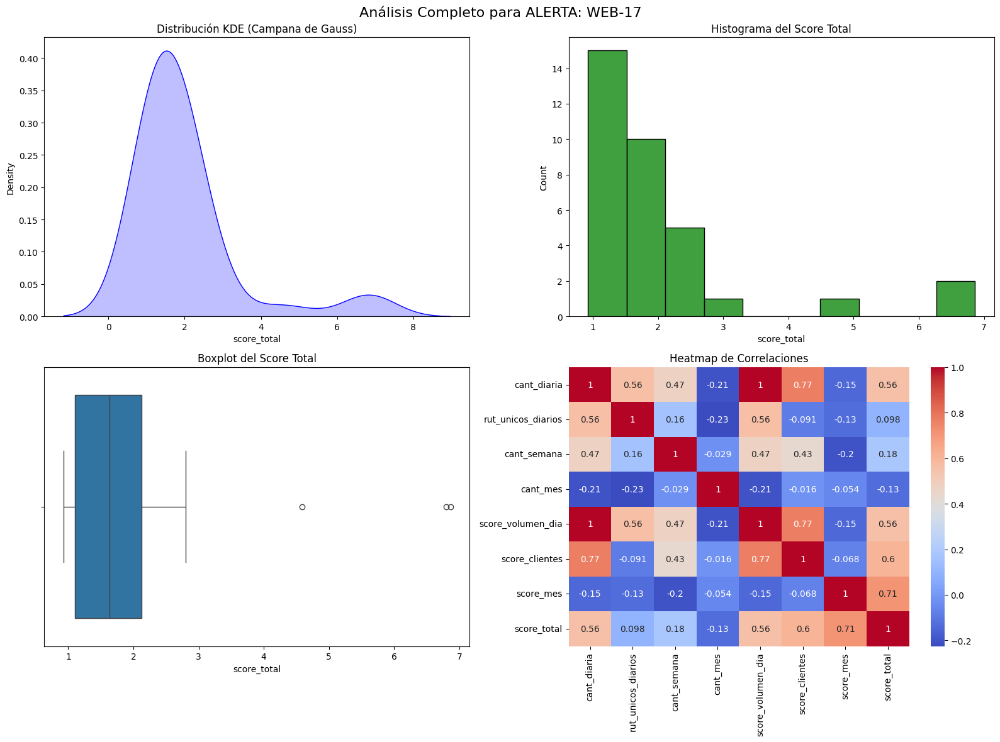

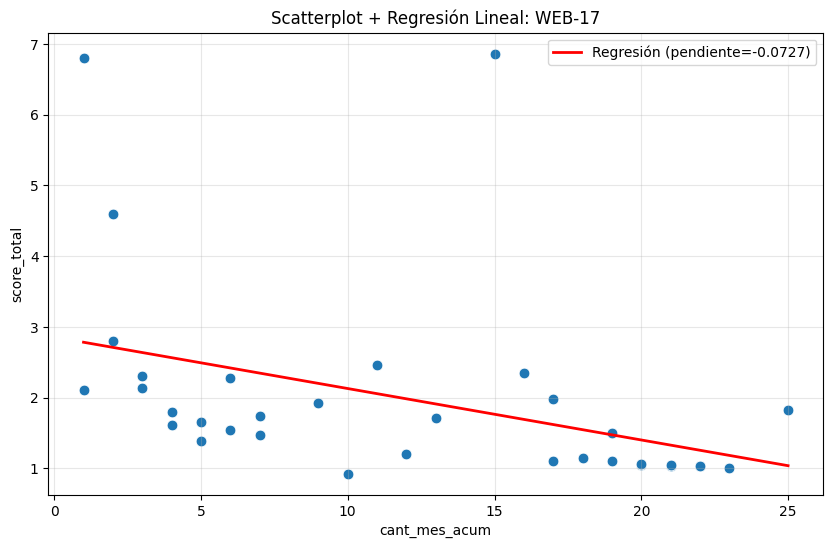


ALERTA: WPP-01



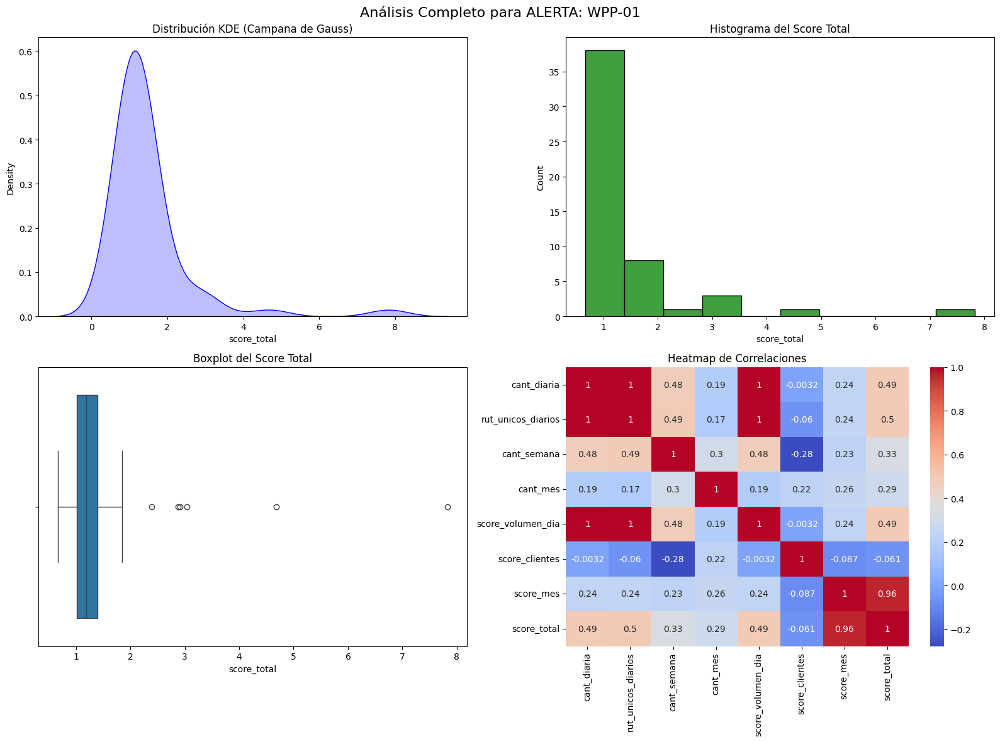

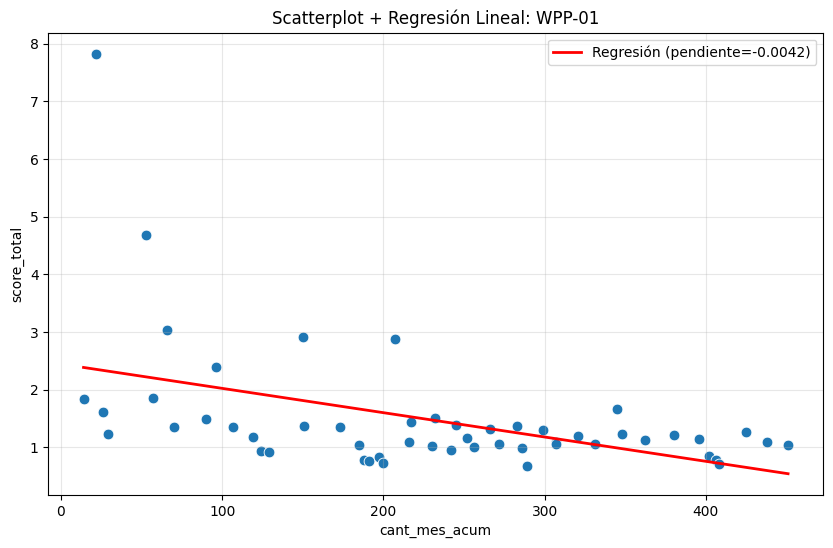


ALERTA: WPP-02



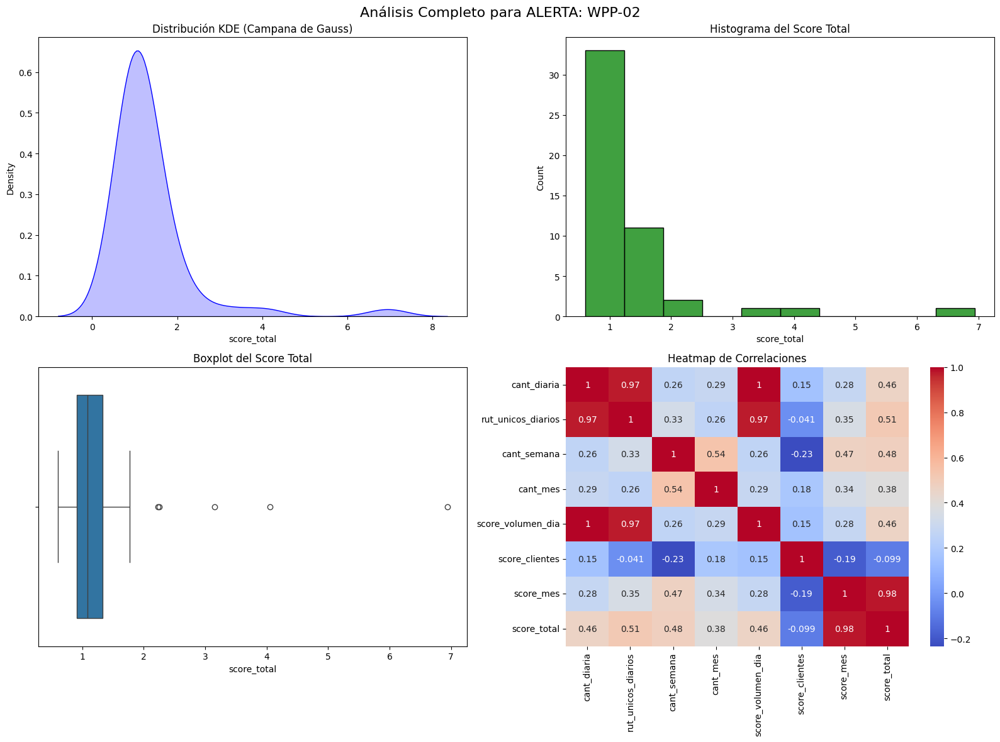

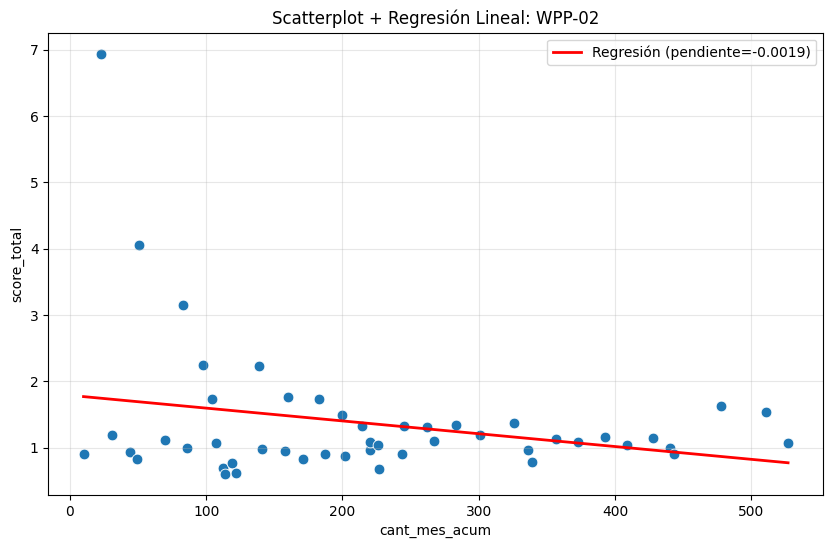

In [41]:
for alerta in df_final["ALERTA"].unique():
    print("\n=======================================")
    print("ALERTA:", alerta)
    print("=======================================\n")
    panel_alerta(df_final, alerta)


In [42]:
df_final['y_anom'] = (df_final['categoria'] != 'NORMAL').astype(int)


In [43]:
features = [
    "cant_diaria", "rut_unicos_diarios",
    "cant_semana", "cant_mes",
    "cant_semana_prev", "cant_mes_prev",
    "pct_cambio_semana", "pct_cambio_mes",
    "score_volumen_dia", "score_clientes", "score_mes"
]


In [44]:
df_final = df_final.sort_values("FECHA_ALERTA")
ultimo_dia = df_final["FECHA_ALERTA"].max()

train = df_final[df_final["FECHA_ALERTA"] <  ultimo_dia].copy()
test  = df_final[df_final["FECHA_ALERTA"] == ultimo_dia].copy()

X_train = train[features]
X_test  = test[features]
y_train = train["y_anom"]
y_test  = test["y_anom"]


In [45]:
iso_global = IsolationForest(
    n_estimators=200,
    contamination=0.05,
    random_state=42
)
iso_global.fit(X_train)

# Predicción: -1 anómalo, 1 normal
test["iso_pred"] = iso_global.predict(X_test)
test["iso_anom"] = (test["iso_pred"] == -1).astype(int)


In [46]:
print(confusion_matrix(y_test, test["iso_anom"]))
print(classification_report(y_test, test["iso_anom"]))


[[35  2]
 [ 2  0]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        37
           1       0.00      0.00      0.00         2

    accuracy                           0.90        39
   macro avg       0.47      0.47      0.47        39
weighted avg       0.90      0.90      0.90        39



In [47]:
# 1 = anómalo si la categoría es CRITICA
df_final["anom_label"] = (df_final["categoria"] == "CRITICA").astype(int)

df_final["anom_label"].value_counts()



anom_label
0    7819
1     863
Name: count, dtype: int64

In [48]:
features = [
    "cant_diaria",
    "rut_unicos_diarios",
    "cant_semana",
    "cant_mes",
    "cant_mes_acum",
    "score_volumen_dia",
    "score_clientes",
    "score_mes",
    "score_total",
]

X = df_final[features].copy()
y = df_final["anom_label"].copy()

# Reemplazar inf por NaN
X = X.replace([np.inf, -np.inf], np.nan)

# Eliminar filas con algún NaN en las features
mask = ~X.isna().any(axis=1)
X = X[mask]
y = y[mask]

# Train / test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train.shape, X_test.shape


((6945, 9), (1737, 9))

In [50]:
perc_global = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("clf", Perceptron(random_state=42))
])

perc_global.fit(X_train, y_train)

y_pred = perc_global.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[1559    5]
 [   9  164]]
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1564
           1       0.97      0.95      0.96       173

    accuracy                           0.99      1737
   macro avg       0.98      0.97      0.98      1737
weighted avg       0.99      0.99      0.99      1737



In [51]:
lof_model = Pipeline([
    ("scaler", StandardScaler()),
    ("lof", LocalOutlierFactor(n_neighbors=20, contamination=0.05))
])

y_pred_lof = lof_model.fit_predict(X)
y_pred_lof = (y_pred_lof == -1).astype(int)

print(classification_report(y, y_pred_lof))


              precision    recall  f1-score   support

           0       0.91      0.96      0.94      7819
           1       0.34      0.17      0.23       863

    accuracy                           0.88      8682
   macro avg       0.63      0.57      0.58      8682
weighted avg       0.86      0.88      0.87      8682



In [70]:
features = [
    "cant_diaria",
    "rut_unicos_diarios",
    "cant_semana",
    "cant_mes",
    "cant_mes_acum",
    "score_volumen_dia",
    "score_clientes",
    "score_mes",
    "score_total",
]

X = df_final[features].replace([np.inf, -np.inf], np.nan)
y = df_final["anom_label"]

mask = ~X.isna().any(axis=1)
X = X[mask]
y = y[mask]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


In [71]:
rf_clf = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("clf", RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        random_state=42,
        n_jobs=-1,
        class_weight="balanced"  # importante por desbalance
    ))
])

rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_test)

print("Random Forest - Matriz de confusión")
print(confusion_matrix(y_test, y_pred_rf))
print("\nRandom Forest - Classification report")
print(classification_report(y_test, y_pred_rf))


Random Forest - Matriz de confusión
[[1564    0]
 [   0  173]]

Random Forest - Classification report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1564
           1       1.00      1.00      1.00       173

    accuracy                           1.00      1737
   macro avg       1.00      1.00      1.00      1737
weighted avg       1.00      1.00      1.00      1737



In [72]:
acc_rf  = accuracy_score(y_test, y_pred_rf)
prec_rf = precision_score(y_test, y_pred_rf)
rec_rf  = recall_score(y_test, y_pred_rf)
f1_rf   = f1_score(y_test, y_pred_rf)

acc_rf, prec_rf, rec_rf, f1_rf


(1.0, 1.0, 1.0, 1.0)

In [73]:
# === Preprocesamiento para DL (imputación + escalado) ===
imputer_dl = SimpleImputer(strategy="median")
scaler_dl  = StandardScaler()

X_train_dl = imputer_dl.fit_transform(X_train)
X_test_dl  = imputer_dl.transform(X_test)

input_dim = X_train_dl.shape[1]

# === Definición del MLP ===
mlp_model = models.Sequential([
    layers.Input(shape=(input_dim,)),
    layers.Dense(64, activation="relu"),
    layers.Dense(32, activation="relu"),
    layers.Dense(1, activation="sigmoid")
])

mlp_model.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

early_stop = callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

history_mlp = mlp_model.fit(
    X_train_dl, y_train,
    validation_split=0.2,
    epochs=50,
    batch_size=64,
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8362 - loss: 5.9211 - val_accuracy: 0.9150 - val_loss: 2.3260
Epoch 2/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8817 - loss: 2.4348 - val_accuracy: 0.9352 - val_loss: 2.6347
Epoch 3/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9051 - loss: 1.5036 - val_accuracy: 0.8495 - val_loss: 1.8279
Epoch 4/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8987 - loss: 2.6434 - val_accuracy: 0.8639 - val_loss: 1.3704
Epoch 5/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9213 - loss: 1.3906 - val_accuracy: 0.9410 - val_loss: 1.5229
Epoch 6/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9246 - loss: 1.1526 - val_accuracy: 0.9395 - val_loss: 1.0626
Epoch 7/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9131 - loss: 2.1825 - val_accuracy: 0.9222 - val_loss: 0.9107
Epoch 8/50
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9300 - loss: 1.4415 - val_accuracy: 0.9359 - val_loss:

In [75]:
y_proba_mlp = mlp_model.predict(X_test_dl).ravel()
y_pred_mlp  = (y_proba_mlp >= 0.5).astype(int)

print("MLP - Matriz de confusión")
print(confusion_matrix(y_test, y_pred_mlp))
print("\nMLP - Classification report")
print(classification_report(y_test, y_pred_mlp))

acc_mlp  = accuracy_score(y_test, y_pred_mlp)
prec_mlp = precision_score(y_test, y_pred_mlp)
rec_mlp  = recall_score(y_test, y_pred_mlp)
f1_mlp   = f1_score(y_test, y_pred_mlp)

acc_mlp, prec_mlp, rec_mlp, f1_mlp


55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
MLP - Matriz de confusión
[[1512   52]
 [  40  133]]

MLP - Classification report
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1564
           1       0.72      0.77      0.74       173

    accuracy                           0.95      1737
   macro avg       0.85      0.87      0.86      1737
weighted avg       0.95      0.95      0.95      1737



(0.947035118019574, 0.7189189189189189, 0.7687861271676301, 0.7430167597765364)

In [76]:
# Usamos las mismas X_train/X_test
imputer_ae = SimpleImputer(strategy="median")
scaler_ae  = StandardScaler()

# Entrenamos solo con ejemplos normales (y_train == 0)
X_train_norm = X_train[y_train == 0]

X_train_norm_ae = imputer_ae.fit_transform(X_train_norm)
X_train_norm_ae = scaler_ae.fit_transform(X_train_norm_ae)

X_test_ae = imputer_ae.transform(X_test)
X_test_ae = scaler_ae.transform(X_test_ae)

input_dim = X_train_norm_ae.shape[1]


In [77]:
encoding_dim1 = 32
encoding_dim2 = 16

input_layer = layers.Input(shape=(input_dim,))
encoded = layers.Dense(encoding_dim1, activation="relu")(input_layer)
encoded = layers.Dense(encoding_dim2, activation="relu")(encoded)

decoded = layers.Dense(encoding_dim1, activation="relu")(encoded)
decoded = layers.Dense(input_dim, activation="linear")(decoded)

autoencoder = models.Model(inputs=input_layer, outputs=decoded)

autoencoder.compile(optimizer="adam", loss="mse")

early_stop_ae = callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

history_ae = autoencoder.fit(
    X_train_norm_ae, X_train_norm_ae,
    validation_split=0.2,
    epochs=50,
    batch_size=64,
    callbacks=[early_stop_ae],
    verbose=1
)


Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7218 - val_loss: 0.2435
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1499 - val_loss: 0.0433
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0598 - val_loss: 0.0240
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0383 - val_loss: 0.0161
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0263 - val_loss: 0.0144
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0186 - val_loss: 0.0109
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - val_loss: 0.0092
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0115 - val_loss: 0.0082
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0100 - val_loss: 0.0078
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0093 - val_loss: 0.0073
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0086 - val_loss: 0.0064
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0084 - val_lo

In [78]:
# Error de reconstrucción en training (normales)
recon_train = autoencoder.predict(X_train_norm_ae)
mse_train = np.mean(np.power(X_train_norm_ae - recon_train, 2), axis=1)

# Umbral, por ejemplo percentil 95 del error de entrenamiento
umbral = np.percentile(mse_train, 95)
umbral


196/196 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step


np.float64(0.004586611656179012)

In [79]:
recon_test = autoencoder.predict(X_test_ae)
mse_test = np.mean(np.power(X_test_ae - recon_test, 2), axis=1)

# 1 = anómalo si el error supera el umbral
y_pred_ae = (mse_test > umbral).astype(int)

print("Autoencoder - Matriz de confusión")
print(confusion_matrix(y_test, y_pred_ae))
print("\nAutoencoder - Classification report")
print(classification_report(y_test, y_pred_ae))

acc_ae  = accuracy_score(y_test, y_pred_ae)
prec_ae = precision_score(y_test, y_pred_ae, zero_division=0)
rec_ae  = recall_score(y_test, y_pred_ae)
f1_ae   = f1_score(y_test, y_pred_ae)

acc_ae, prec_ae, rec_ae, f1_ae


55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Autoencoder - Matriz de confusión
[[1483   81]
 [  51  122]]

Autoencoder - Classification report
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      1564
           1       0.60      0.71      0.65       173

    accuracy                           0.92      1737
   macro avg       0.78      0.83      0.80      1737
weighted avg       0.93      0.92      0.93      1737



(0.924006908462867, 0.6009852216748769, 0.7052023121387283, 0.648936170212766)

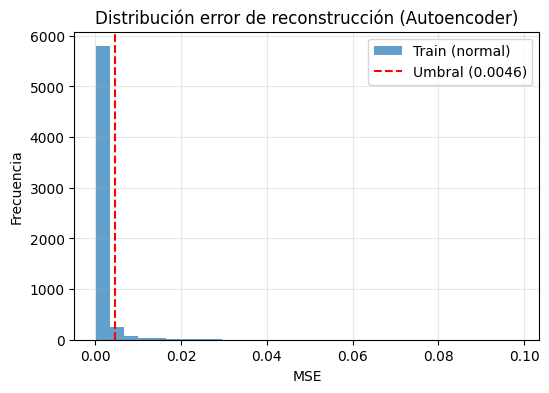

In [80]:
plt.figure(figsize=(6,4))
plt.hist(mse_train, bins=30, alpha=0.7, label="Train (normal)")
plt.axvline(umbral, color="red", linestyle="--", label=f"Umbral ({umbral:.4f})")
plt.title("Distribución error de reconstrucción (Autoencoder)")
plt.xlabel("MSE")
plt.ylabel("Frecuencia")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


In [84]:
# === Métricas del Perceptrón Global ===
acc_perc  = accuracy_score(y_test, y_pred)
prec_perc = precision_score(y_test, y_pred)
rec_perc  = recall_score(y_test, y_pred)
f1_perc   = f1_score(y_test, y_pred)

acc_perc, prec_perc, rec_perc, f1_perc


(0.9919401266551525,
 0.9704142011834319,
 0.9479768786127167,
 0.9590643274853801)

In [89]:
iso_split = IsolationForest(
    n_estimators=200,
    contamination=0.05,
    random_state=42
)

iso_split.fit(X_train)

y_pred_iso_split = iso_split.predict(X_test)
y_pred_iso_split = (y_pred_iso_split == -1).astype(int)

acc_iso = accuracy_score(y_test, y_pred_iso_split)
prec_iso = precision_score(y_test, y_pred_iso_split, zero_division=0)
rec_iso = recall_score(y_test, y_pred_iso_split)
f1_iso = f1_score(y_test, y_pred_iso_split)

acc_iso, prec_iso, rec_iso, f1_iso


(0.8934945308002303, 0.4375, 0.24277456647398843, 0.31226765799256506)

In [87]:
# === Métricas LOF split ===
acc_lof  = accuracy_score(y_test, y_pred_lof_split)
prec_lof = precision_score(y_test, y_pred_lof_split)
rec_lof  = recall_score(y_test, y_pred_lof_split)
f1_lof   = f1_score(y_test, y_pred_lof_split)

acc_lof, prec_lof, rec_lof, f1_lof


(0.8756476683937824,
 0.2912621359223301,
 0.17341040462427745,
 0.21739130434782608)

In [90]:
resultados = []

# Ejemplo con Perceptrón (ya lo tienes)
resultados.append({
    "Modelo": "Perceptrón",
    "Tipo": "DL Supervisado",
    "Conjunto": "Test split",
    "Precision_1": prec_perc,   # ya lo tienes
    "Recall_1": rec_perc,
    "F1_1": f1_perc,
    "Accuracy": acc_perc
})

# Random Forest (ML)
resultados.append({
    "Modelo": "Random Forest",
    "Tipo": "ML Supervisado",
    "Conjunto": "Test split",
    "Precision_1": prec_rf,
    "Recall_1": rec_rf,
    "F1_1": f1_rf,
    "Accuracy": acc_rf
})

# Isolation Forest (ML no supervisado)
resultados.append({
    "Modelo": "Isolation Forest",
    "Tipo": "ML No supervisado",
    "Conjunto": "Test split",
    "Precision_1": prec_iso,
    "Recall_1": rec_iso,
    "F1_1": f1_iso,
    "Accuracy": acc_iso
})

# LOF split (ML no supervisado)
resultados.append({
    "Modelo": "LOF (split)",
    "Tipo": "ML No supervisado",
    "Conjunto": "Test split",
    "Precision_1": prec_lof,
    "Recall_1": rec_lof,
    "F1_1": f1_lof,
    "Accuracy": acc_lof
})

# MLP (DL supervisado)
resultados.append({
    "Modelo": "MLP",
    "Tipo": "DL Supervisado",
    "Conjunto": "Test split",
    "Precision_1": prec_mlp,
    "Recall_1": rec_mlp,
    "F1_1": f1_mlp,
    "Accuracy": acc_mlp
})

# Autoencoder (DL no supervisado)
resultados.append({
    "Modelo": "Autoencoder",
    "Tipo": "DL No supervisado",
    "Conjunto": "Test split",
    "Precision_1": prec_ae,
    "Recall_1": rec_ae,
    "F1_1": f1_ae,
    "Accuracy": acc_ae
})

df_metricas_final = pd.DataFrame(resultados)
df_metricas_final



,Modelo,Tipo,Conjunto,Precision_1,Recall_1,F1_1,Accuracy
0,Perceptrón,DL Supervisado,Test split,0.970414,0.947977,0.959064,0.991940
1,Random Forest,ML Supervisado,Test split,1.000000,1.000000,1.000000,1.000000
2,Isolation Forest,ML No supervisado,Test split,0.437500,0.242775,0.312268,0.893495
3,LOF (split),ML No supervisado,Test split,0.291262,0.173410,0.217391,0.875648
4,MLP,DL Supervisado,Test split,0.718919,0.768786,0.743017,0.947035
5,Autoencoder,DL No supervisado,Test split,0.600985,0.705202,0.648936,0.924007


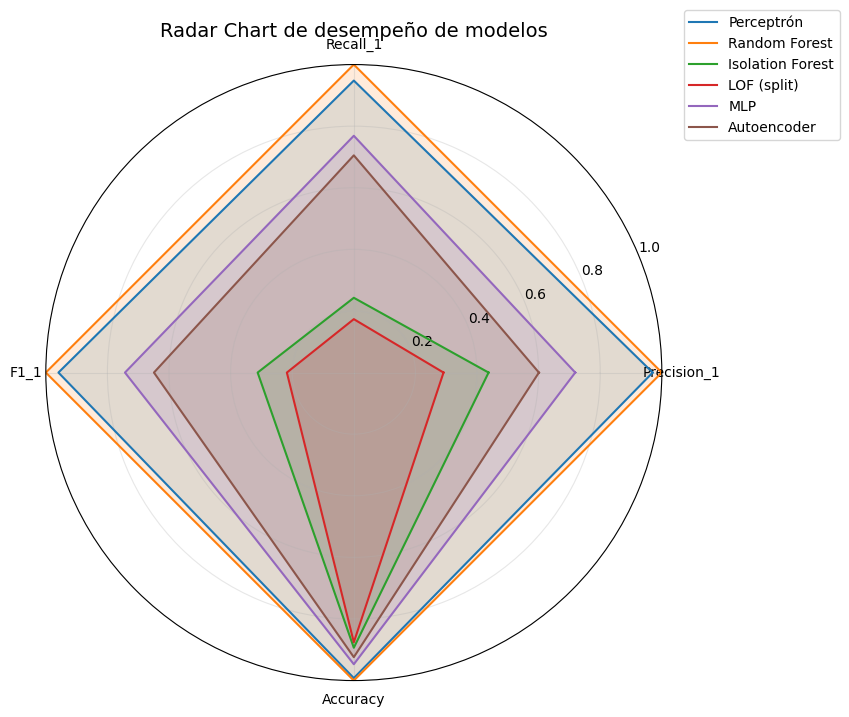

In [92]:
# Usamos tu tabla final
df_plot = df_metricas_final.copy()

# Métricas que vamos a graficar
metricas = ["Precision_1", "Recall_1", "F1_1", "Accuracy"]
N = len(metricas)

# Ángulos para el radar
angles = np.linspace(0, 2 * np.pi, N, endpoint=False)
# Cerramos el polígono repitiendo el primer ángulo al final
angles = np.concatenate((angles, [angles[0]]))

plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

for idx, row in df_plot.iterrows():
    valores = row[metricas].values
    # Cerramos el polígono repitiendo el primer valor
    valores = np.concatenate((valores, [valores[0]]))
    ax.plot(angles, valores, linewidth=1.5, label=row["Modelo"])
    ax.fill(angles, valores, alpha=0.15)

# Etiquetas de los ejes
ax.set_xticks(angles[:-1])
ax.set_xticklabels(metricas)

# Rango de 0 a 1 (tus métricas ya están en ese rango)
ax.set_ylim(0, 1)

ax.set_title("Radar Chart de desempeño de modelos", fontsize=14, pad=20)
ax.grid(True, alpha=0.3)
ax.legend(loc="upper right", bbox_to_anchor=(1.3, 1.1))

plt.show()


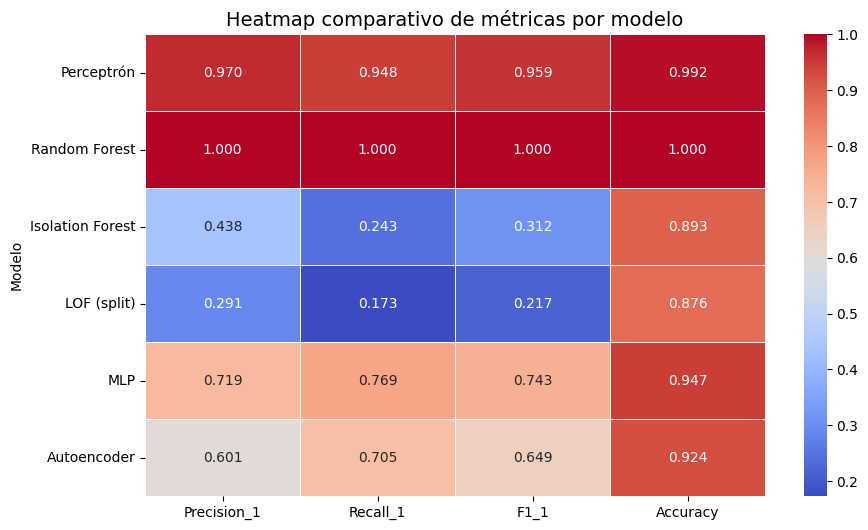

In [93]:
df_plot = df_metricas_final.set_index("Modelo")[["Precision_1", "Recall_1", "F1_1", "Accuracy"]]

plt.figure(figsize=(10,6))
sns.heatmap(df_plot, annot=True, fmt=".3f", cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap comparativo de métricas por modelo", fontsize=14)
plt.show()


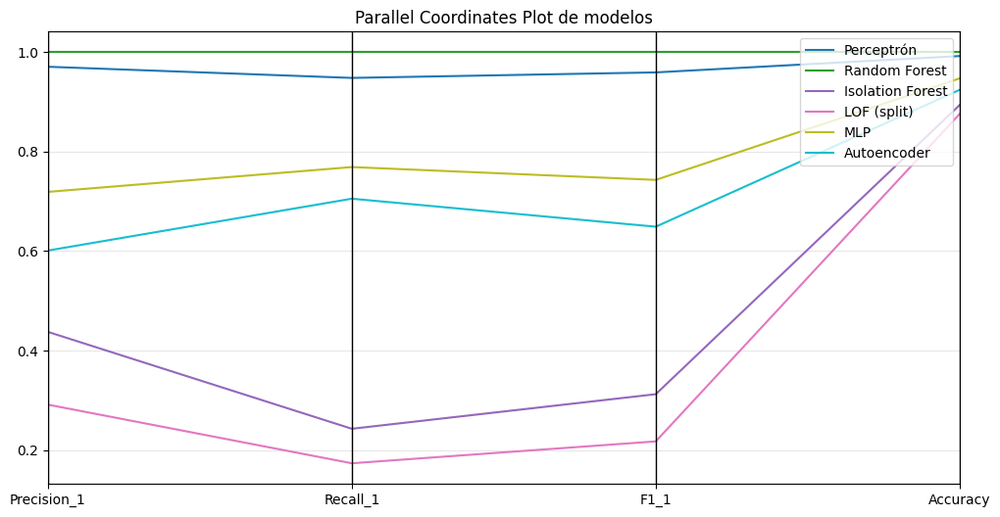

In [94]:
from pandas.plotting import parallel_coordinates

df_par = df_metricas_final.copy()
df_par["Grupo"] = df_par["Modelo"]  # requerido por parallel_coordinates

plt.figure(figsize=(12,6))
parallel_coordinates(df_par[["Grupo","Precision_1","Recall_1","F1_1","Accuracy"]], 
                     "Grupo", colormap=plt.get_cmap("tab10"))
plt.title("Parallel Coordinates Plot de modelos")
plt.grid(alpha=0.3)
plt.show()


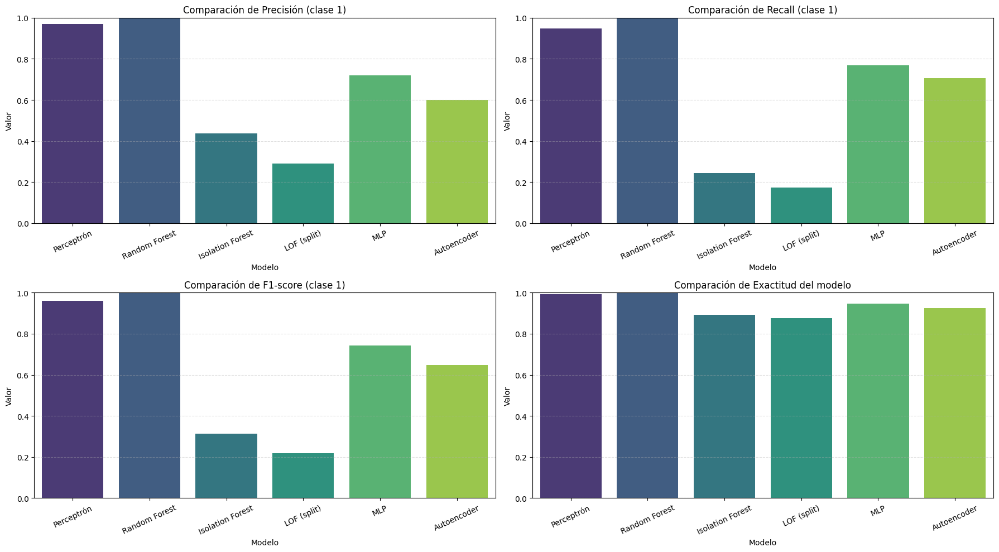

In [95]:
metricas = ["Precision_1", "Recall_1", "F1_1", "Accuracy"]
titulos = {
    "Precision_1": "Precisión (clase 1)",
    "Recall_1": "Recall (clase 1)",
    "F1_1": "F1-score (clase 1)",
    "Accuracy": "Exactitud del modelo"
}

plt.figure(figsize=(18,10))

for i, m in enumerate(metricas, 1):
    plt.subplot(2, 2, i)
    sns.barplot(
        data=df_metricas_final,
        x="Modelo",
        y=m,
        palette="viridis"
    )
    plt.title(f"Comparación de {titulos[m]}", fontsize=12)
    plt.xlabel("Modelo")
    plt.ylabel("Valor")
    plt.xticks(rotation=25)
    plt.ylim(0, 1)  # porque todas las métricas están entre 0 y 1
    plt.grid(axis="y", linestyle="--", alpha=0.4)

plt.tight_layout()
plt.show()

In [96]:
scaler = StandardScaler()
X_train_dl = scaler.fit_transform(X_train)
X_test_dl = scaler.transform(X_test)

# Arquitectura MLP
mlp = models.Sequential([
    layers.Dense(64, activation='relu', input_shape=(X_train_dl.shape[1],)),
    layers.Dense(32, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

mlp.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history_mlp = mlp.fit(
    X_train_dl, y_train,
    validation_split=0.2,
    epochs=40,
    batch_size=32,
    verbose=1
)


C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\keras\src\layers\core\dense.py:95: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/40
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9615 - loss: 0.1989 - val_accuracy: 0.9885 - val_loss: 0.0499
Epoch 2/40
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9872 - loss: 0.0401 - val_accuracy: 0.9899 - val_loss: 0.0276
Epoch 3/40
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9912 - loss: 0.0255 - val_accuracy: 0.9921 - val_loss: 0.0209
Epoch 4/40
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9926 - loss: 0.0212 - val_accuracy: 0.9935 - val_loss: 0.0166
Epoch 5/40
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9944 - loss: 0.0169 - val_accuracy: 0.9942 - val_loss: 0.0165
Epoch 6/40
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9960 - loss: 0.0139 - val_accuracy: 0.9950 - val_loss: 0.0155
Epoch 7/40
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9973 - loss: 0.0113 - val_accuracy: 0.9957 - val_loss: 0.0154
Epoch 8/40
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9964 - loss: 0.0131 - val_accuracy: 0.

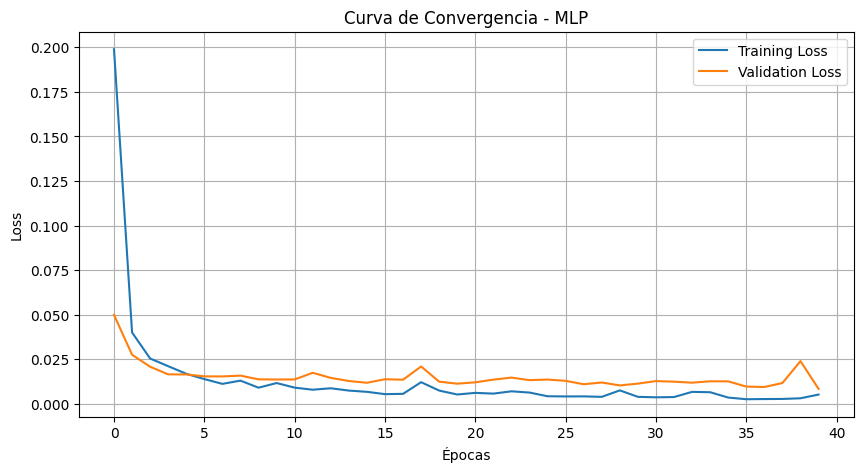

In [97]:
plt.figure(figsize=(10,5))
plt.plot(history_mlp.history['loss'], label='Training Loss')
plt.plot(history_mlp.history['val_loss'], label='Validation Loss')
plt.title('Curva de Convergencia - MLP')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


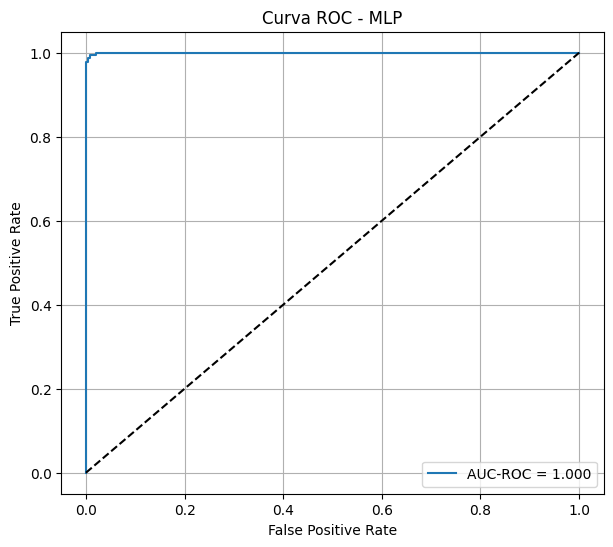

AUC-ROC: 0.9997745516904927


In [101]:


y_pred_proba = mlp.predict(X_test_dl).ravel()

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7,6))
plt.plot(fpr, tpr, label=f"AUC-ROC = {roc_auc:.3f}")
plt.plot([0,1], [0,1], 'k--')
plt.title("Curva ROC - MLP")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

print("AUC-ROC:", roc_auc)


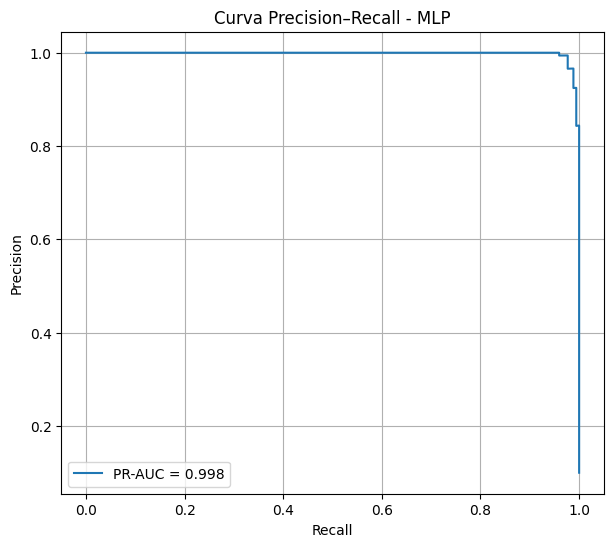

PR-AUC: 0.9981670087513732


In [103]:
precision, recall, thresholds_pr = precision_recall_curve(y_test, y_pred_proba)
pr_auc = average_precision_score(y_test, y_pred_proba)

plt.figure(figsize=(7,6))
plt.plot(recall, precision, label=f"PR-AUC = {pr_auc:.3f}")
plt.title("Curva Precision–Recall - MLP")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True)
plt.show()

print("PR-AUC:", pr_auc)


In [104]:
input_dim = X_train_dl.shape[1]

autoencoder = models.Sequential([
    layers.Dense(64, activation='relu', input_shape=(input_dim,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(input_dim, activation='linear')
])

autoencoder.compile(optimizer='adam', loss='mse')

history_ae = autoencoder.fit(
    X_train_dl, X_train_dl,
    validation_split=0.2,
    epochs=50,
    batch_size=32,
    verbose=1
)


Epoch 1/50


C:\Users\gonza\anaconda3\envs\Alerta_IA\Lib\site-packages\keras\src\layers\core\dense.py:95: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3383 - val_loss: 0.0860
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0861 - val_loss: 0.0213
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0270 - val_loss: 0.0116
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128 - val_loss: 0.0096
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0101 - val_loss: 0.0136
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129 - val_loss: 0.0084
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0105 - val_loss: 0.0085
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073 - val_loss: 0.0144
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247 - val_loss: 0.0201
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0336 - val_loss: 0.0071
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125 - val_loss: 0.0121
Epoch 12/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.

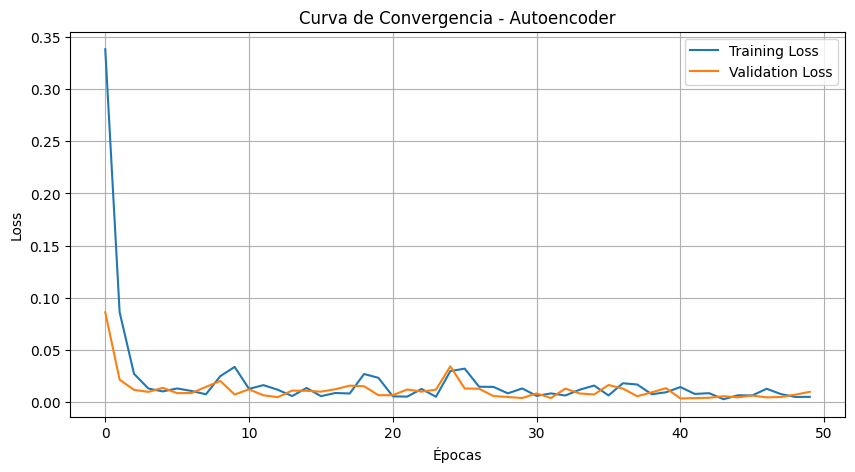

In [105]:
plt.figure(figsize=(10,5))
plt.plot(history_ae.history['loss'], label='Training Loss')
plt.plot(history_ae.history['val_loss'], label='Validation Loss')
plt.title('Curva de Convergencia - Autoencoder')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [107]:
# ---- Calcular reconstrucción del AE ----
X_test_pred = autoencoder.predict(X_test_dl)

# Error de reconstrucción (L2)
err = np.mean(np.square(X_test_dl - X_test_pred), axis=1)


55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


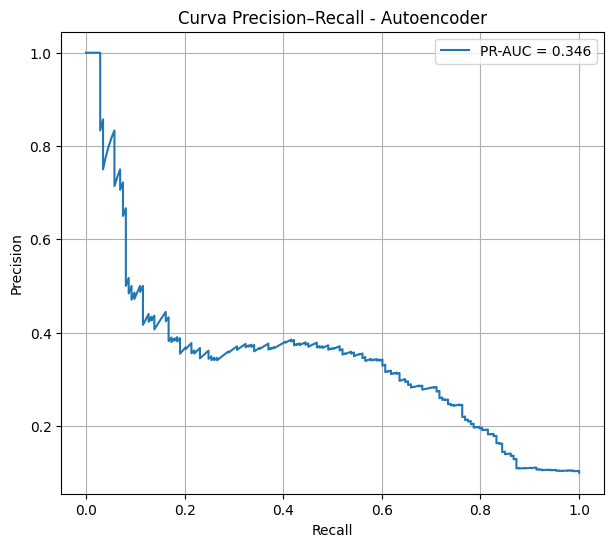

PR-AUC (AE): 0.3464278556230836


In [108]:
precision_ae, recall_ae, thr_pr_ae = precision_recall_curve(y_test, err)
pr_auc_ae = average_precision_score(y_test, err)

plt.figure(figsize=(7,6))
plt.plot(recall_ae, precision_ae, label=f"PR-AUC = {pr_auc_ae:.3f}")
plt.title("Curva Precision–Recall - Autoencoder")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True)
plt.show()

print("PR-AUC (AE):", pr_auc_ae)


In [109]:
f1_scores = 2 * (precision_ae * recall_ae) / (precision_ae + recall_ae + 1e-8)
best_idx = np.argmax(f1_scores)
best_threshold = thr_pr_ae[best_idx]

print("Mejor threshold:", best_threshold)
print("Mejor F1:", f1_scores[best_idx])


Mejor threshold: 0.004245577615662095
Mejor F1: 0.4360586955867604


In [112]:
resultados = []

# =====================================================================
# 1) RANDOM FOREST  (ML supervisado)
# =====================================================================
rf = RandomForestClassifier(n_estimators=300, random_state=42)
rf.fit(X_train, y_train)

rf_pred   = rf.predict(X_test)
rf_scores = rf.predict_proba(X_test)[:, 1]

resultados.append({
    "Modelo": "Random Forest",
    "Tipo": "ML Supervisado",
    "Precision_1": precision_score(y_test, rf_pred),
    "Recall_1":    recall_score(y_test, rf_pred),
    "F1_1":        f1_score(y_test, rf_pred),
    "Accuracy":    accuracy_score(y_test, rf_pred),
    "PR_AUC":      average_precision_score(y_test, rf_scores),
    "ROC_AUC":     roc_auc_score(y_test, rf_scores)
})

# =====================================================================
# 2) PERCEPTRÓN GLOBAL (DL supervisado, ya entrenado)
# =====================================================================
perc_pred   = perc_global.predict(X_test)
perc_scores = perc_global.decision_function(X_test)

resultados.append({
    "Modelo": "Perceptrón",
    "Tipo": "DL Supervisado",
    "Precision_1": precision_score(y_test, perc_pred),
    "Recall_1":    recall_score(y_test, perc_pred),
    "F1_1":        f1_score(y_test, perc_pred),
    "Accuracy":    accuracy_score(y_test, perc_pred),
    "PR_AUC":      average_precision_score(y_test, perc_scores),
    "ROC_AUC":     roc_auc_score(y_test, perc_scores)
})

# =====================================================================
# 3) MLP (Keras, ya entrenado sobre X_train_dl / X_test_dl)
# =====================================================================
mlp_scores = mlp.predict(X_test_dl).ravel()
mlp_pred   = (mlp_scores > 0.5).astype(int)

resultados.append({
    "Modelo": "MLP",
    "Tipo": "DL Supervisado",
    "Precision_1": precision_score(y_test, mlp_pred),
    "Recall_1":    recall_score(y_test, mlp_pred),
    "F1_1":        f1_score(y_test, mlp_pred),
    "Accuracy":    accuracy_score(y_test, mlp_pred),
    "PR_AUC":      average_precision_score(y_test, mlp_scores),
    "ROC_AUC":     roc_auc_score(y_test, mlp_scores)
})

# =====================================================================
# 4) AUTOENCODER (DL no supervisado, usando error de reconstrucción `err`)
# =====================================================================
ae_scores = err                      # score continuo
# Para métricas de clasificador, definimos un umbral base (por ejemplo mediana)
ae_thr    = np.median(ae_scores)
ae_pred   = (ae_scores > ae_thr).astype(int)

resultados.append({
    "Modelo": "Autoencoder",
    "Tipo": "DL No supervisado",
    "Precision_1": precision_score(y_test, ae_pred),
    "Recall_1":    recall_score(y_test, ae_pred),
    "F1_1":        f1_score(y_test, ae_pred),
    "Accuracy":    accuracy_score(y_test, ae_pred),
    "PR_AUC":      average_precision_score(y_test, ae_scores),
    "ROC_AUC":     roc_auc_score(y_test, ae_scores)
})

# =====================================================================
# 5) ISOLATION FOREST (ML no supervisado)  -> se reentrena con X_train actual
# =====================================================================
iso_global = IsolationForest(
    n_estimators=200,
    contamination=0.05,
    random_state=42
)
iso_global.fit(X_train)

iso_scores = iso_global.decision_function(X_test)     # score continuo
iso_pred   = (iso_global.predict(X_test) == -1).astype(int)   # 1 = anómalo

resultados.append({
    "Modelo": "Isolation Forest",
    "Tipo": "ML No supervisado",
    "Precision_1": precision_score(y_test, iso_pred, zero_division=0),
    "Recall_1":    recall_score(y_test, iso_pred, zero_division=0),
    "F1_1":        f1_score(y_test, iso_pred, zero_division=0),
    "Accuracy":    accuracy_score(y_test, iso_pred),
    "PR_AUC":      average_precision_score(y_test, iso_scores),
    "ROC_AUC":     roc_auc_score(y_test, iso_scores)
})

# =====================================================================
# 6) LOF (split)  (ML no supervisado, ya entrenado con X_train actual)
# =====================================================================
lof_scores = lof_split.decision_function(X_test)
lof_pred   = (lof_split.predict(X_test) == -1).astype(int)

resultados.append({
    "Modelo": "LOF (split)",
    "Tipo": "ML No supervisado",
    "Precision_1": precision_score(y_test, lof_pred, zero_division=0),
    "Recall_1":    recall_score(y_test, lof_pred, zero_division=0),
    "F1_1":        f1_score(y_test, lof_pred, zero_division=0),
    "Accuracy":    accuracy_score(y_test, lof_pred),
    "PR_AUC":      average_precision_score(y_test, lof_scores),
    "ROC_AUC":     roc_auc_score(y_test, lof_scores)
})

# =====================================================================
# TABLA FINAL DE COMPARACIÓN
# =====================================================================
df_metricas_full = pd.DataFrame(resultados)
display(df_metricas_full)




55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step


,Modelo,Tipo,Precision_1,Recall_1,F1_1,Accuracy,PR_AUC,ROC_AUC
0,Random Forest,ML Supervisado,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,Perceptrón,DL Supervisado,0.970414,0.947977,0.959064,0.991940,0.970723,0.980519
2,MLP,DL Supervisado,0.994083,0.971098,0.982456,0.996546,0.998167,0.999775
3,Autoencoder,DL No supervisado,0.165899,0.832370,0.276657,0.566494,0.346428,0.775420
4,Isolation Forest,ML No supervisado,0.437500,0.242775,0.312268,0.893495,0.054653,0.088250
5,LOF (split),ML No supervisado,0.291262,0.173410,0.217391,0.875648,0.066138,0.294081


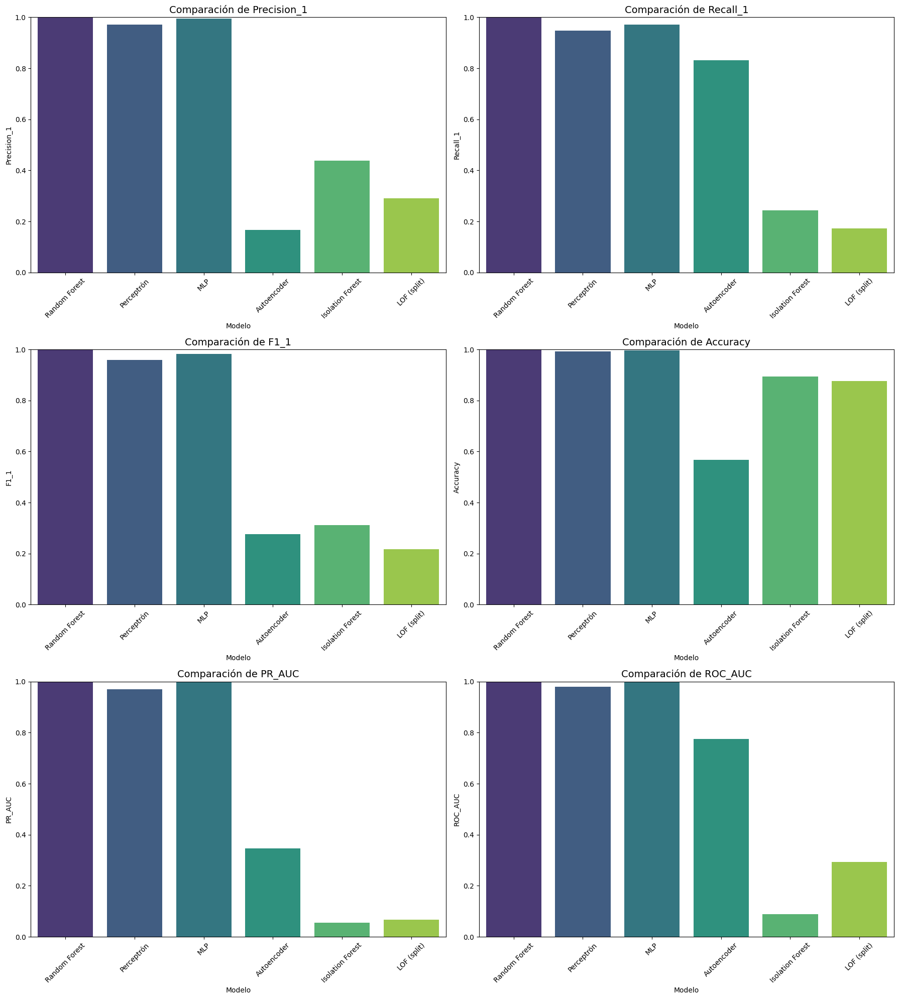

In [114]:
metricas = ["Precision_1", "Recall_1", "F1_1", "Accuracy", "PR_AUC", "ROC_AUC"]

plt.figure(figsize=(18, 20))

for i, m in enumerate(metricas, 1):
    plt.subplot(3, 2, i)
    sns.barplot(data=df_metricas_full, x="Modelo", y=m, palette="viridis")
    plt.title(f"Comparación de {m}", fontsize=14)
    plt.xlabel("Modelo")
    plt.ylabel(m)
    plt.xticks(rotation=45)
    plt.ylim(0, 1)

plt.tight_layout()
plt.show()


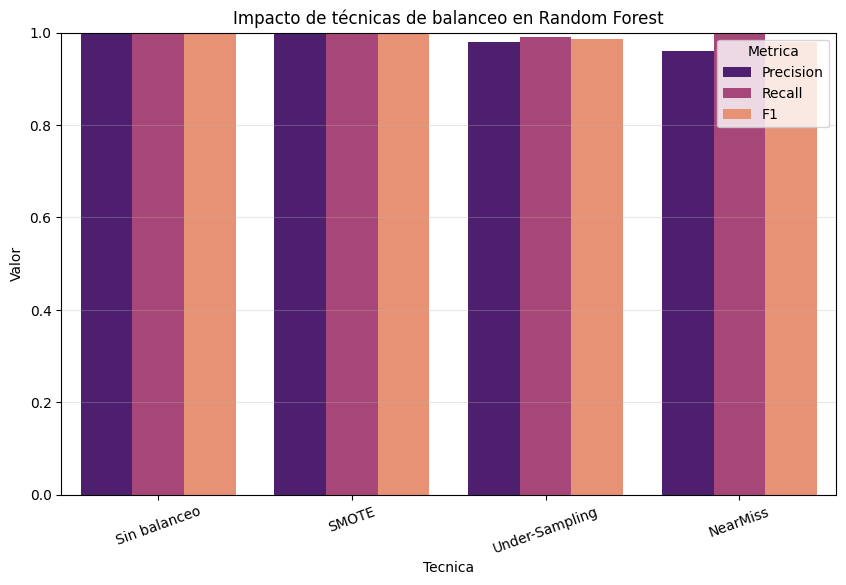

In [115]:
rf_data = pd.DataFrame({
    "Tecnica": ["Sin balanceo","SMOTE","Under-Sampling","NearMiss"],
    "Precision":[1.00,1.00,0.98,0.96],
    "Recall":[1.00,1.00,0.99,1.00],
    "F1":[1.00,1.00,0.985,0.98]
})

rf_plot = rf_data.melt(id_vars="Tecnica", var_name="Metrica", value_name="Valor")

plt.figure(figsize=(10,6))
sns.barplot(data=rf_plot, x="Tecnica", y="Valor", hue="Metrica", palette="magma")
plt.title("Impacto de técnicas de balanceo en Random Forest")
plt.ylim(0,1)
plt.xticks(rotation=20)
plt.grid(axis="y", alpha=0.3)
plt.show()


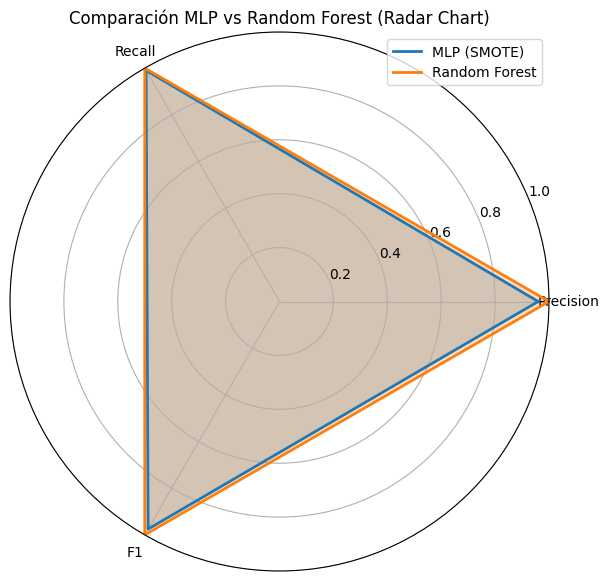

In [116]:

labels = ["Precision", "Recall", "F1"]

mlp_scores = [0.96, 0.99, 0.975]   # Mejor caso: SMOTE
rf_scores =  [1.00, 1.00, 1.00]    # Sin balanceo

angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False).tolist()
mlp_scores += mlp_scores[:1]
rf_scores  += rf_scores[:1]
angles     += angles[:1]

fig = plt.figure(figsize=(7,7))
ax = plt.subplot(111, polar=True)

ax.plot(angles, mlp_scores, linewidth=2, label="MLP (SMOTE)")
ax.fill(angles, mlp_scores, alpha=0.25)

ax.plot(angles, rf_scores, linewidth=2, label="Random Forest")
ax.fill(angles, rf_scores, alpha=0.25)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
ax.set_title("Comparación MLP vs Random Forest (Radar Chart)")
ax.set_ylim(0,1)
plt.legend()
plt.show()


In [119]:
import joblib
import os

os.makedirs("modelo", exist_ok=True)

joblib.dump(rf_clf, "modelo/modelo_rf.pkl")
print("Modelo guardado en modelo/modelo_rf.pkl")



Modelo guardado en modelo/modelo_rf.pkl
